# <center><strong>SHOP4YOU : CHURN PREDICTION</strong></center>

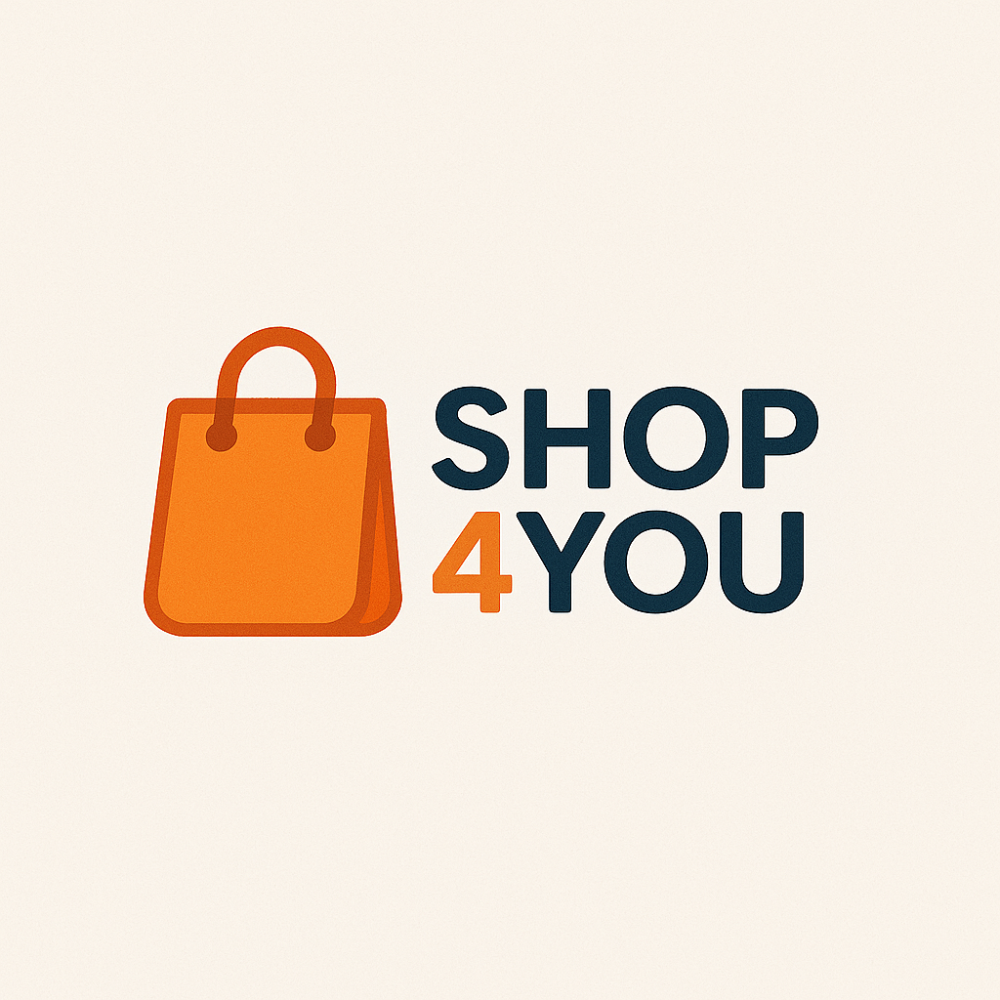

## PROBLEM STATEMENT

Shop4you, a e-commerce company, is facing intense competition from larger marketplaces and niche platforms. One of its key challenges is retaining existing customer accounts, many of which serve as shared family or business accounts. Account-level churn significantly affects overall customer volume and sales. The objective of this project is to build a data-driven churn prediction model that identifies high-risk accounts and enables the company to deploy personalized, cost-effective retention campaigns.

## NEED OF STUDY/PROJECT

Churn directly impacts revenue and profitability. Given that a single ShopEase account may include multiple active customers, losing one account could mean a multi-fold loss in user base, order volume, and brand loyalty. As acquiring new customers is significantly more expensive than retaining existing ones, this study is essential to improving customer retention through smarter, targeted marketing. Additionally, ShopEase requires a balance between preventing churn and avoiding excessive promotional spending that could hurt profit margins

## UNDERSTANDING BUSINESS/SOCIAL OPPORTUNITY

This project provides SHOP4YOU with a valuable business opportunity:

- <strong>Customer Rentition</strong> : The model will help identify churn-prone accounts early, enabling to take preventive measures.
- <strong>Market Campaign</strong>: By segmenting customers based on churn risk and behavior, the marketing team can design targeted offers.
- <strong>Long-Term Growth</strong>: Retaining loyal customers leads to increased lifetime value, word-of-mouth promotion, and better forecasting.
- <strong>Social Value</strong>: By offering meaningful, non-intrusive incentives, Shop4you can enhance customer satisfaction and trust without resorting to unsustainable discounts.


In [703]:
# Library required to suppress any warning messages

import warnings

warnings.filterwarnings("ignore")

# Libraries required for data analysis and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
import seaborn as sns

sns.set(color_codes=True)  # adds background to the graph

# Remove the limit for number of displayed rows and columns
pd.set_option("display.max_rows", 200)
pd.set_option("display.max_columns", None)

# To suppress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.2f" % x)

In [705]:
# Libraries required for data preprocessing
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Library required to split the data
from sklearn.model_selection import train_test_split


In [707]:
df = pd.read_excel("C:/Users/mysel/Desktop/CAPSTONE PROJECT/Customer Churn Data.xlsx")

In [708]:
df.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.00,6.00,Debit Card,Female,3.00,3,Super,2.00,Single,9,1.00,11,1,5,159.93,Mobile
1,20001,1,0,1.00,8.00,UPI,Male,3.00,4,Regular Plus,3.00,Single,7,1.00,15,0,0,120.90,Mobile
2,20002,1,0,1.00,30.00,Debit Card,Male,2.00,4,Regular Plus,3.00,Single,6,1.00,14,0,3,NaN,Mobile
3,20003,1,0,3.00,15.00,Debit Card,Male,2.00,4,Super,5.00,Single,8,0.00,23,0,3,134.07,Mobile
4,20004,1,0,1.00,12.00,Credit Card,Male,2.00,3,Regular Plus,5.00,Single,3,0.00,11,1,3,129.60,Mobile


In [709]:
df.tail()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
11255,31255,0,10,1.00,34.00,Credit Card,Male,3.00,2,Super,1.00,Married,9,0.00,19,1,4,153.71,Computer
11256,31256,0,13,1.00,19.00,Credit Card,Male,3.00,5,HNI,5.00,Married,7,0.00,16,1,8,226.91,Mobile
11257,31257,0,1,1.00,14.00,Debit Card,Male,3.00,2,Super,4.00,Married,7,1.00,22,1,4,191.42,Mobile
11258,31258,0,23,3.00,11.00,Credit Card,Male,4.00,5,Super,4.00,Married,7,0.00,16,2,9,179.90,Computer
11259,31259,0,8,1.00,22.00,Credit Card,Male,3.00,2,Super,3.00,Married,5,0.00,13,2,3,175.04,Mobile


## DATA COLLECTION

In [711]:
df.shape

(11260, 19)

In [712]:
# Shape of data
print(f"Rows: {df.shape[0]}, Columns: {df.shape[1]}")

# View top few rows
df.head()

# Summary of data types
df.info()

# Summary statistics for numerical columns
pd.options.display.float_format = '{:.3f}'.format
df.describe()


Rows: 11260, Columns: 19
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11158 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11148 non-null  object 
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            11158 non-null  object 
 13  Complain_ly              10903 non-null  float64
 1

,AccountID,Churn,City_Tier,CC_Contacted_LY,Service_Score,CC_Agent_Score,Complain_ly
count,11260.000,11260.000,11148.000,11158.000,11162.000,11144.000,10903.000
mean,25629.500,0.168,1.654,17.867,2.903,3.066,0.285
std,3250.626,0.374,0.915,8.853,0.726,1.380,0.452
min,20000.000,0.000,1.000,4.000,0.000,1.000,0.000
25%,22814.750,0.000,1.000,11.000,2.000,2.000,0.000
50%,25629.500,0.000,1.000,16.000,3.000,3.000,0.000
75%,28444.250,0.000,3.000,23.000,3.000,4.000,1.000
max,31259.000,1.000,3.000,132.000,5.000,5.000,1.000


In [713]:
df.isnull().sum()

AccountID                    0
Churn                        0
Tenure                     102
City_Tier                  112
CC_Contacted_LY            102
Payment                    109
Gender                     108
Service_Score               98
Account_user_count         112
account_segment             97
CC_Agent_Score             116
Marital_Status             212
rev_per_month              102
Complain_ly                357
rev_growth_yoy               0
coupon_used_for_payment      0
Day_Since_CC_connect       357
cashback                   471
Login_device               221
dtype: int64

In [714]:
# Checking for duplicated values
df.duplicated().sum()

0

### Special character treament

In [716]:
# Making a list of all categorical variables

cat_cols = [ "Gender", "account_segment",  "Login_device"]


In [717]:
# Printing the number of unique values in each categorical variable

for i in cat_cols:
    print("\nUnique values in", i, "are :")
    print(df[i].value_counts())
    print("\n")
    print("-" * 40)


Unique values in Gender are :
Gender
Male      6328
Female    4178
M          376
F          270
Name: count, dtype: int64


----------------------------------------

Unique values in account_segment are :
account_segment
Super           4062
Regular Plus    3862
HNI             1639
Super Plus       771
Regular          520
Regular +        262
Super +           47
Name: count, dtype: int64


----------------------------------------

Unique values in Login_device are :
Login_device
Mobile      7482
Computer    3018
&&&&         539
Name: count, dtype: int64


----------------------------------------


In [718]:
# Fixing the data entry errors

df["Gender"] = df["Gender"].replace("F", "Female")
df["Gender"] = df["Gender"].replace("M", "Male")
df["account_segment"] = df["account_segment"].replace("Regular +", "Regular Plus")
df["account_segment"] = df["account_segment"].replace("Super +", "Super Plus")

df["Login_device"] = df["Login_device"].replace(
    "&&&&", "Other")

In [719]:
# Printing the number of unique values in each categorical variable

print("Unique values in Gender are :")
print(df["Gender"].value_counts(), "\n")
print("-" * 40)
print("\nUnique values in account_segment are :")
print(df["account_segment"].value_counts())
print("-" * 40)
print("\nUnique values in account_segment are :")
print(df["Login_device"].value_counts())

Unique values in Gender are :
Gender
Male      6704
Female    4448
Name: count, dtype: int64 

----------------------------------------

Unique values in account_segment are :
account_segment
Regular Plus    4124
Super           4062
HNI             1639
Super Plus       818
Regular          520
Name: count, dtype: int64
----------------------------------------

Unique values in account_segment are :
Login_device
Mobile      7482
Computer    3018
Other        539
Name: count, dtype: int64


In [720]:
# Making a list of all numerical variables

num_cols = [
    "Tenure",
    "City_Tier",
    "CC_Contacted_LY",
    "Service_Score",
    "Account_user_count",
    "CC_Agent_Score",
    "rev_per_month",
    "Complain_ly",
    "rev_growth_yoy",
    "coupon_used_for_payment",
    "Day_Since_CC_connect",
    "cashback",
]

In [721]:
# Printing the number of unique values in each numerical variable

for i in num_cols:
    print("\nUnique values in", i, "are :")
    print(df[i].value_counts())
    print("\n")
    print("-" * 40)


Unique values in Tenure are :
Tenure
1     1351
0     1231
8      519
9      496
7      450
10     423
3      410
5      403
4      403
11     388
6      363
12     360
13     359
2      354
14     345
15     311
16     291
19     273
18     253
20     217
17     215
21     170
23     169
22     151
24     147
28     137
30     137
27     131
99     131
26     122
#      116
25     114
29     114
31      96
50       2
60       2
51       2
61       2
Name: count, dtype: int64


----------------------------------------

Unique values in City_Tier are :
City_Tier
1.000    7263
3.000    3405
2.000     480
Name: count, dtype: int64


----------------------------------------

Unique values in CC_Contacted_LY are :
CC_Contacted_LY
14.000     682
16.000     663
9.000      655
13.000     655
15.000     623
12.000     571
8.000      538
17.000     525
11.000     524
10.000     489
7.000      391
18.000     374
19.000     364
20.000     319
6.000      311
21.000     310
22.000     282
23.000   

In [722]:
# Replacing the invalid data with np.nan

df["Tenure"].replace("#", np.nan, inplace=True)
df["Account_user_count"].replace("@", np.nan, inplace=True)
df["rev_per_month"].replace("+", np.nan, inplace=True)
df["rev_growth_yoy"].replace("$", np.nan, inplace=True)
df["coupon_used_for_payment"].replace(["#", "$", "*"], np.nan, inplace=True)
df["Day_Since_CC_connect"].replace("$", np.nan, inplace=True)
df["cashback"].replace("$", np.nan, inplace=True)


In [737]:
# Checking for the perentage of missing values again

df.isnull().sum() / df.isnull().count() * 100

AccountID                 0.000
Churn                     0.000
Tenure                    1.936
City_Tier                 0.995
CC_Contacted_LY           0.906
Payment                   0.968
Gender                    0.959
Service_Score             0.870
Account_user_count        3.943
account_segment           0.861
CC_Agent_Score            1.030
Marital_Status            1.883
rev_per_month             7.025
Complain_ly               3.171
rev_growth_yoy            0.027
coupon_used_for_payment   0.027
Day_Since_CC_connect      3.179
cashback                  4.201
Login_device              1.963
dtype: float64

In [738]:
df.isnull().sum()

AccountID                    0
Churn                        0
Tenure                     218
City_Tier                  112
CC_Contacted_LY            102
Payment                    109
Gender                     108
Service_Score               98
Account_user_count         444
account_segment             97
CC_Agent_Score             116
Marital_Status             212
rev_per_month              791
Complain_ly                357
rev_growth_yoy               3
coupon_used_for_payment      3
Day_Since_CC_connect       358
cashback                   473
Login_device               221
dtype: int64

### Missing Value treatment

In [742]:
import pandas as pd

# List of categorical columns
cat_cols = ['Payment', 'Gender', 'account_segment', 'Marital_Status', 'Login_device']

# List of numeric columns (all except categorical and target)
numeric_cols = [col for col in df.columns if col not in cat_cols + ['Churn']]

# Fill numeric columns with median
for col in numeric_cols:
    median_val = df[col].median()
    df[col].fillna(median_val, inplace=True)

# Fill categorical columns with mode
for col in cat_cols:
    mode_val = df[col].mode()[0]  # mode() returns a Series; take first mode
    df[col].fillna(mode_val, inplace=True)

# Check missing values after imputation
missing_counts = df.isnull().sum()
print("Missing values after filling with median/mode:")
print(missing_counts[missing_counts > 0])


Missing values after filling with median/mode:
Series([], dtype: int64)


In [744]:
print(df.isnull().sum())


AccountID                  0
Churn                      0
Tenure                     0
City_Tier                  0
CC_Contacted_LY            0
Payment                    0
Gender                     0
Service_Score              0
Account_user_count         0
account_segment            0
CC_Agent_Score             0
Marital_Status             0
rev_per_month              0
Complain_ly                0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Login_device               0
dtype: int64


In [906]:
# Creating a list of columns to impute missing values

cols_to_impute = [
    "Tenure",
    "City_Tier",
    "CC_Contacted_LY",
    "Payment",
    "Gender",
    "Service_Score",
    "Account_user_count",
    "account_segment",
    "CC_Agent_Score",
    "Marital_Status",
    "rev_per_month",
    "Complain_ly",
    "rev_growth_yoy",
    "coupon_used_for_payment",
    "Day_Since_CC_connect",
    "cashback",
    "Login_device",
]

In [908]:
# Defining the value for 'n' neighbors

imputer = KNNImputer(n_neighbors=5)

In [910]:
#df_encoded = df.copy()
cat_cols = ['Payment', 'Gender', 'account_segment', 'Marital_Status', 'Login_device']

label_encoders = {}
for col in cat_cols:
    le = LabelEncoder()
    df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))
    label_encoders[col] = le


In [912]:
imputer = KNNImputer(n_neighbors=5)  # You can tune `n_neighbors`
df_imputed_array = imputer.fit_transform(df_encoded)
df_imputed = pd.DataFrame(df_imputed_array, columns=df.columns)

In [913]:
int_cols = ['Tenure', 'City_Tier', 'CC_Contacted_LY', 'Account_user_count', 
            'CC_Agent_Score', 'Complain_ly', 'Day_Since_CC_connect']

df_imputed[int_cols] = df_imputed[int_cols].round().astype(int)


In [914]:
for col in cat_cols:
    le = label_encoders[col]
    df_imputed[col] = le.inverse_transform(df_imputed[col].round().astype(int))


In [746]:
df_imputed.isnull().sum()


NameError: name 'df_imputed' is not defined

In [1157]:
df.isnull().sum()

AccountID                  0
Churn                      0
Tenure                     0
City_Tier                  0
CC_Contacted_LY            0
Payment                    0
Gender                     0
Service_Score              0
Account_user_count         0
account_segment            0
CC_Agent_Score             0
Marital_Status             0
rev_per_month              0
Complain_ly                0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Login_device               0
dtype: int64

In [748]:
df.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4.000,3.000,6.000,Debit Card,Female,3.000,3.000,Super,2.000,Single,9.000,1.000,11.000,1.000,5.000,159.930,Mobile
1,20001,1,0.000,1.000,8.000,UPI,Male,3.000,4.000,Regular Plus,3.000,Single,7.000,1.000,15.000,0.000,0.000,120.900,Mobile
2,20002,1,0.000,1.000,30.000,Debit Card,Male,2.000,4.000,Regular Plus,3.000,Single,6.000,1.000,14.000,0.000,3.000,165.250,Mobile
3,20003,1,0.000,3.000,15.000,Debit Card,Male,2.000,4.000,Super,5.000,Single,8.000,0.000,23.000,0.000,3.000,134.070,Mobile
4,20004,1,0.000,1.000,12.000,Credit Card,Male,2.000,3.000,Regular Plus,5.000,Single,3.000,0.000,11.000,1.000,3.000,129.600,Mobile


In [750]:
# AccountID is just an identifier, not useful for EDA
df.drop(columns=['AccountID'], inplace=True)

In [752]:
df['Gender'].value_counts()

Gender
Male      6812
Female    4448
Name: count, dtype: int64

In [754]:
df.isnull().sum()

Churn                      0
Tenure                     0
City_Tier                  0
CC_Contacted_LY            0
Payment                    0
Gender                     0
Service_Score              0
Account_user_count         0
account_segment            0
CC_Agent_Score             0
Marital_Status             0
rev_per_month              0
Complain_ly                0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Login_device               0
dtype: int64

### Exploratory Data Analysis

### Univariate Analysis

In [249]:
import matplotlib.pyplot as plt
import seaborn as sns

# Defining a method to plot histogram and boxplot combined in a single plot
def histogram_boxplot(df, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined
    df : DataFrame
    feature : column name as string
    figsize : size of figure (default (12,7))
    kde : whether to show the density curve (default False)
    bins : number of bins (default None / auto)
    """
    
    # Create 2 subplots (boxplot on top, histogram below)
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,
        sharex=True,
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )

    # Boxplot
    sns.boxplot(data=df, x=feature, ax=ax_box2, showmeans=True, color="violet")

    # Histogram
    sns.histplot(data=df, x=feature, kde=kde, ax=ax_hist2, bins=bins)

    # Add mean and median lines to the histogram
    ax_hist2.axvline(df[feature].mean(), color="purple", linestyle="--", label='Mean')
    ax_hist2.axvline(df[feature].median(), color="black", linestyle="-", label='Median')
    
    # Add legend and titles
    ax_hist2.legend()
    ax_hist2.set_title(f'Histogram and Boxplot for {feature}', fontsize=14)

    plt.tight_layout()
    plt.show()


In [251]:
import matplotlib.pyplot as plt
import seaborn as sns

# Defining a method to print the percentage of data points in the plot
def perc_on_bar(ax, feature):
    """
    ax : matplotlib Axes object (from seaborn/matplotlib plot)
    feature : pandas Series (categorical feature used to count values)

    This function adds percentage annotations on the bars of a bar plot.
    Note: Works only if no hue is passed.
    """
    total = len(feature)  # total number of data points
    for p in ax.patches:
        percentage = "{:.1f}%".format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2
        y = p.get_height()
        ax.annotate(
            percentage,
            (x, y),
            ha="center",
            va="bottom",
            fontsize=12,
            color="black"
        )
    plt.show()


### 1. Churn 

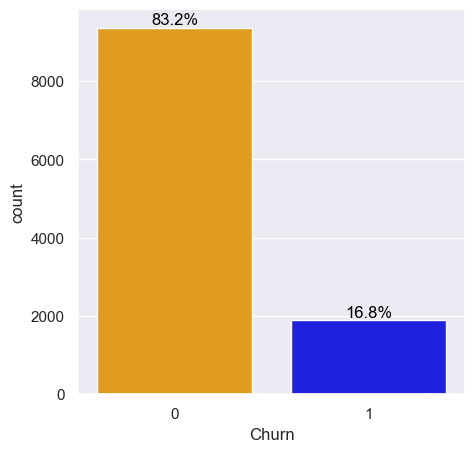

In [254]:
plt.figure(figsize=(5, 5))
ax = sns.countplot(x="Churn", data=df, palette=["orange", "blue"])  # specify custom colors
perc_on_bar(ax, df["Churn"])



2. Tenure

In [257]:
def histogram_boxplot(df, feature, figsize=(12, 7), kde=False, bins=None, hist_color='skyblue', box_color='orchid'):
    """
    Combined Boxplot and Histogram with custom colors
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,
        sharex=True,
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )

    # Boxplot
    sns.boxplot(
        data=df,
        x=feature,
        ax=ax_box2,
        showmeans=True,
        color=box_color
    )

    # Histogram with custom color
    sns.histplot(
        data=df,
        x=feature,
        kde=kde,
        ax=ax_hist2,
        bins=bins,
        color=hist_color
    )

    # Mean and median lines
    ax_hist2.axvline(df[feature].mean(), color="purple", linestyle="--", label="Mean")
    ax_hist2.axvline(df[feature].median(), color="black", linestyle="-", label="Median")
    ax_hist2.legend()

    plt.tight_layout()
    plt.show()


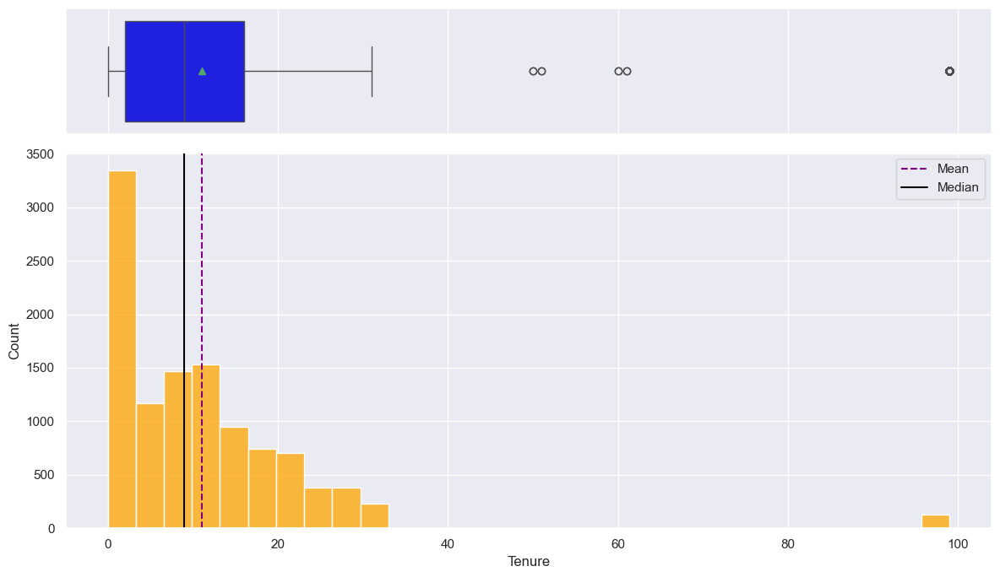

In [259]:
# Make sure the column is numeric
df["Tenure"] = pd.to_numeric(df["Tenure"], errors='coerce')

# Plot with custom colors
histogram_boxplot(df, "Tenure", bins=30, hist_color="orange", box_color="blue")


3. City Tier

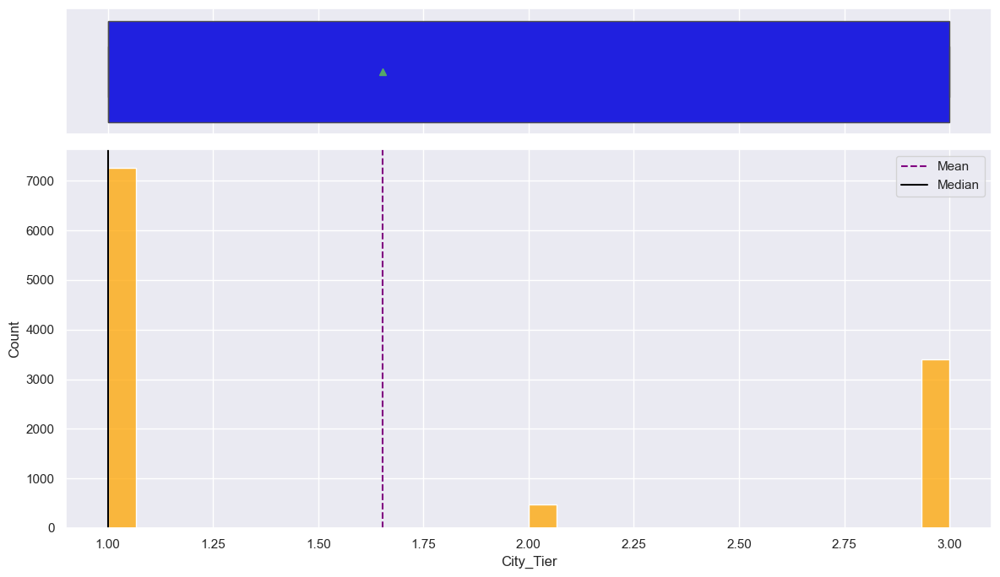

In [261]:
# Plot histogram and boxplot for City_Tier
histogram_boxplot(df, "City_Tier", bins=30, hist_color="orange", box_color="blue")


4. Customer Care contact in the past year

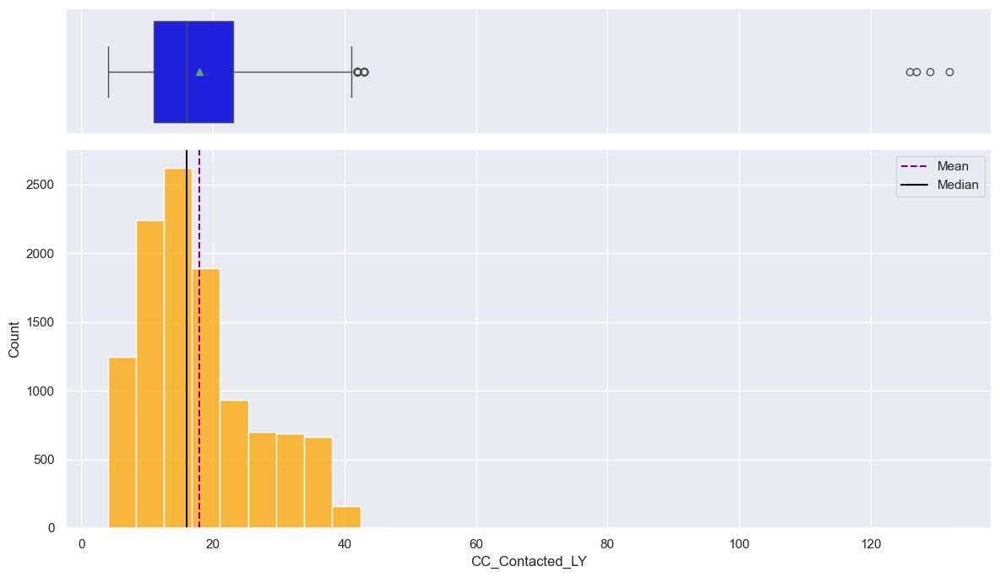

In [263]:
# Plot histogram and boxplot for Customer Care contact in the past year
histogram_boxplot(df, "CC_Contacted_LY", bins=30, hist_color="orange", box_color="blue")

5. Payment

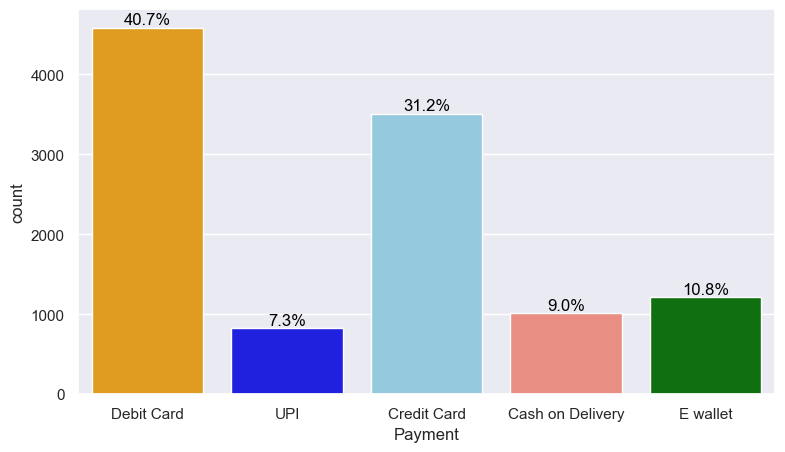

In [268]:
plt.figure(figsize=(9, 5))
ax = sns.countplot(x="Payment",data=df, palette=["orange", "blue","skyblue", "salmon", 'green'])
perc_on_bar(ax, df["Payment"])

5. Service Score

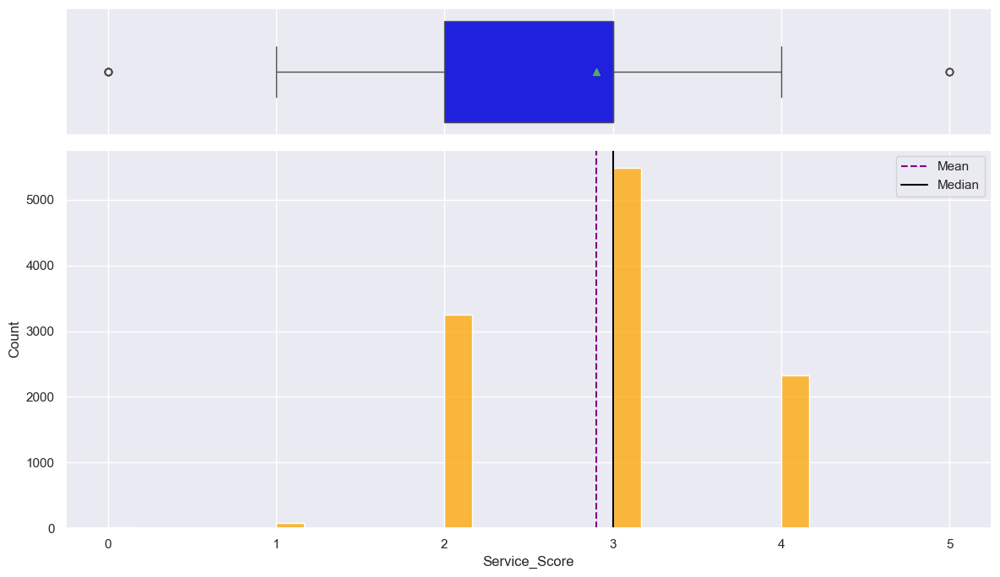

In [271]:
# Plot histogram and boxplot for Service score
histogram_boxplot(df, "Service_Score", bins=30, hist_color="orange", box_color="blue")

8. Account User Count

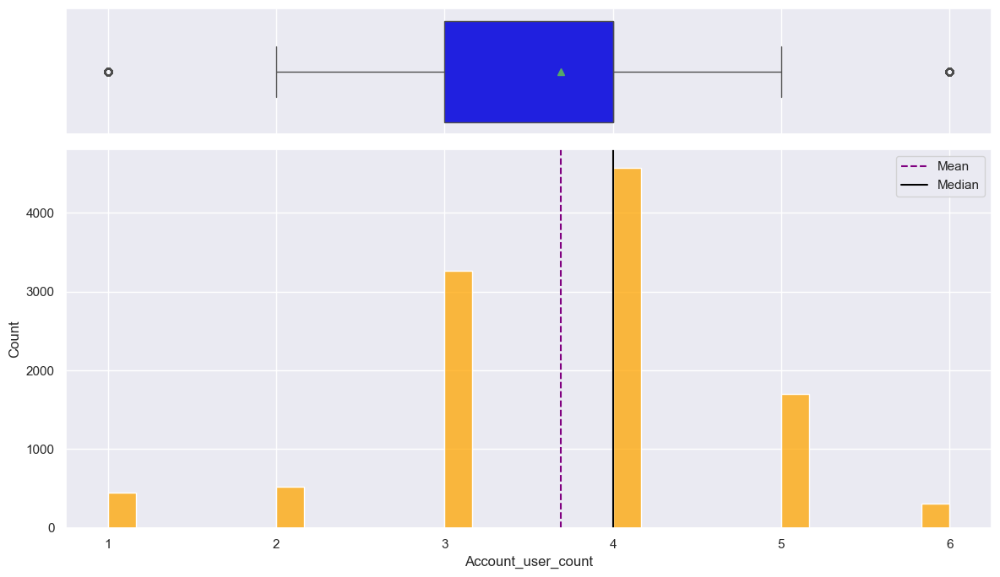

In [273]:
# Plot histogram and boxplot for Account user account
histogram_boxplot(df, "Account_user_count", bins=30, hist_color="orange", box_color="blue")

9. Account Segment

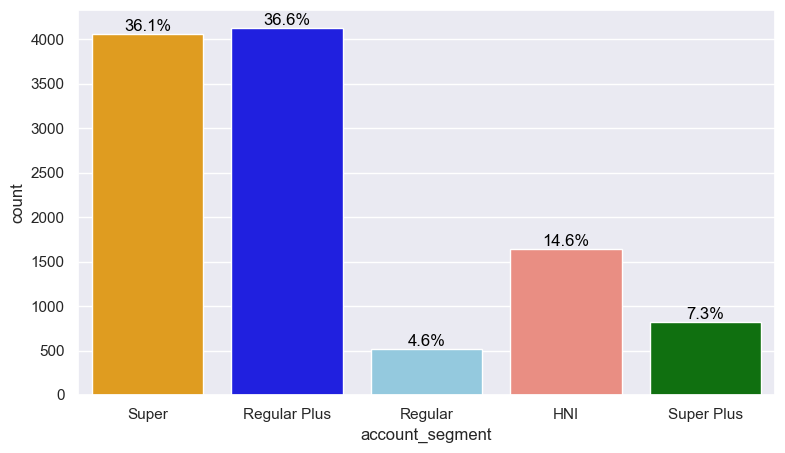

In [275]:
plt.figure(figsize=(9, 5))
ax = sns.countplot(x="account_segment",data=df, palette=["orange", "blue","skyblue", "salmon", 'green'])
perc_on_bar(ax, df["account_segment"])

10. Customer Care Agent Score

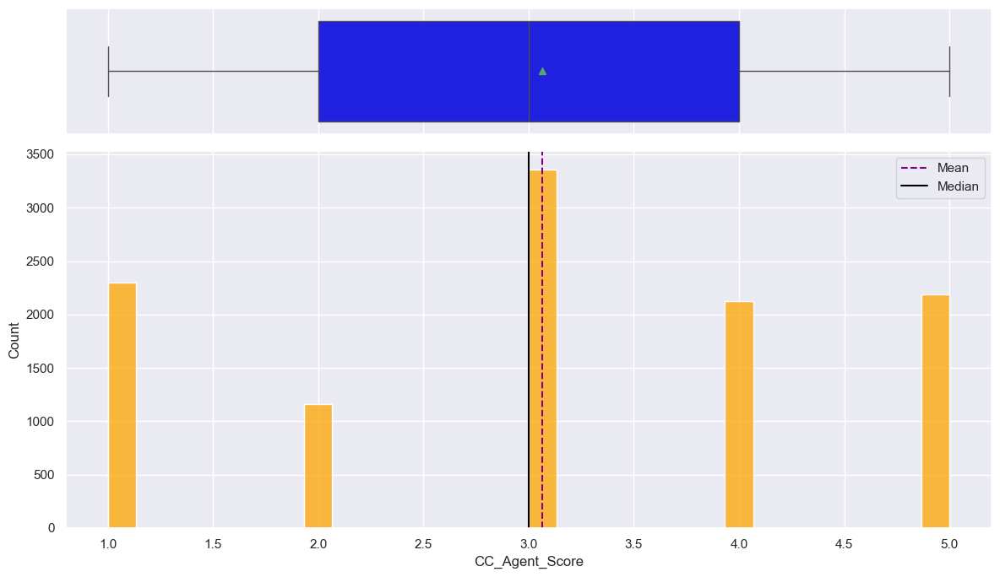

In [278]:
# Plot histogram and boxplot for Customer Care Agent Score
histogram_boxplot(df, "CC_Agent_Score", bins=30, hist_color="orange", box_color="blue")

11. Marital Status

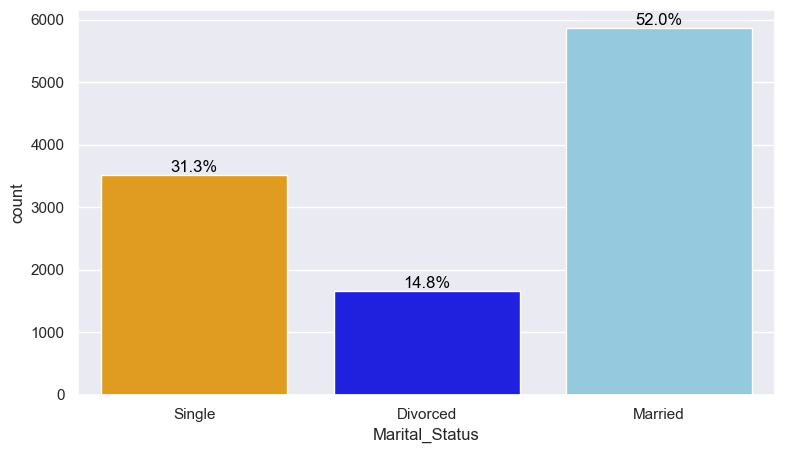

In [280]:
plt.figure(figsize=(9, 5))
ax = sns.countplot(x="Marital_Status",data=df, palette=["orange", "blue","skyblue", "salmon", 'green'])
perc_on_bar(ax, df["Marital_Status"])

12. Average Revenue per Month

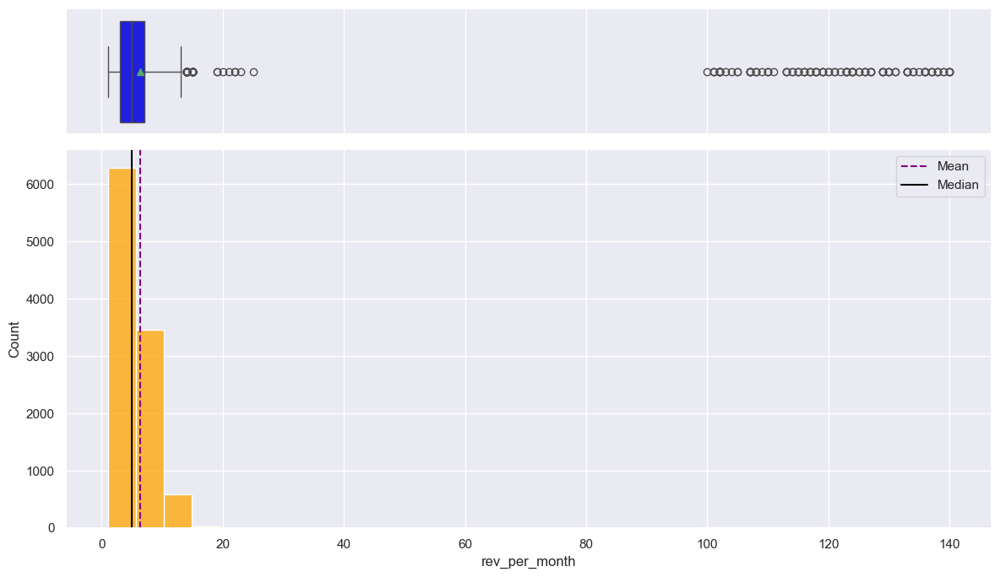

In [282]:
# Plot histogram and boxplot for Average Revenue per Month
histogram_boxplot(df, "rev_per_month", bins=30, hist_color="orange", box_color="blue")

13. Complaints raised in the past year

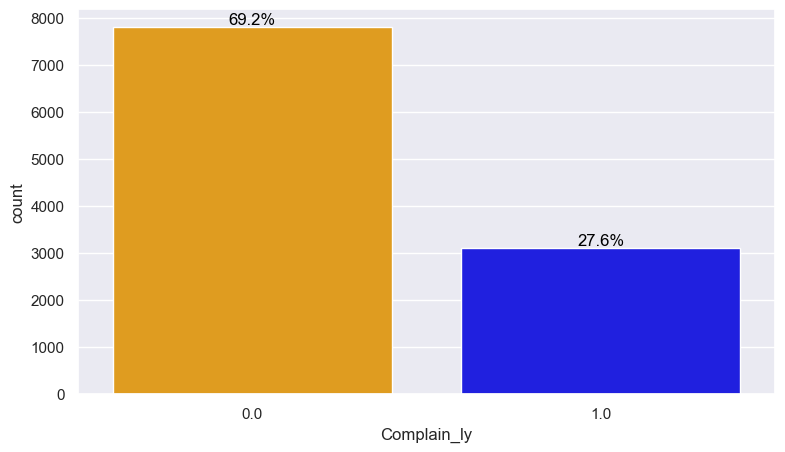

In [286]:
plt.figure(figsize=(9, 5))
ax = sns.countplot(x="Complain_ly",data=df, palette=["orange", "blue","skyblue", "salmon", 'green'])
perc_on_bar(ax, df["Complain_ly"])

14. Revenue Growth Percentage

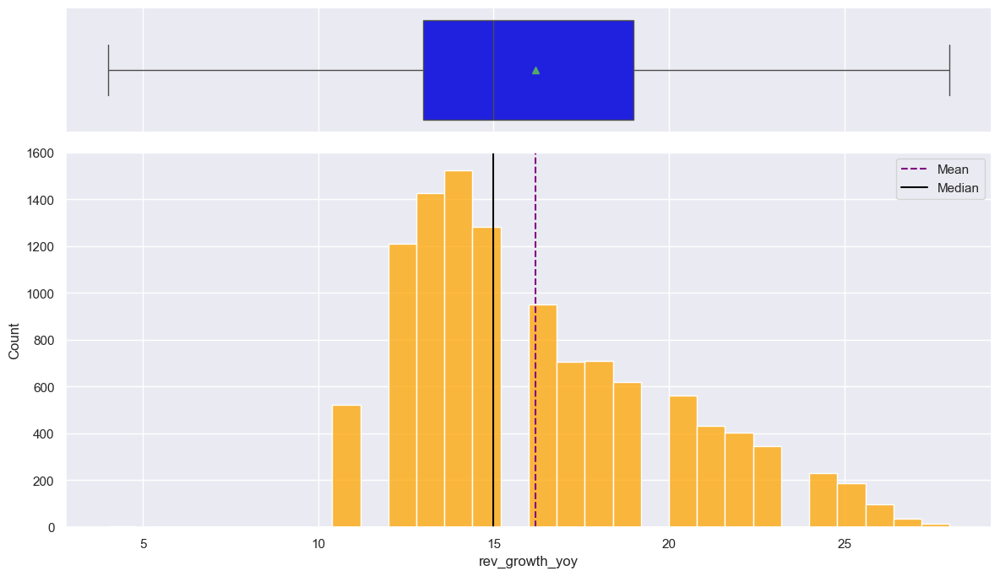

In [289]:
# Plot histogram and boxplot for Revenue Growth Percentage
histogram_boxplot(df, "rev_growth_yoy", bins=30, hist_color="orange", box_color="blue")

15. Coupon Used for Payment

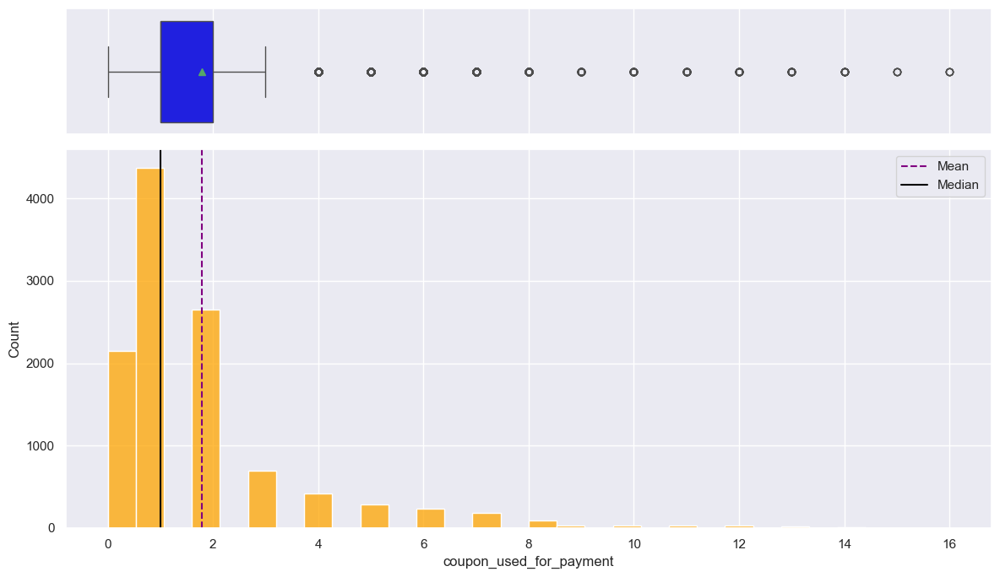

In [292]:
# Plot histogram and boxplot for Coupon used for payment
histogram_boxplot(df, "coupon_used_for_payment", bins=30, hist_color="orange", box_color="blue")

16. Days since Customer Care was contacted

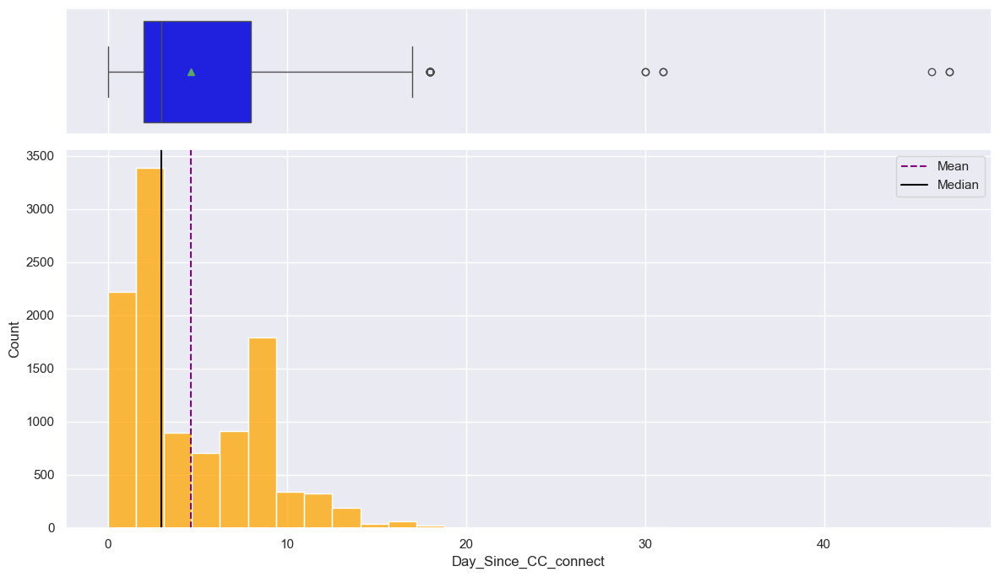

In [294]:
# Plot histogram and boxplot for Days since customer care was conatacted
histogram_boxplot(df, "Day_Since_CC_connect", bins=30, hist_color="orange", box_color="blue")

17. Cashback

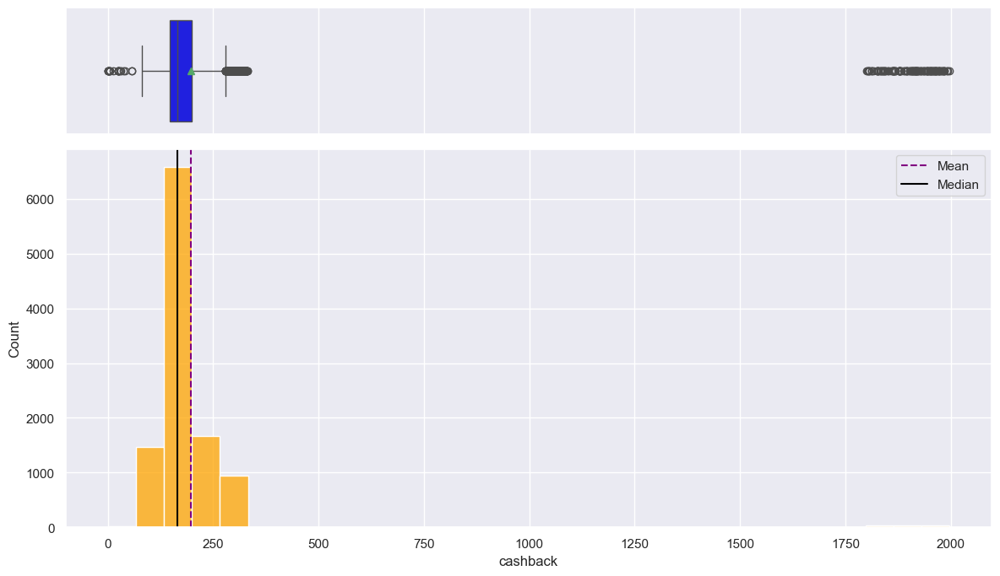

In [296]:
# Plot histogram and boxplot for Days since customer care was conatacted
histogram_boxplot(df, "cashback", bins=30, hist_color="orange", box_color="blue")

18. Login Device

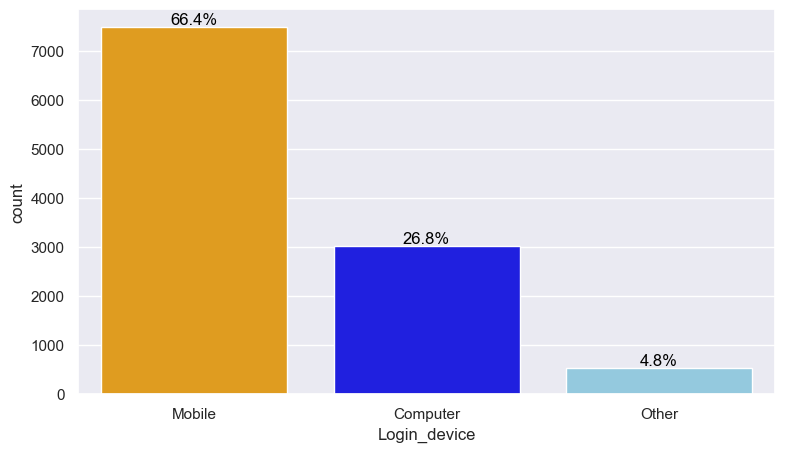

In [299]:
plt.figure(figsize=(9, 5))
ax = sns.countplot(x="Login_device",data=df, palette=["orange", "blue","skyblue", "salmon", 'green'])
perc_on_bar(ax, df["Login_device"])

### Bivariate Analysis

In [301]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart.

    Parameters:
    data : pandas DataFrame
        The input dataframe.
    predictor : str
        The independent (categorical) variable.
    target : str
        The dependent (categorical) variable.
    """

    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]

    # Print absolute counts
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)

    # Plot normalized (percentage) stacked bar chart
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    ax = tab.plot(kind="bar", stacked=True, figsize=(count + 3, 5))

    plt.legend(title=target, loc="upper left", bbox_to_anchor=(1, 1), frameon=False)
    plt.xticks(rotation=0)
    plt.xlabel(predictor)
    plt.ylabel("Proportion")
    plt.title(f"Stacked Bar Plot of {predictor} vs {target}")
    plt.tight_layout()
    plt.show()


In [302]:
corr_matrix = df.select_dtypes(include=["number"]).corr()


In [303]:
# Drop 'AccountID' if it exists and calculate correlation
corr_matrix = df.drop(columns=["AccountID"], errors="ignore")


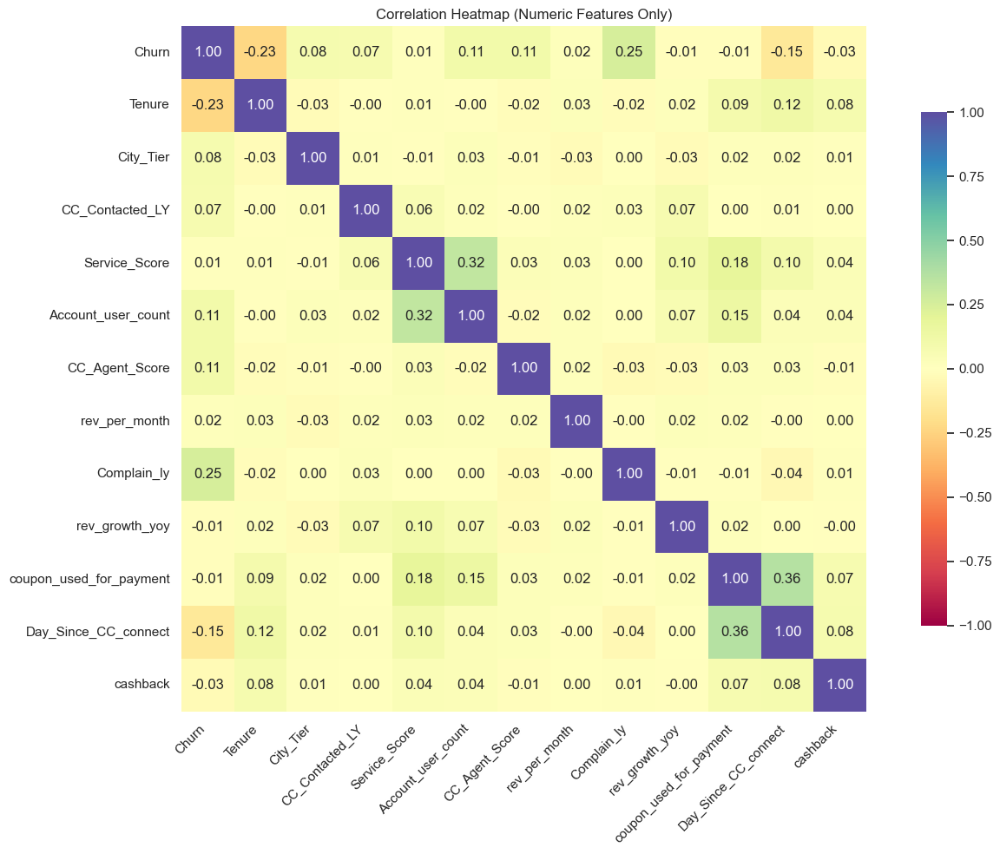

In [305]:
# Compute correlation on numeric columns only
corr_matrix1 = corr_matrix.select_dtypes(include=["number"]).corr()



# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_matrix1,
    annot=True,
    vmin=-1,
    vmax=1,
    fmt=".2f",
    cmap="Spectral",
    square=True,
    cbar_kws={"shrink": 0.75}
)
plt.title("Correlation Heatmap (Numeric Features Only)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

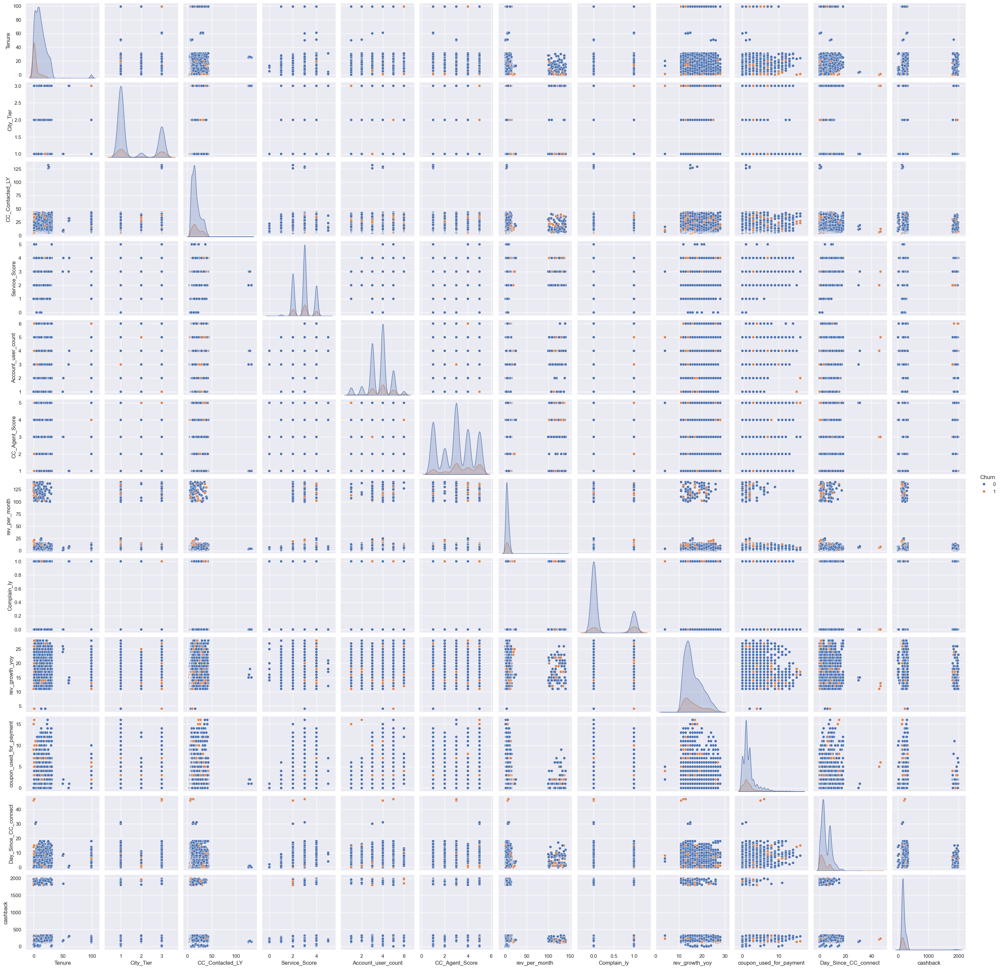

In [306]:
sns.pairplot(df, hue="Churn")
plt.show()



Target vs Tenure

In [308]:
max_tenure = df["Tenure"].max()
bins = np.arange(0, max_tenure + 3, 3)
labels = [f"{i}-{i+2}" for i in bins[:-1]]

df["TenureGroup"] = pd.cut(df["Tenure"], bins=bins, labels=labels, right=True)

Churn           0     1   All
TenureGroup                  
All          8632  1179  9811
0.0-2.0      1370   745  2115
3.0-5.0      1081    88  1169
6.0-8.0      1383    82  1465
18.0-20.0     586    74   660
12.0-14.0     945    70  1015
9.0-11.0     1111    60  1171
15.0-17.0     723    36   759
96.0-98.0     107    24   131
21.0-23.0     467     0   467
24.0-26.0     367     0   367
27.0-29.0     388     0   388
30.0-32.0      96     0    96
48.0-50.0       4     0     4
57.0-59.0       2     0     2
60.0-62.0       2     0     2


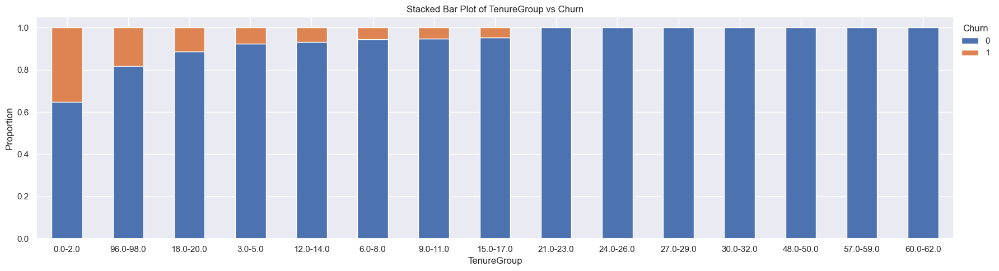

In [309]:
stacked_barplot(df, "TenureGroup", "Churn")


2. Target vs City_Tier

Churn         0     1    All
City_Tier                   
 All       9269  1879  11148
1.000      6207  1056   7263
3.000      2678   727   3405
2.000       384    96    480


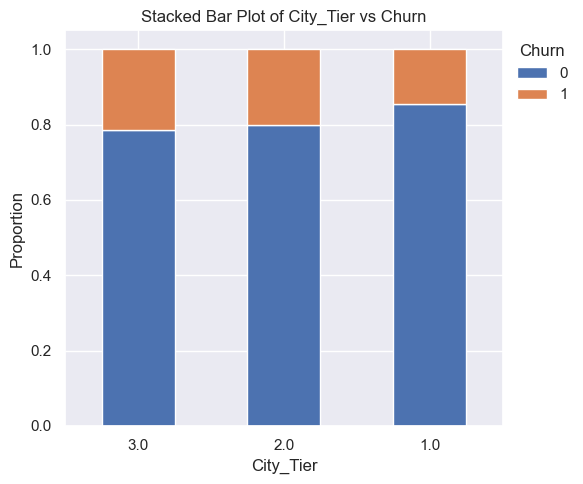

In [312]:
stacked_barplot(df, "City_Tier", "Churn")

3. Target vs Customer Care Contacted (Past year)

Churn               0     1    All
CC_Contacted_LY                   
 All             9280  1878  11158
16.000            554   109    663
14.000            580   102    682
15.000            528    95    623
13.000            561    94    655
9.000             567    88    655
12.000            483    88    571
17.000            442    83    525
10.000            415    74    489
11.000            452    72    524
8.000             469    69    538
18.000            306    68    374
19.000            299    65    364
21.000            251    59    310
22.000            227    55    282
20.000            265    54    319
7.000             338    53    391
31.000            113    52    165
30.000            128    47    175
23.000            197    44    241
29.000            138    43    181
24.000            172    42    214
6.000             270    41    311
32.000            152    40    192
34.000            139    39    178
28.000            142    36    178
25.000            16

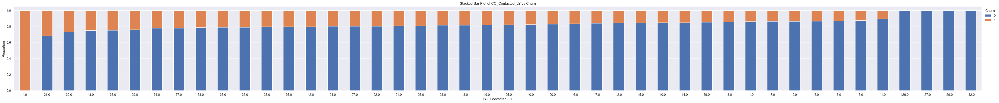

In [314]:
stacked_barplot(df, "CC_Contacted_LY", "Churn")

4. Target vs Payment

Churn                0     1    All
Payment                            
All               9277  1874  11151
Debit Card        3885   702   4587
Credit Card       3012   499   3511
E wallet           941   276   1217
Cash on Delivery   760   254   1014
UPI                679   143    822


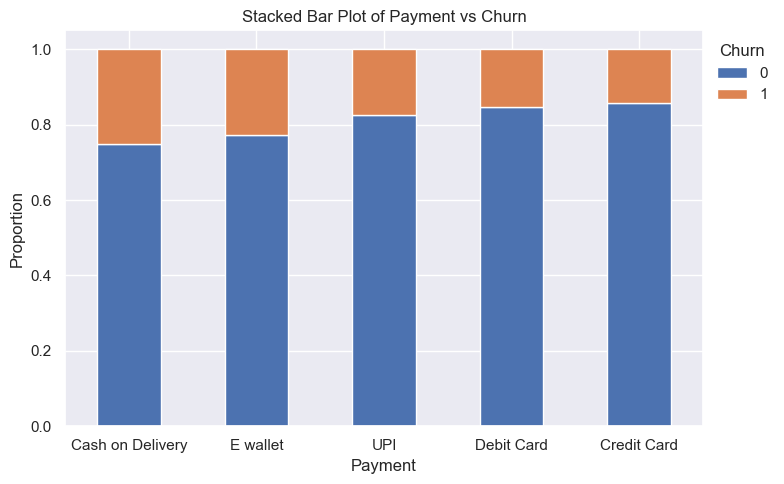

In [316]:
stacked_barplot(df, "Payment", "Churn")

5. Target vs Gender

Churn      0     1    All
Gender                   
All     9278  1874  11152
Male    5519  1185   6704
Female  3759   689   4448


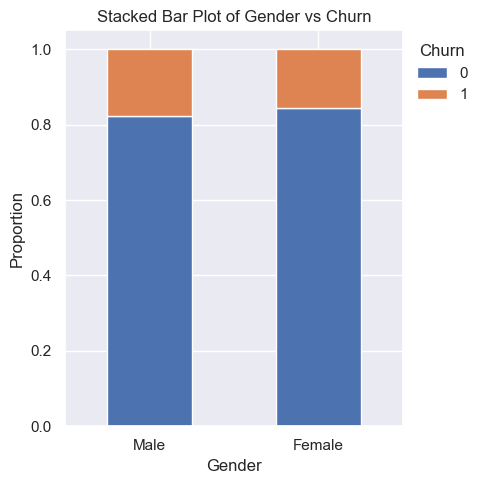

In [387]:
stacked_barplot(df, "Gender", "Churn")

In [102]:
df.isnull().sum()


Churn                      0
Tenure                     0
City_Tier                  0
CC_Contacted_LY            0
Payment                    0
Gender                     0
Service_Score              0
Account_user_count         0
account_segment            0
CC_Agent_Score             0
Marital_Status             0
rev_per_month              0
Complain_ly                0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Login_device               0
dtype: int64

6. Target vs Service Score

Churn             0     1    All
Service_Score                   
 All           9282  1880  11162
3.000          4554   936   5490
2.000          2701   550   3251
4.000          1937   394   2331
0.000             8     0      8
1.000            77     0     77
5.000             5     0      5


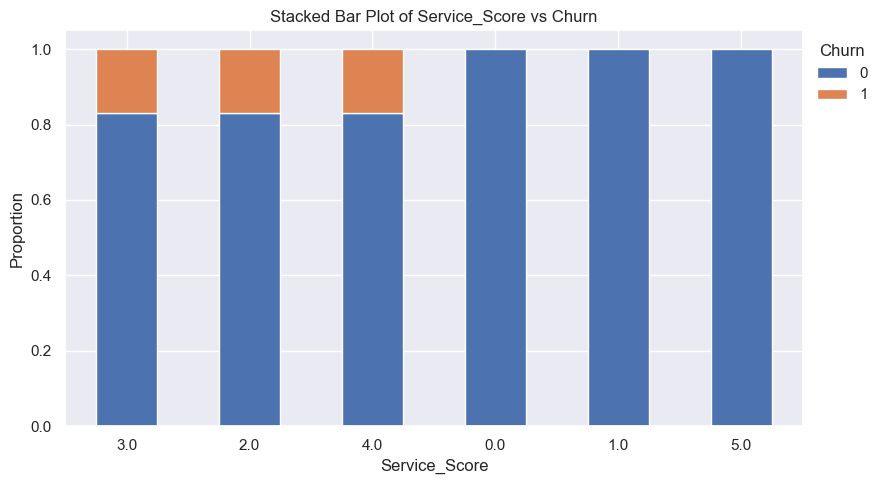

In [389]:
stacked_barplot(df, "Service_Score", "Churn")

7. Target vs Account user count

Churn               0.000  1.000    All
Account_user_count                     
All                  9364   1896  11260
4                    4018    790   4808
3                    2910    514   3424
5                    1336    390   1726
6                     206    109    315
2                     492     49    541
1                     402     44    446


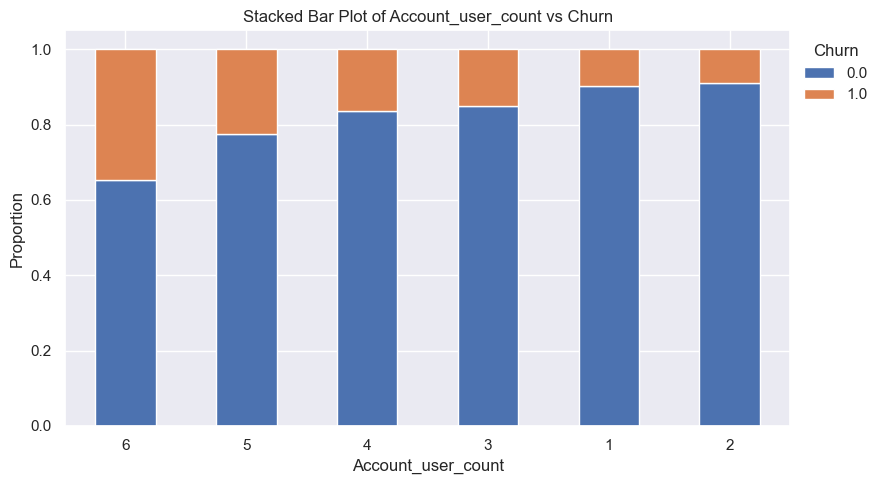

In [1278]:
stacked_barplot(df, "Account_user_count", "Churn")

8. Target vs Account segment

Churn               0     1    All
account_segment                   
All              9285  1878  11163
Regular Plus     2997  1127   4124
Super            3646   416   4062
HNI              1384   255   1639
Regular           480    40    520
Super Plus        778    40    818


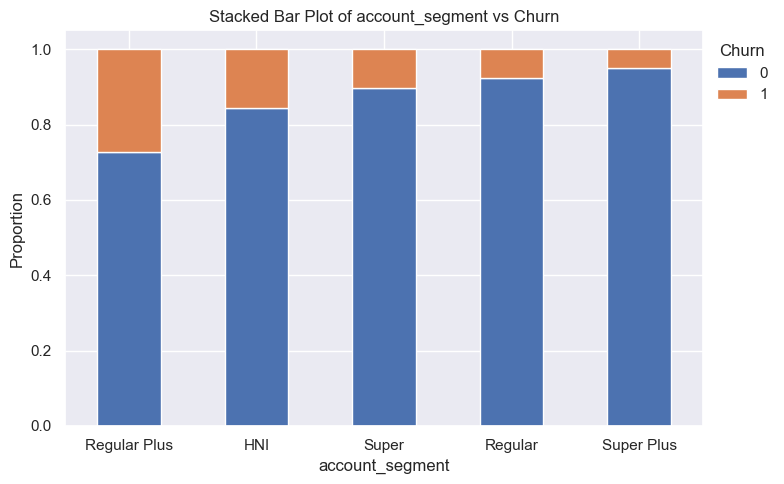

In [392]:
stacked_barplot(df, "account_segment", "Churn")

9 Target vs Customer Care Agent Score

Churn              0     1    All
CC_Agent_Score                   
 All            9270  1874  11144
3.000           2783   577   3360
5.000           1669   522   2191
4.000           1763   364   2127
1.000           2038   264   2302
2.000           1017   147   1164


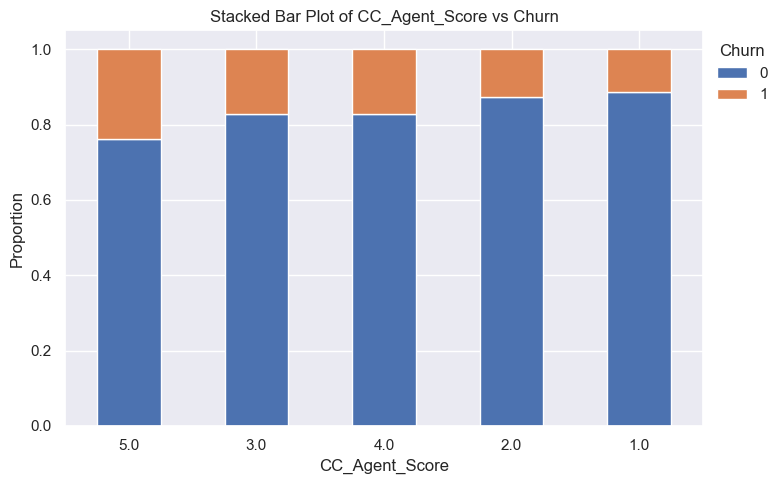

In [394]:
stacked_barplot(df, "CC_Agent_Score", "Churn")

10. Target vs Marital Status

Churn              0     1    All
Marital_Status                   
All             9184  1864  11048
Single          2573   947   3520
Married         5187   673   5860
Divorced        1424   244   1668


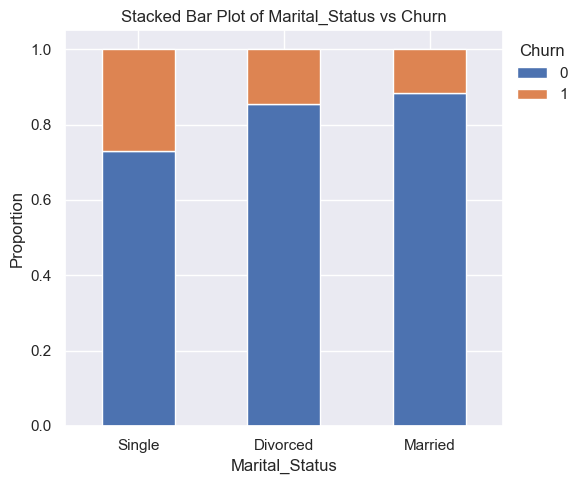

In [396]:
stacked_barplot(df, "Marital_Status", "Churn")

11. Target vs Average Revenue per Month

Churn             0     1    All
rev_per_month                   
 All           8694  1775  10469
3.000          1447   299   1746
2.000          1315   270   1585
5.000          1139   198   1337
6.000           899   186   1085
4.000          1048   170   1218
7.000           602   152    754
8.000           523   120    643
9.000           465    99    564
10.000          341    72    413
11.000          215    63    278
1.000           354    48    402
12.000          129    37    166
13.000           76    17     93
15.000           15     9     24
14.000           40     8     48
118.000           1     3      4
102.000           5     3      8
19.000            0     2      2
136.000           2     2      4
134.000           0     2      2
129.000           2     2      4
124.000           3     2      5
138.000           2     1      3
127.000           2     1      3
110.000           2     1      3
117.000           2     1      3
114.000           1     1      2
113.000   

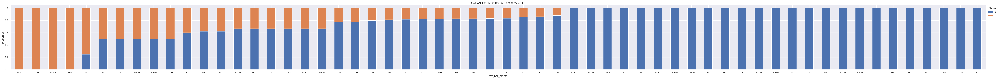

In [398]:
stacked_barplot(df, "rev_per_month", "Churn")

12. Target vs Complain_ly

Churn           0     1    All
Complain_ly                   
 All         9065  1838  10903
1.000        2123   988   3111
0.000        6942   850   7792


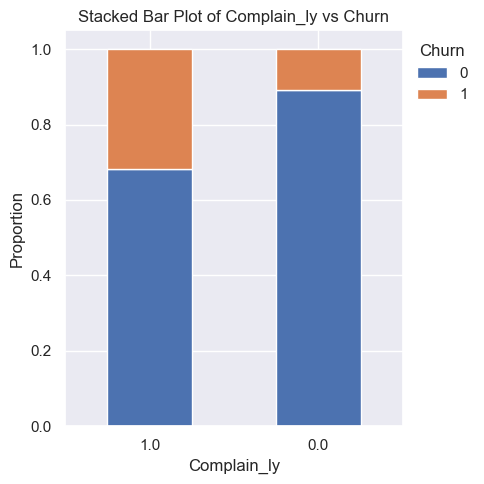

In [400]:
stacked_barplot(df, "Complain_ly", "Churn")

13. Target vs rev_growth_yoy

Churn              0     1    All
rev_growth_yoy                   
 All            9361  1896  11257
13.000          1157   270   1427
14.000          1283   241   1524
12.000           985   225   1210
15.000          1105   178   1283
16.000           782   167    949
17.000           574   130    704
18.000           593   115    708
11.000           418   105    523
19.000           533    86    619
20.000           486    76    562
23.000           275    70    345
22.000           337    66    403
21.000           378    55    433
24.000           177    52    229
25.000           145    43    188
26.000            89     9     98
27.000            29     6     35
28.000            13     1     14
4.000              2     1      3


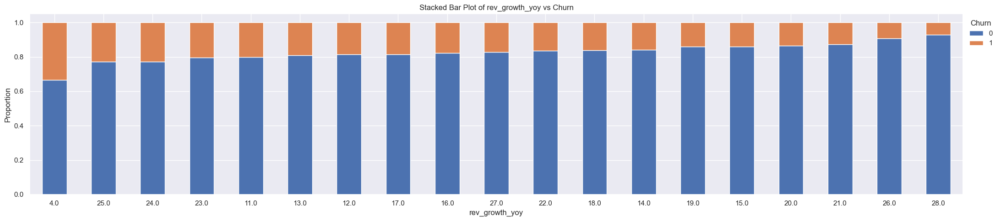

In [402]:
stacked_barplot(df, "rev_growth_yoy", "Churn")

14. Target vs coupon_used_for_payment

Churn                       0     1    All
coupon_used_for_payment                   
 All                     9361  1896  11257
1.000                    3613   760   4373
2.000                    2210   446   2656
0.000                    1776   374   2150
3.000                     602    96    698
4.000                     362    62    424
5.000                     238    46    284
6.000                     198    36    234
7.000                     148    36    184
8.000                      68    20     88
10.000                     28     6     34
11.000                     26     4     30
9.000                      30     4     34
12.000                     24     2     26
15.000                      2     2      4
16.000                      2     2      4
13.000                     22     0     22
14.000                     12     0     12


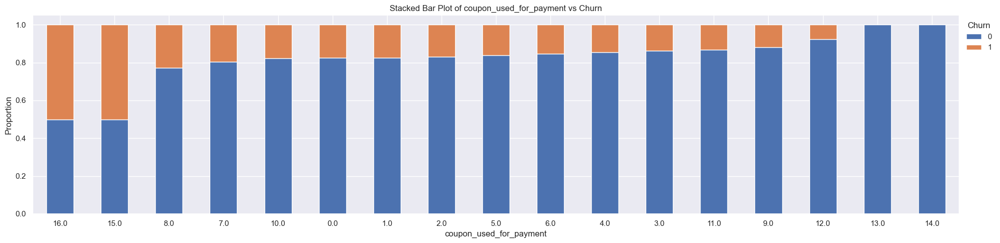

In [404]:
stacked_barplot(df, "coupon_used_for_payment", "Churn")

15. Target vs Day_Since_CC_connect

Churn                    0     1    All
Day_Since_CC_connect                   
 All                  9070  1832  10902
1.000                  880   376   1256
0.000                  638   326    964
3.000                 1551   265   1816
2.000                 1339   235   1574
8.000                 1012   157   1169
7.000                  776   135    911
4.000                  777   116    893
9.000                  558    64    622
5.000                  424    55    479
10.000                 305    34    339
6.000                  197    32    229
11.000                 167    16    183
14.000                  66     8     74
15.000                  30     7     37
12.000                 143     3    146
47.000                   0     2      2
46.000                   0     1      1
16.000                  26     0     26
17.000                  34     0     34
18.000                  26     0     26
30.000                   2     0      2
31.000                   2     0      2


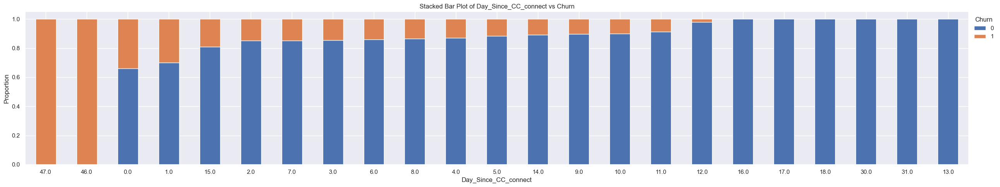

In [406]:
stacked_barplot(df, "Day_Since_CC_connect", "Churn")

16. Target vs cashback

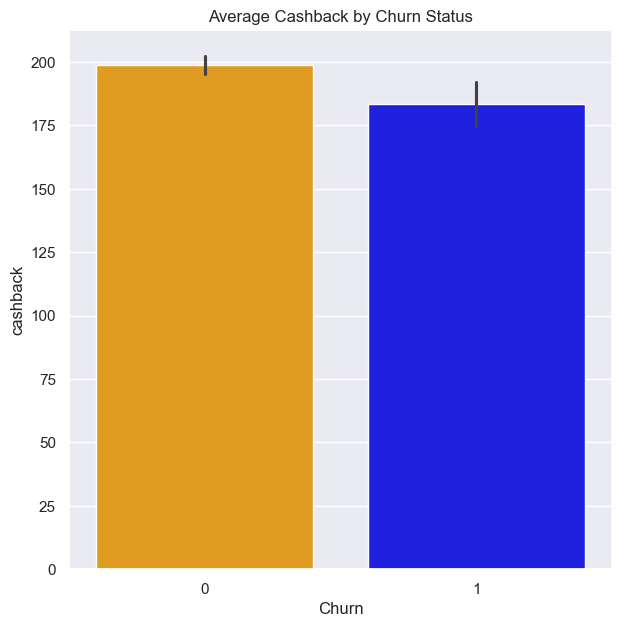

In [408]:
plt.figure(figsize=(7, 7))
sns.barplot(y="cashback", x="Churn", data=df, palette=["orange", "blue"])
plt.title("Average Cashback by Churn Status")
plt.show()



17. Target vs Login Device

Churn            0     1    All
Login_device                   
All           9185  1854  11039
Mobile        6310  1172   7482
Computer      2421   597   3018
Other          454    85    539


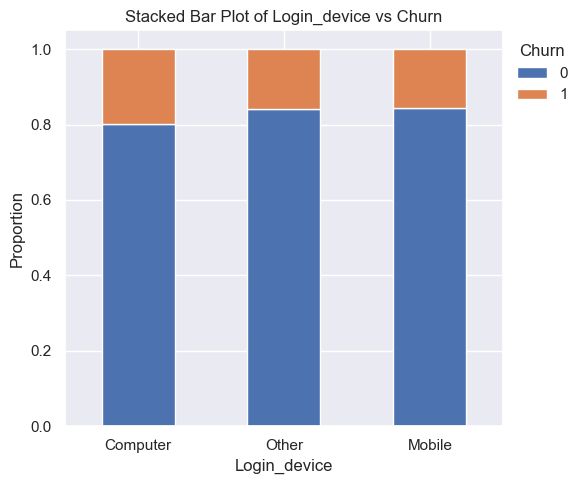

In [410]:
stacked_barplot(df, "Login_device", "Churn")

## Customer who had churned

In [412]:
df[df["Churn"] == 1].describe().T

,count,mean,std,min,25%,50%,75%,max
Churn,1896.000,1.000,0.000,1.000,1.000,1.000,1.000,1.000
Tenure,1848.000,4.327,12.072,0.000,0.000,1.000,3.000,99.000
City_Tier,1879.000,1.825,0.959,1.000,1.000,1.000,3.000,3.000
CC_Contacted_LY,1878.000,19.285,8.906,4.000,12.000,17.000,26.000,43.000
Service_Score,1880.000,2.917,0.704,2.000,2.000,3.000,3.000,4.000
Account_user_count,1830.000,3.936,1.016,1.000,3.000,4.000,5.000,6.000
CC_Agent_Score,1874.000,3.391,1.341,1.000,3.000,3.000,5.000,5.000
rev_per_month,1775.000,6.957,13.370,1.000,3.000,5.000,8.000,138.000
Complain_ly,1838.000,0.538,0.499,0.000,0.000,1.000,1.000,1.000
rev_growth_yoy,1896.000,16.078,3.863,4.000,13.000,15.000,18.000,28.000


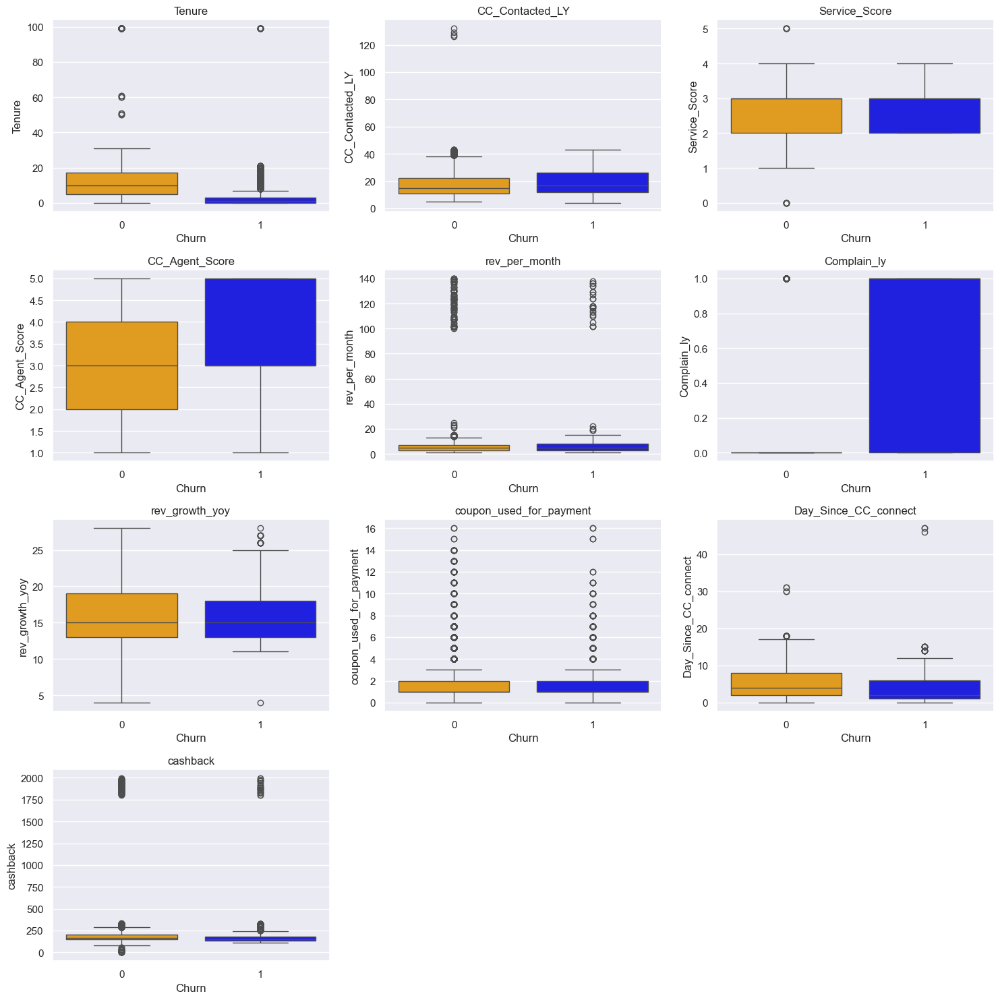

In [416]:
import matplotlib.pyplot as plt
import seaborn as sns

cont_col = df[
    [
        "Tenure",
        "CC_Contacted_LY",
        "Service_Score",
        "CC_Agent_Score",
        "rev_per_month",
        "Complain_ly",
        "rev_growth_yoy",
        "coupon_used_for_payment",
        "Day_Since_CC_connect",
        "cashback",
    ]
]

plt.figure(figsize=(15, 15))
for i, variable in enumerate(cont_col.columns):
    plt.subplot(4, 3, i + 1)
    sns.boxplot(x=df["Churn"], y=df[variable], palette=["orange", "blue"])
    plt.title(variable)

plt.tight_layout()
plt.show()


### Distribution of Target w.r.t Independent variables

In [420]:
def distribution_plot_wrt_target(data, predictor, target):
    # Get sorted unique target values to ensure consistency
    target_uniq = sorted(data[target].dropna().unique())

    # Check if target has at least two classes
    if len(target_uniq) < 2:
        print("Target must have at least two unique values.")
        return

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    # Histogram for each target class
    axs[0, 0].set_title(f"Distribution of {predictor} for target = {target_uniq[1]}")
    sns.histplot(
        data=data[data[target] == target_uniq[1]], x=predictor, kde=True, ax=axs[0, 0]
    )

    axs[0, 1].set_title(f"Distribution of {predictor} for target = {target_uniq[0]}")
    sns.histplot(
        data=data[data[target] == target_uniq[0]], x=predictor, kde=True, ax=axs[0, 1]
    )

    # Boxplots
    axs[1, 0].set_title("Boxplot (with outliers) w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0])

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 1], showfliers=False)

    plt.tight_layout()
    plt.show()

1. Churn vs Tenure

In [423]:
import matplotlib.pyplot as plt
import seaborn as sns

def distribution_plot_wrt_target(data, predictor, target):
    target_vals = sorted(data[target].dropna().unique())
    palette = ["blue", "orange"]

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    for i in range(2):
        sns.histplot(
            data=data[data[target] == target_vals[i]],
            x=predictor, kde=True, ax=axs[0, i],
            color=palette[i]
        )
        axs[0, i].set_title(f"{predictor} distribution | {target} = {target_vals[i]}")

    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette=palette)
    axs[1, 0].set_title("Boxplot with outliers")

    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 1], showfliers=False, palette=palette)
    axs[1, 1].set_title("Boxplot without outliers")

    plt.tight_layout()
    plt.show()


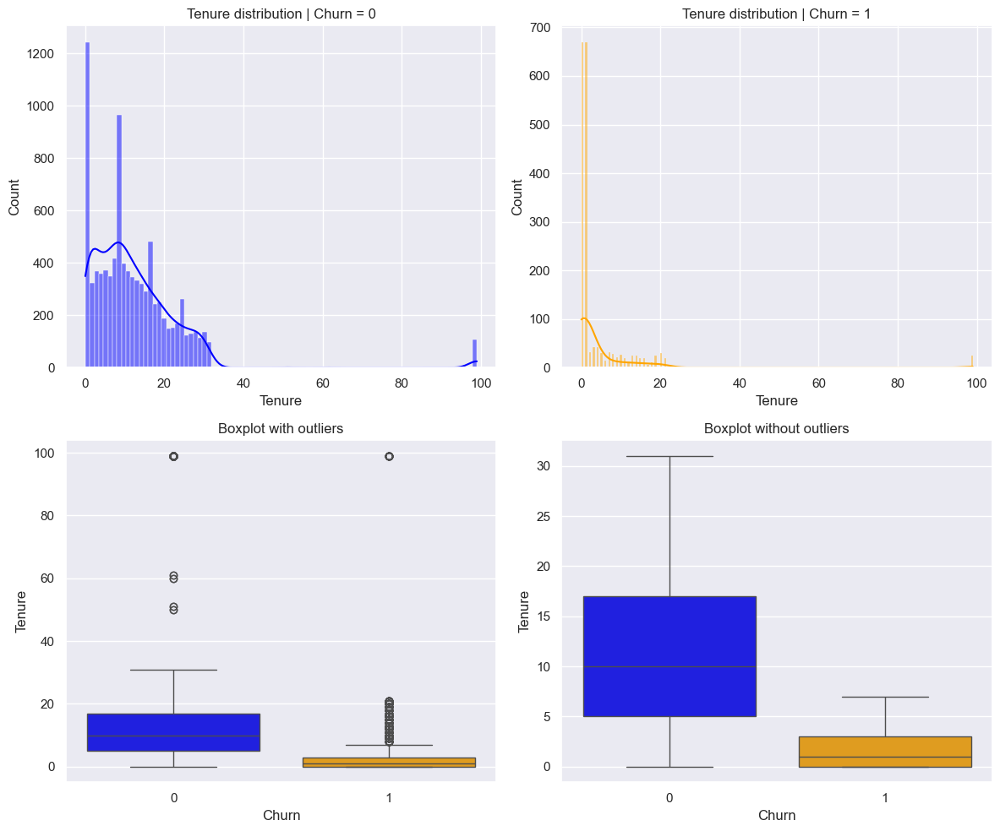

In [425]:
distribution_plot_wrt_target(df, "Tenure", "Churn")

2. Churn vs City_Tier

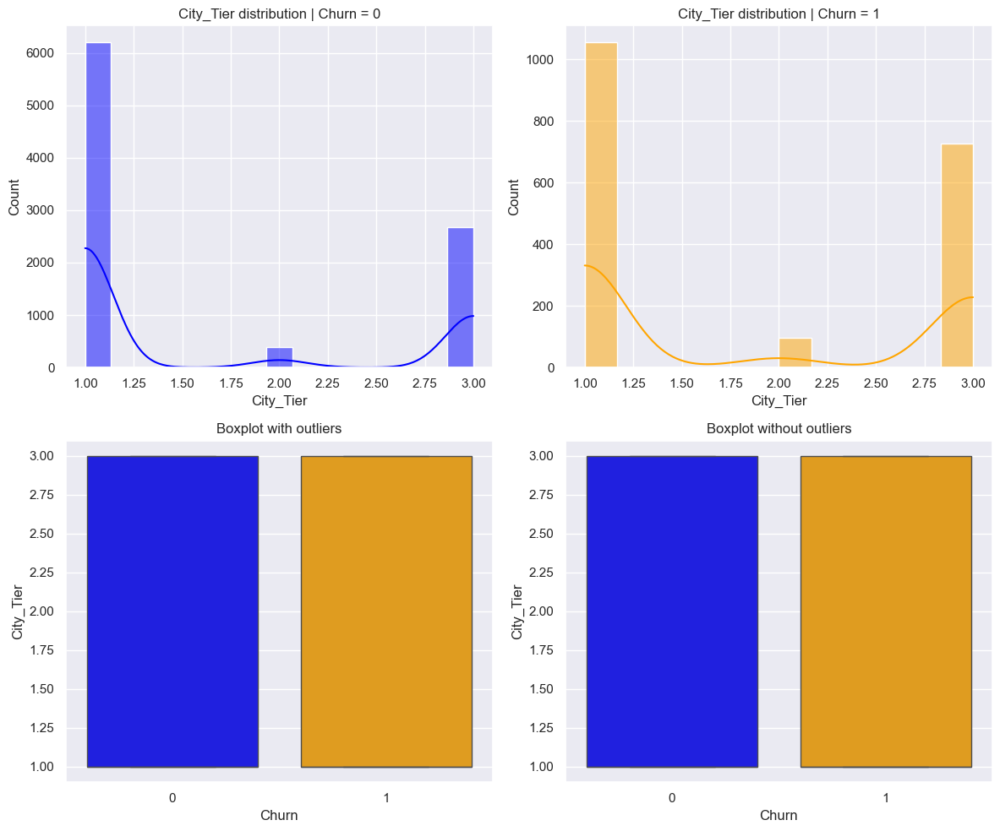

In [427]:
distribution_plot_wrt_target(df, "City_Tier", "Churn")

3. Churn vs CC_Contacted_LY

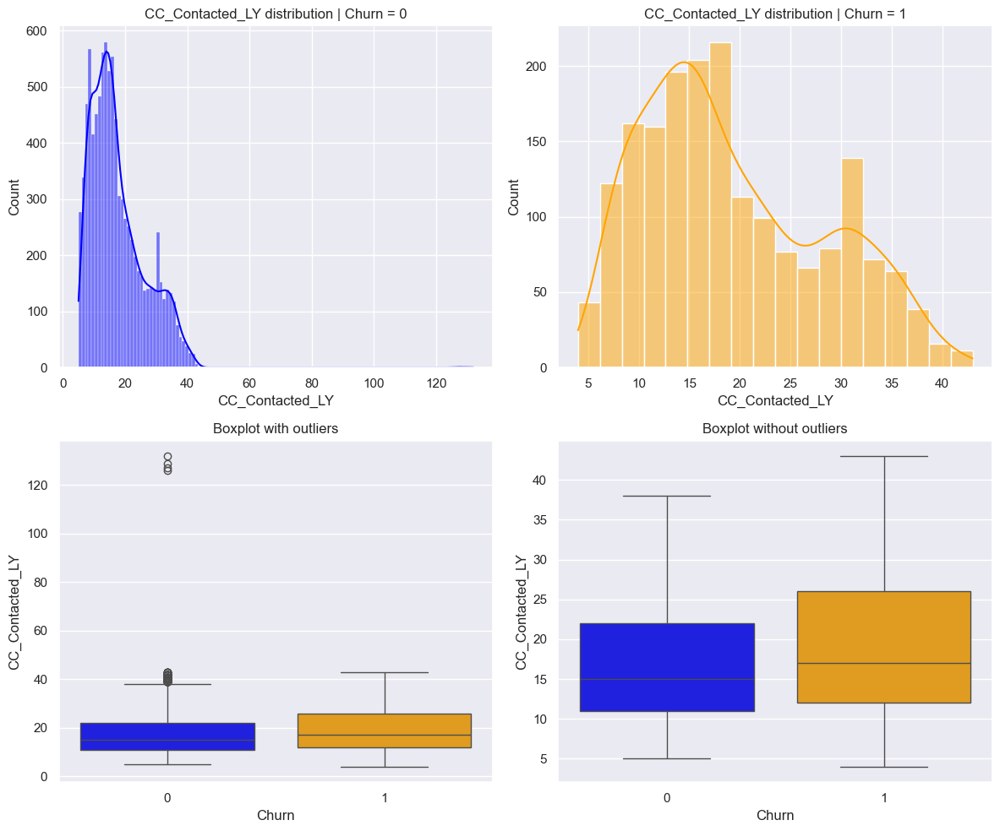

In [429]:
distribution_plot_wrt_target(df, "CC_Contacted_LY", "Churn")

4. Churn vs Service_Score

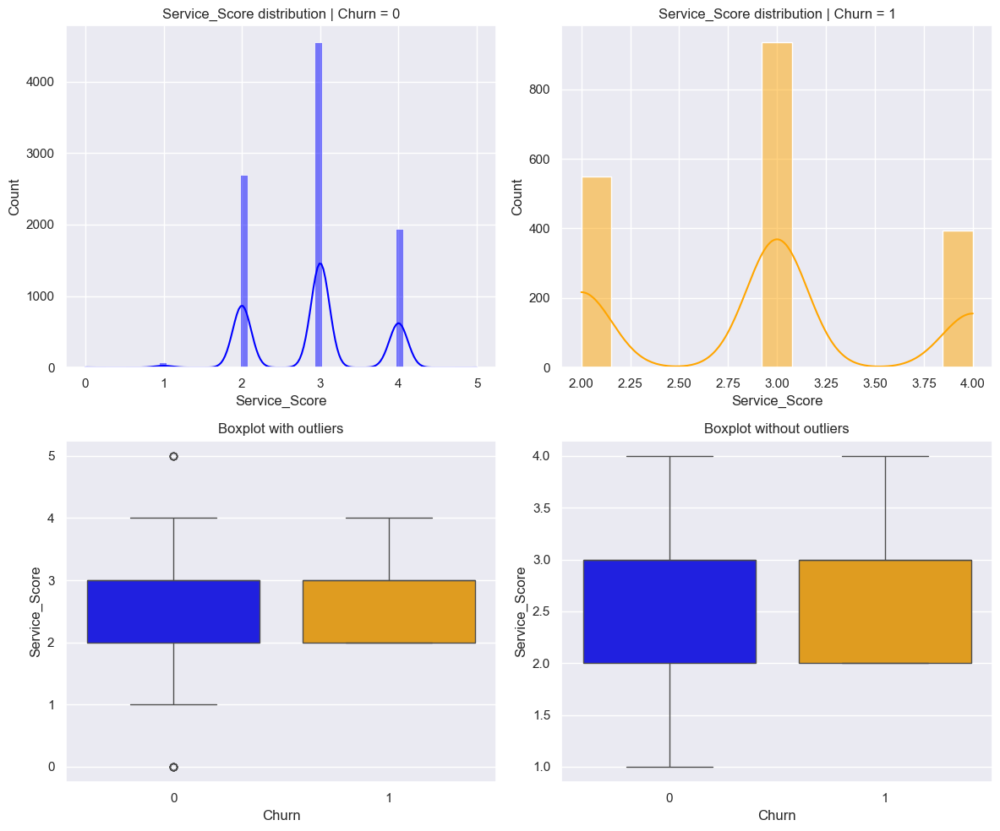

In [431]:
distribution_plot_wrt_target(df, "Service_Score", "Churn")

5. Churn vs Account_user_count

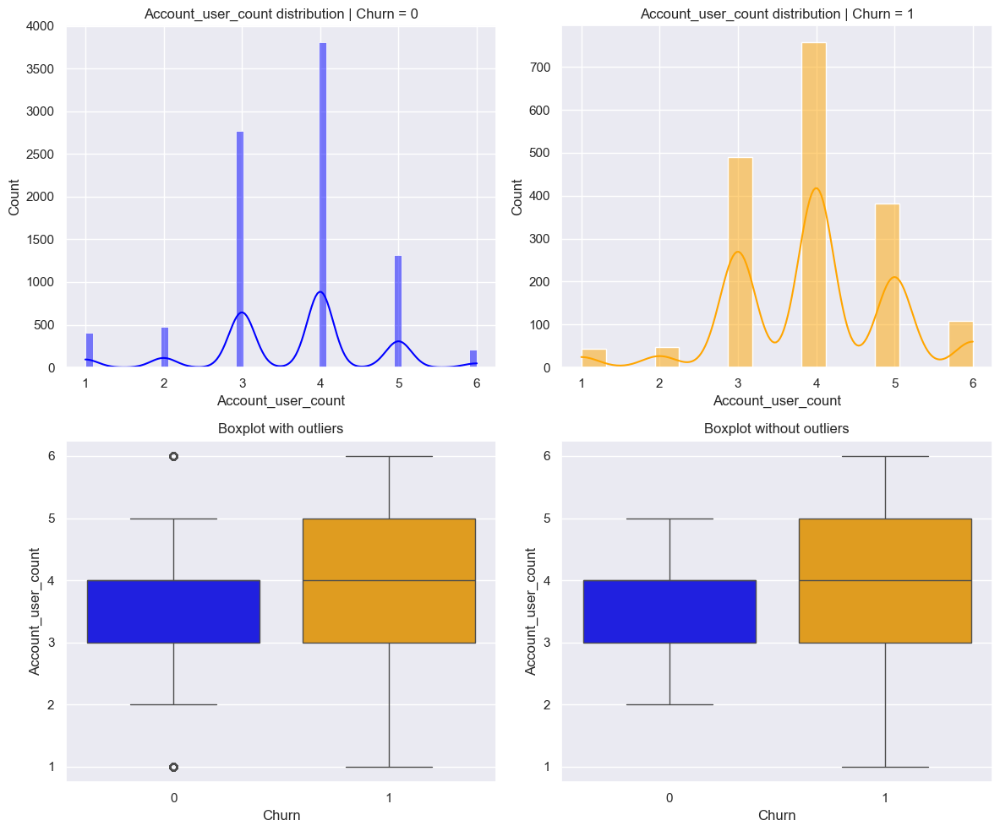

In [433]:
distribution_plot_wrt_target(df, "Account_user_count", "Churn")

6. Churn vs CC_Agent_Score

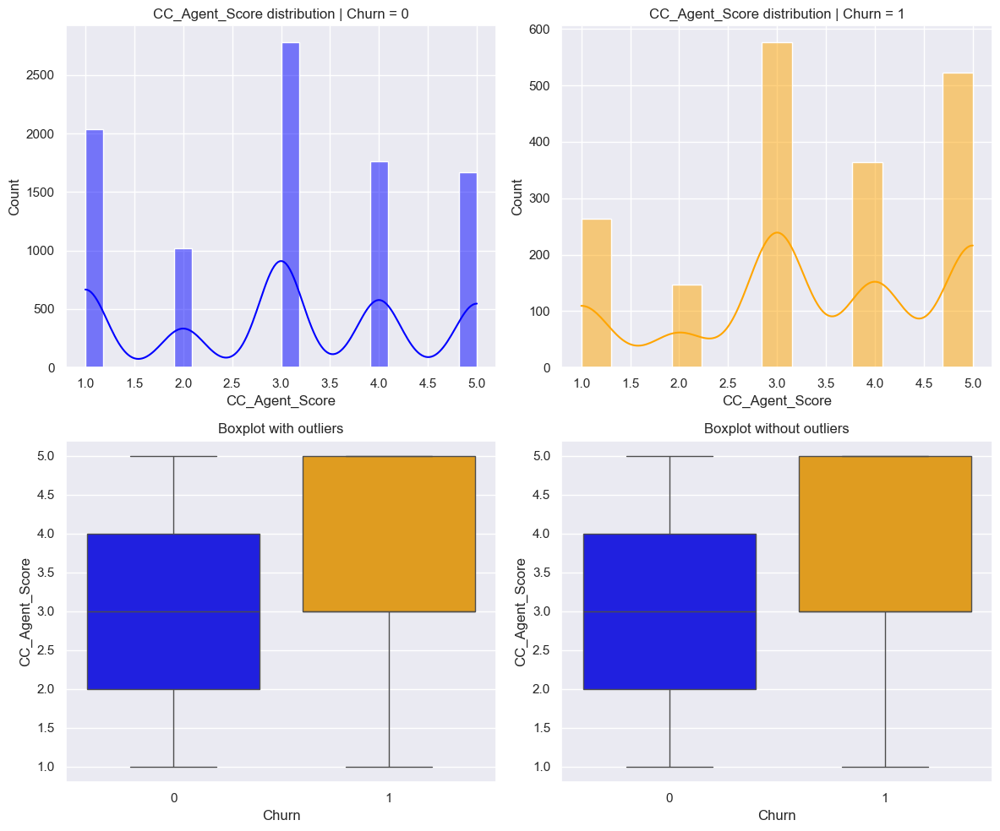

In [435]:
distribution_plot_wrt_target(df, "CC_Agent_Score", "Churn")

7. Churn vs rev_per_month

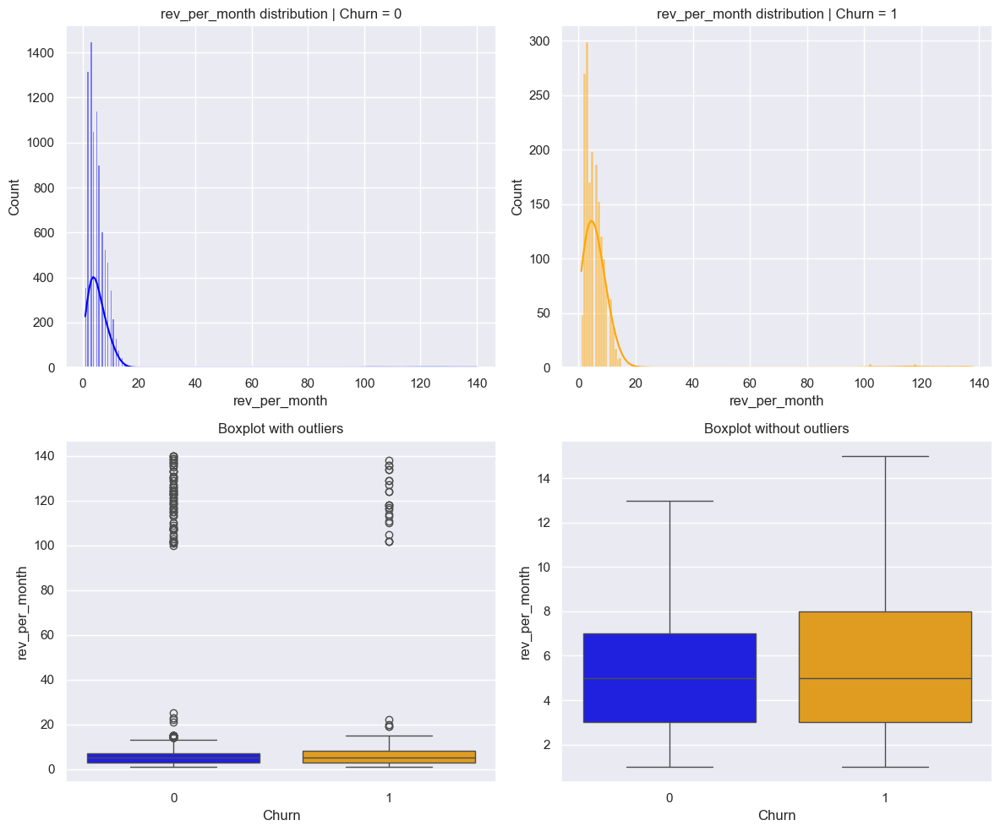

In [437]:
distribution_plot_wrt_target(df, "rev_per_month", "Churn")

8. Churn vs Complain_ly

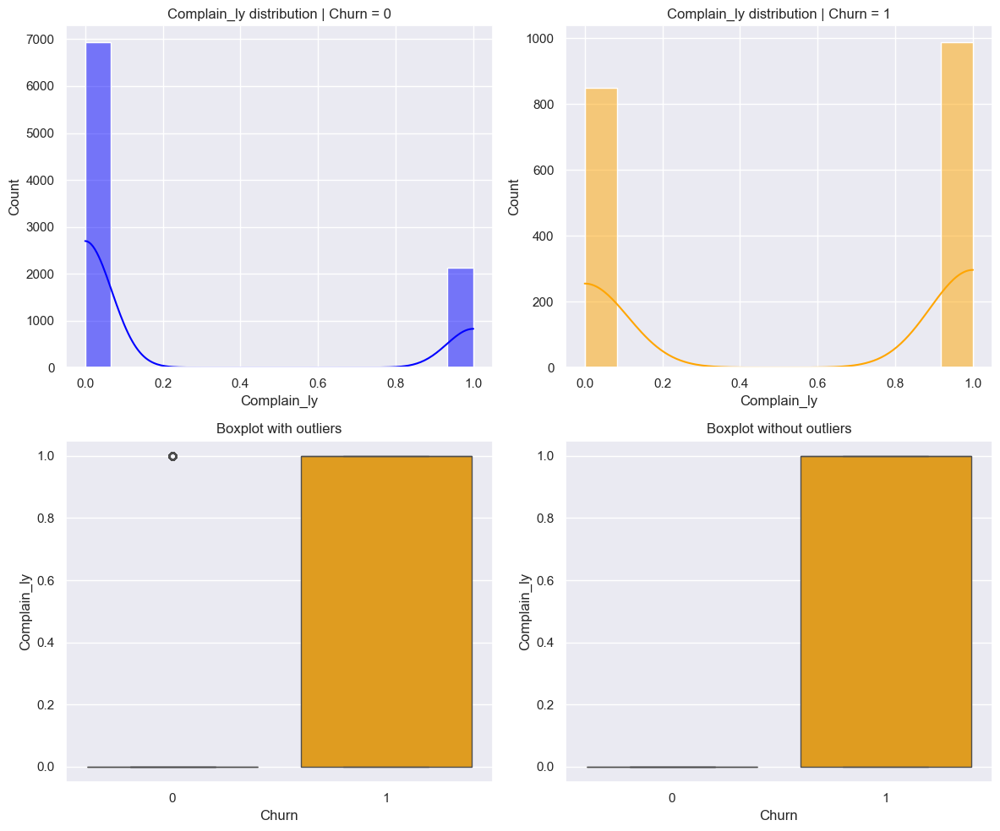

In [439]:
distribution_plot_wrt_target(df, "Complain_ly", "Churn")

9. Churn vs rev_growth_yoy

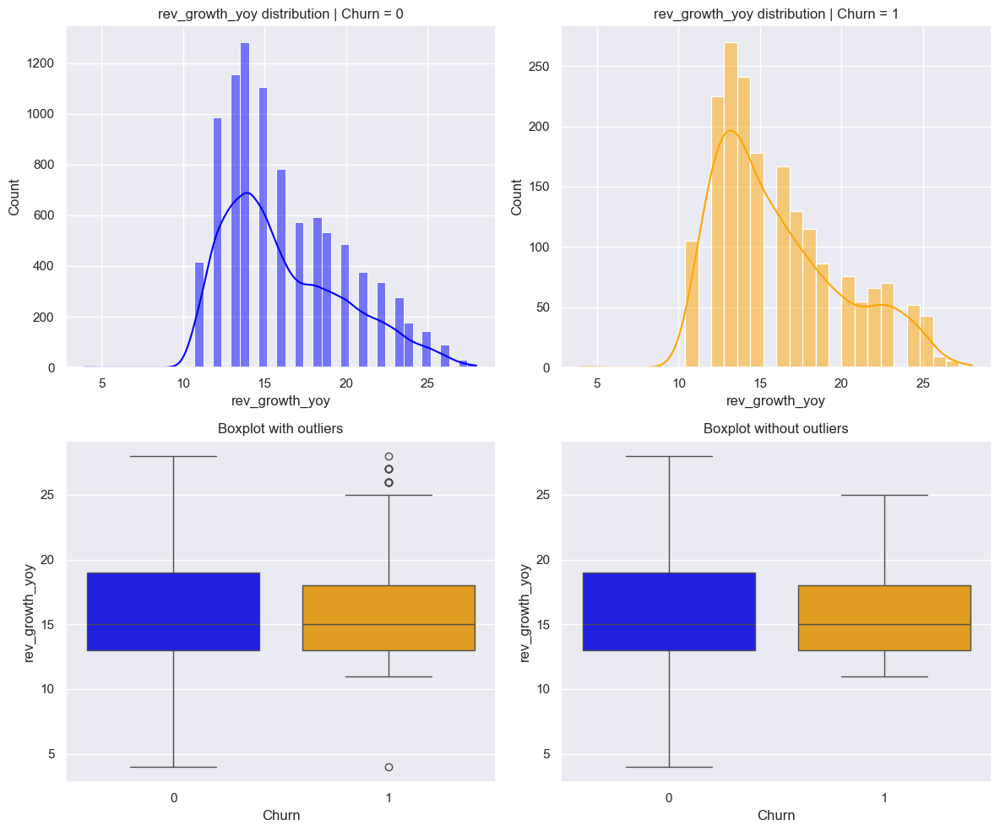

In [441]:
distribution_plot_wrt_target(df, "rev_growth_yoy", "Churn")

10. Churn vs coupon_used_for_payment

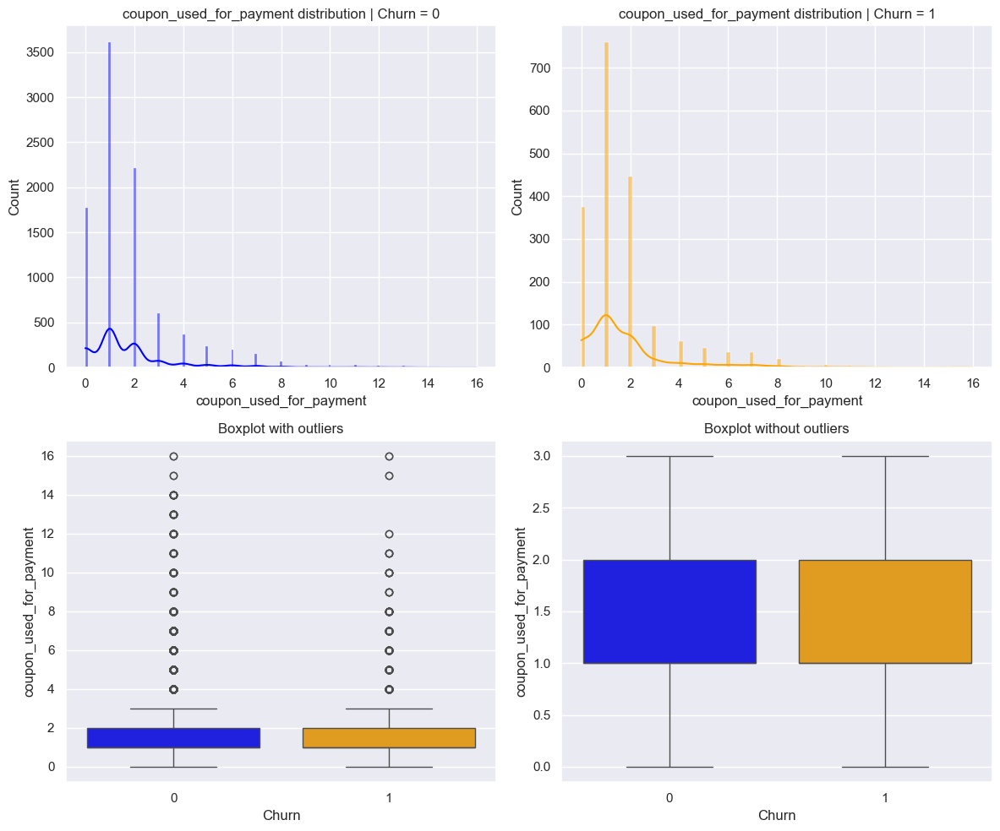

In [443]:
distribution_plot_wrt_target(df, "coupon_used_for_payment", "Churn")

11. Churn vs Day_Since_CC_connect

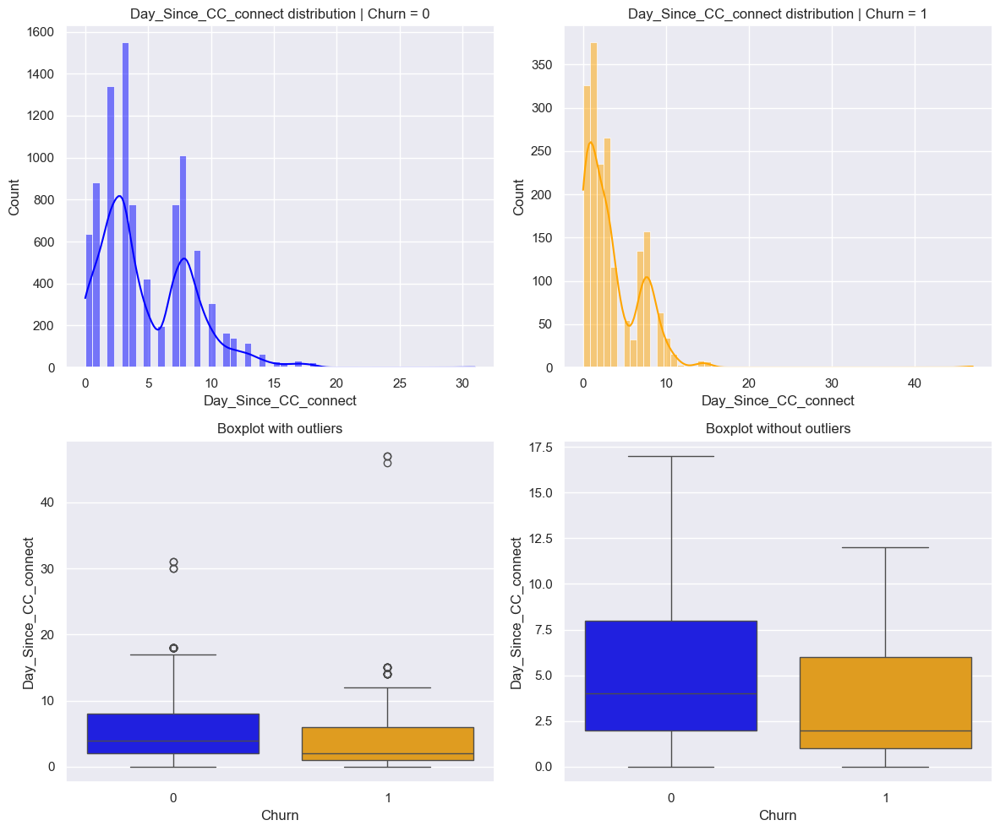

In [445]:
distribution_plot_wrt_target(df, "Day_Since_CC_connect", "Churn")

12. Churn vs cashback

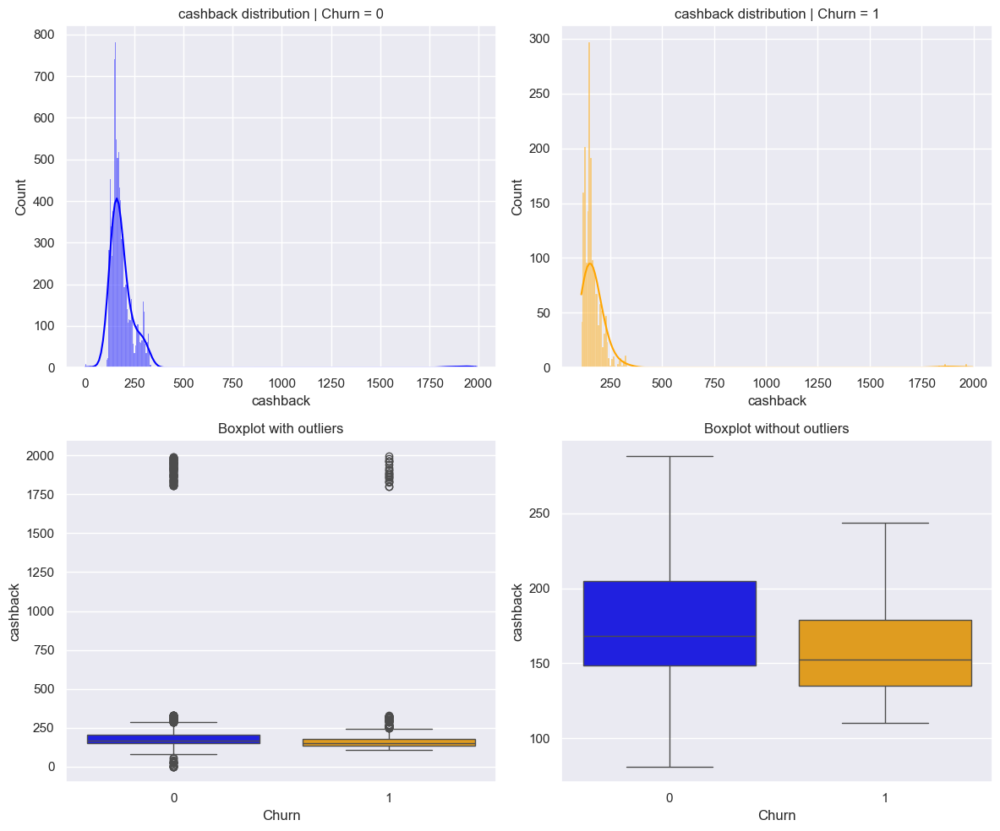

In [447]:
distribution_plot_wrt_target(df, "cashback", "Churn")

13. Churn vs Tenure vs Gender

<Figure size 500x300 with 0 Axes>

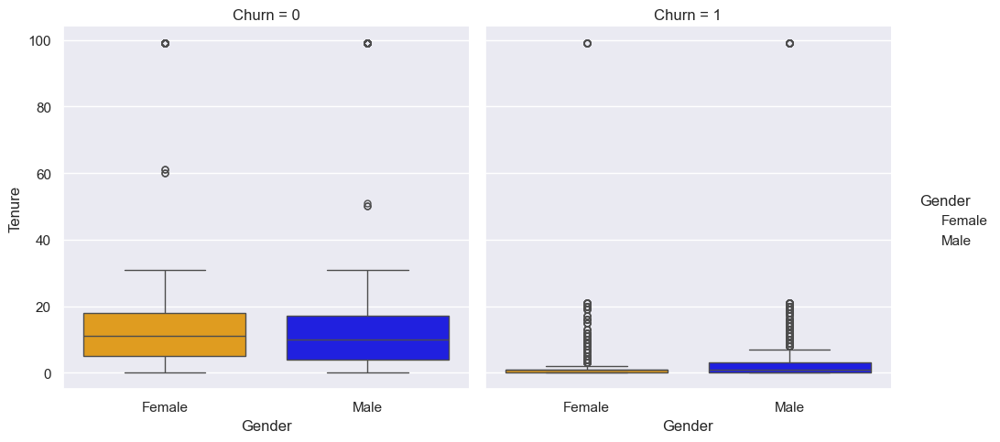

In [451]:
plt.figure(figsize=(5, 3))
sns.catplot(x="Gender", y="Tenure", col="Churn", data=df, kind="box",palette=["orange", "blue"]
   )
plt.show()

14. Churn vs Day_Since_CC_connect vs Gender

<Figure size 500x300 with 0 Axes>

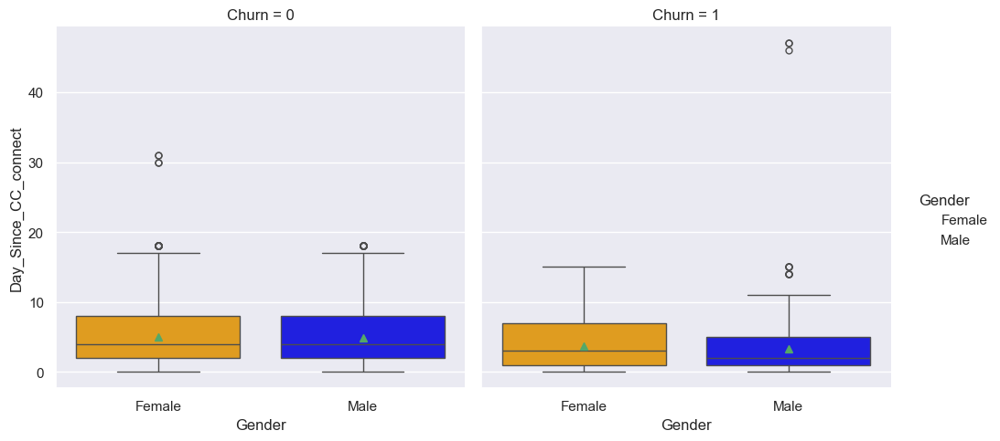

In [453]:
plt.figure(figsize=(5, 3))
sns.catplot(
    x="Gender",
    y="Day_Since_CC_connect",
    col="Churn",
    data=df,
    kind="box",
    showmeans=True, palette=["orange", "blue"]
)
plt.show()

15. Churn vs Marital_Status vs Gender

<Figure size 500x300 with 0 Axes>

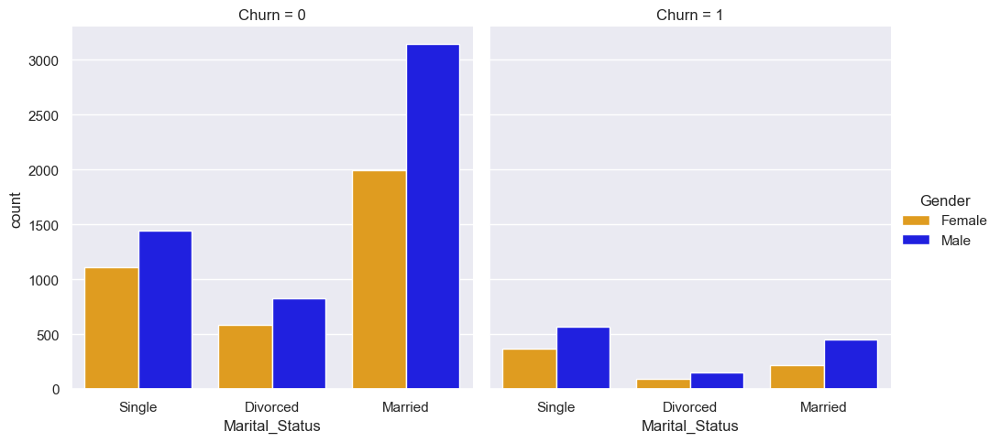

In [455]:
plt.figure(figsize=(5, 3))
sns.catplot(data=df, x="Marital_Status", hue="Gender", kind="count", col="Churn",palette=["orange", "blue"])
plt.show()

16. Churn vs Payment vs Gender

<Figure size 1200x800 with 0 Axes>

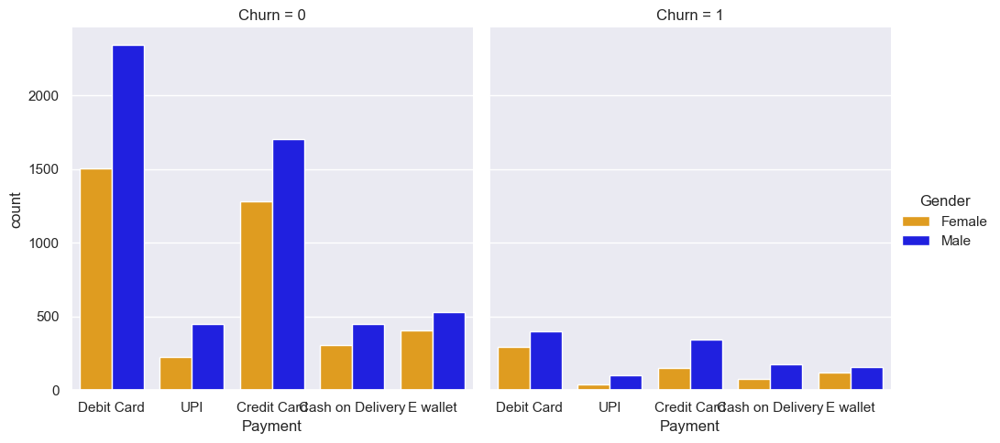

In [483]:
plt.figure(figsize=(12, 8))
sns.catplot(data=df, x="Payment", hue="Gender", kind="count", col="Churn",palette=["orange", "blue"])
plt.show()

17. Churn vs account_segment vs Gender

<Figure size 500x300 with 0 Axes>

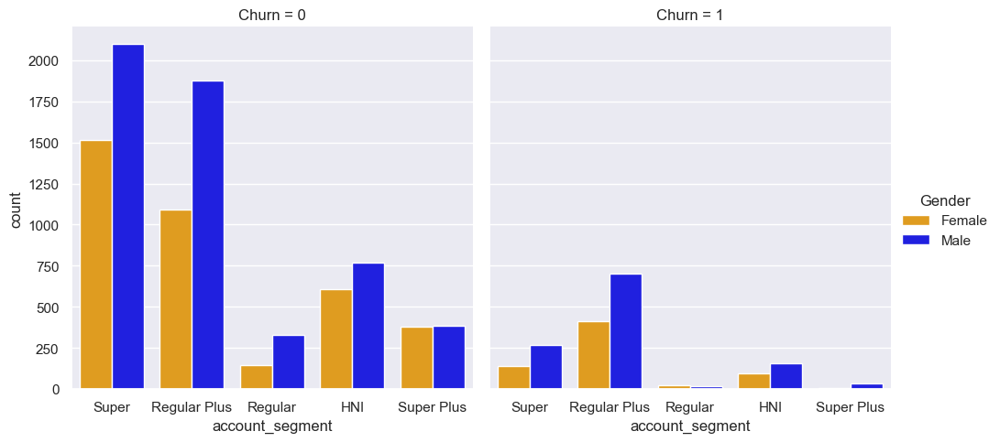

In [485]:
plt.figure(figsize=(5, 3))
sns.catplot(data=df, x="account_segment", hue="Gender", kind="count", col="Churn",palette=["orange", "blue"])
plt.show()

18. Churn vs Login_device vs Gender

<Figure size 500x300 with 0 Axes>

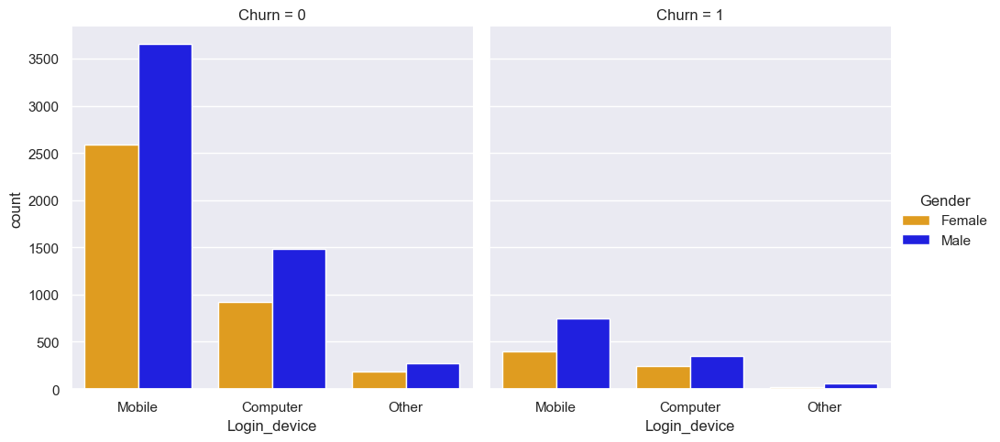

In [487]:
plt.figure(figsize=(5, 3))
sns.catplot(data=df, x="Login_device", hue="Gender", kind="count", col="Churn",palette=["orange", "blue"])
plt.show()

19. Churn vs Account_user_count vs Service_Score

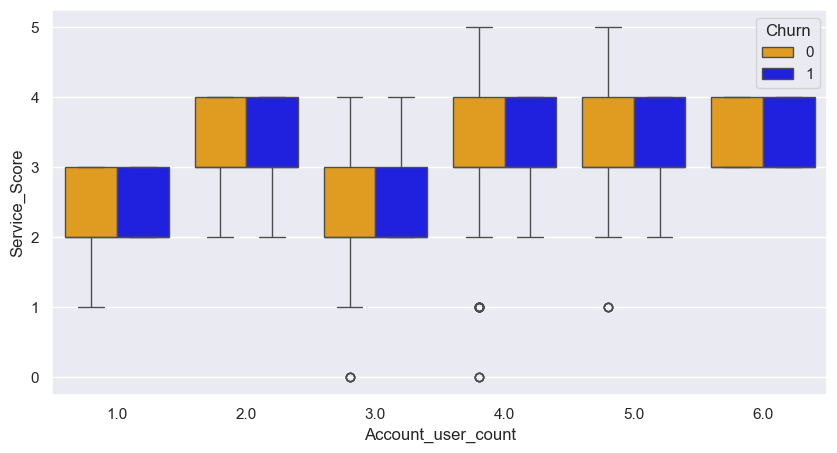

In [489]:
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x="Account_user_count", y="Service_Score", hue="Churn",palette=["orange", "blue"])
plt.show()

In [491]:
df1 = df

In [493]:
df1["Total_CC_Score"] = df1["CC_Contacted_LY"] + df1["CC_Agent_Score"]
df1["Avg_Coupon_Per_Month"] = df1["coupon_used_for_payment"] / df1["Tenure"].replace(0, 1)
df1["Is_Long_Term_Customer"] = (df1["Tenure"] > 12).astype(int)
df1["High_Cashback_User"] = (df1["cashback"] > df1["cashback"].quantile(0.75)).astype(int)


## Addition of new variable

In [496]:
df1.head()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,TenureGroup,Total_CC_Score,Avg_Coupon_Per_Month,Is_Long_Term_Customer,High_Cashback_User
0,1,4.000,3.000,6.000,Debit Card,Female,3.000,3.000,Super,2.000,Single,9.000,1.000,11.000,1.000,5.000,159.930,Mobile,3.0-5.0,8.000,0.250,0,0
1,1,0.000,1.000,8.000,UPI,Male,3.000,4.000,Regular Plus,3.000,Single,7.000,1.000,15.000,0.000,0.000,120.900,Mobile,NaN,11.000,0.000,0,0
2,1,0.000,1.000,30.000,Debit Card,Male,2.000,4.000,Regular Plus,3.000,Single,6.000,1.000,14.000,0.000,3.000,NaN,Mobile,NaN,33.000,0.000,0,0
3,1,0.000,3.000,15.000,Debit Card,Male,2.000,4.000,Super,5.000,Single,8.000,0.000,23.000,0.000,3.000,134.070,Mobile,NaN,20.000,0.000,0,0
4,1,0.000,1.000,12.000,Credit Card,Male,2.000,3.000,Regular Plus,5.000,Single,3.000,0.000,11.000,1.000,3.000,129.600,Mobile,NaN,17.000,1.000,0,0


In [498]:
df1["Total_CC_Score"].value_counts()

Total_CC_Score
18.000     619
17.000     610
19.000     604
16.000     578
15.000     570
14.000     569
13.000     550
12.000     535
20.000     527
11.000     445
21.000     403
22.000     385
10.000     360
23.000     327
24.000     311
9.000      275
25.000     263
26.000     244
27.000     239
29.000     200
32.000     197
28.000     195
35.000     189
30.000     182
31.000     177
33.000     166
36.000     165
34.000     164
37.000     158
39.000     133
8.000      132
38.000     130
40.000     111
41.000      68
7.000       57
42.000      57
43.000      53
44.000      38
45.000      28
46.000      16
47.000       8
127.000      1
128.000      1
133.000      1
130.000      1
Name: count, dtype: int64

In [500]:
df1["Avg_Coupon_Per_Month"].value_counts()

Avg_Coupon_Per_Month
0.000    2109
1.000    1238
2.000     640
0.250     362
0.333     354
         ... 
0.061       1
0.476       1
0.867       1
0.081       1
0.101       1
Name: count, Length: 208, dtype: int64

In [502]:
df1["Is_Long_Term_Customer"].value_counts()

Is_Long_Term_Customer
0    7369
1    3891
Name: count, dtype: int64

In [504]:
df1["High_Cashback_User"].value_counts()

High_Cashback_User
0    8563
1    2697
Name: count, dtype: int64

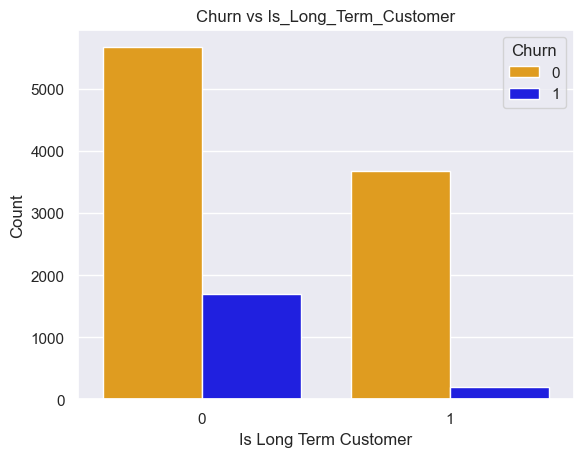

In [506]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(x="Is_Long_Term_Customer", hue="Churn", data=df, palette=["orange", "blue"])
plt.title("Churn vs Is_Long_Term_Customer")
plt.xlabel("Is Long Term Customer")
plt.ylabel("Count")
plt.show()


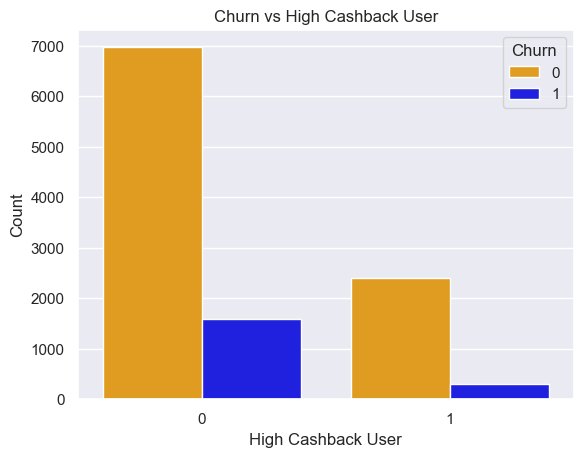

In [508]:
sns.countplot(x="High_Cashback_User", hue="Churn", data=df, palette=["orange", "blue"])
plt.title("Churn vs High Cashback User")
plt.xlabel("High Cashback User")
plt.ylabel("Count")
plt.show()



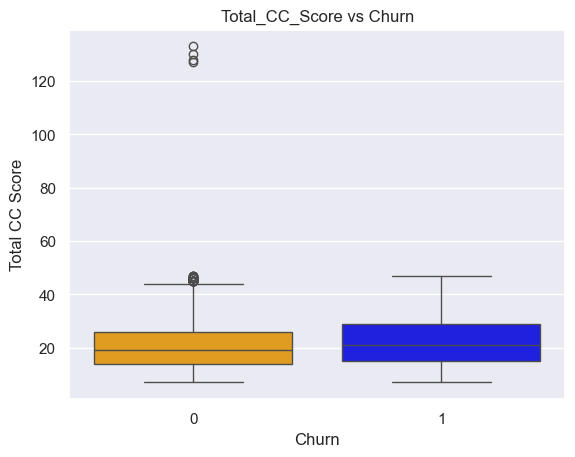

In [510]:
sns.boxplot(x="Churn", y="Total_CC_Score", data=df, palette=["orange", "blue"])
plt.title("Total_CC_Score vs Churn")
plt.xlabel("Churn")
plt.ylabel("Total CC Score")
plt.show()


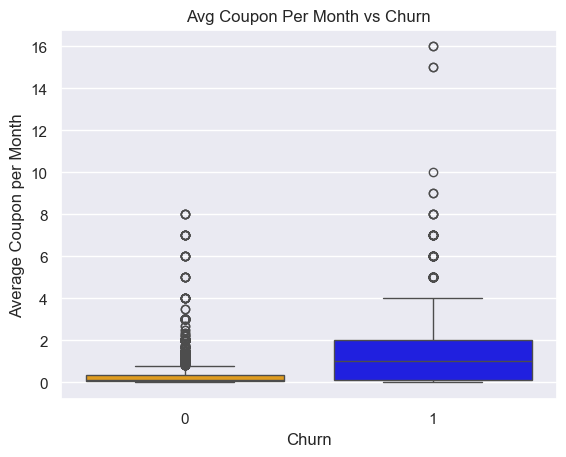

In [512]:
sns.boxplot(x="Churn", y="Avg_Coupon_Per_Month", data=df, palette=["orange", "blue"])
plt.title("Avg Coupon Per Month vs Churn")
plt.xlabel("Churn")
plt.ylabel("Average Coupon per Month")
plt.show()


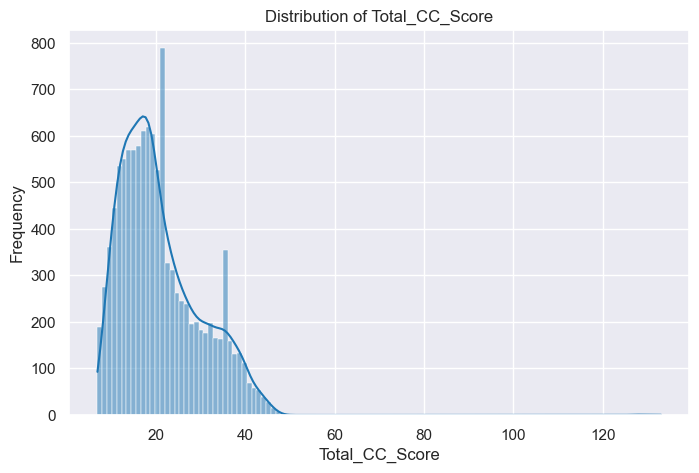

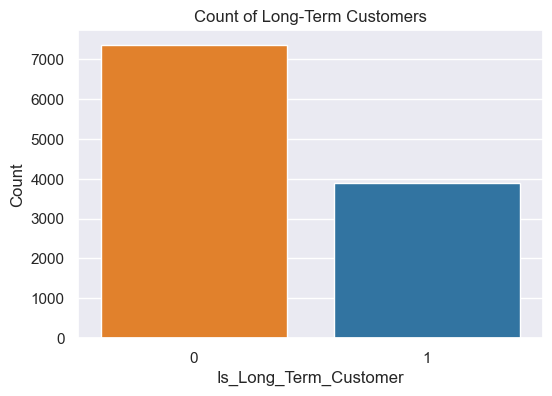

In [520]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set color palette
blue = "#1f77b4"
orange = "#ff7f0e"

# For numeric engineered feature
plt.figure(figsize=(8, 5))
sns.histplot(df1['Total_CC_Score'], kde=True, color=blue)
plt.title('Distribution of Total_CC_Score')
plt.xlabel('Total_CC_Score')
plt.ylabel('Frequency')
plt.show()

# For binary/categorical engineered feature
plt.figure(figsize=(6, 4))
sns.countplot(x='Is_Long_Term_Customer', data=df1, palette=[orange, blue])
plt.title('Count of Long-Term Customers')
plt.xlabel('Is_Long_Term_Customer')
plt.ylabel('Count')
plt.show()



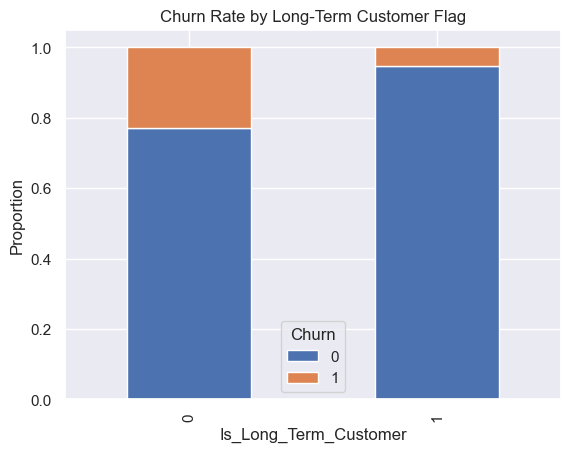

In [518]:
pd.crosstab(df1['Is_Long_Term_Customer'], df1['Churn'], normalize='index').plot(kind='bar', stacked=True)
plt.title('Churn Rate by Long-Term Customer Flag')
plt.ylabel('Proportion')
plt.show()


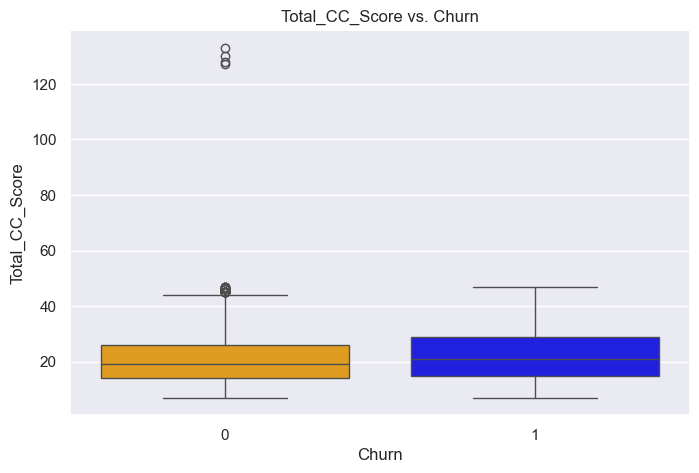

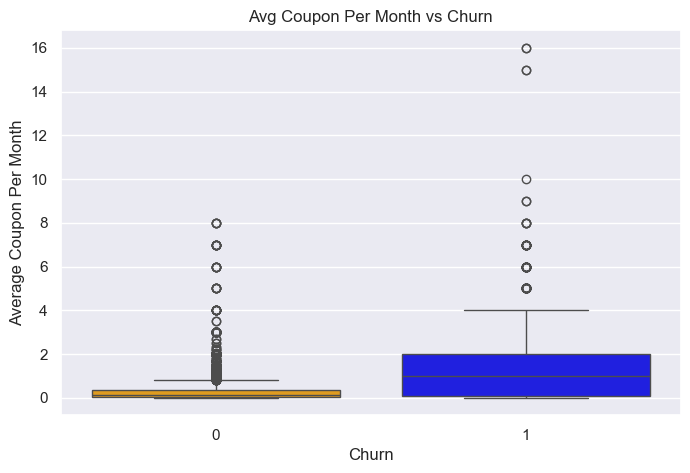

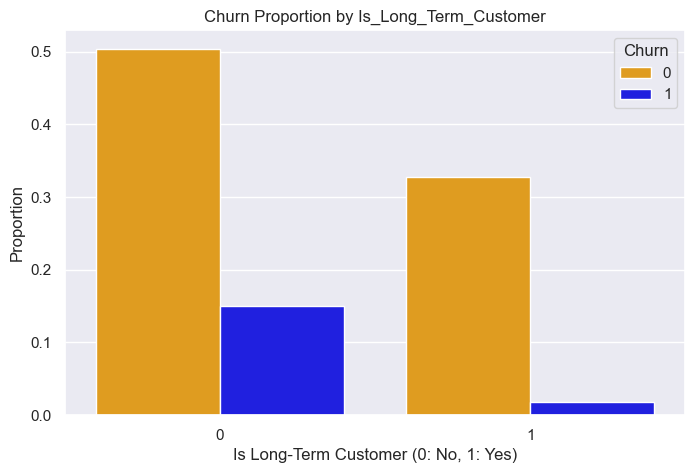

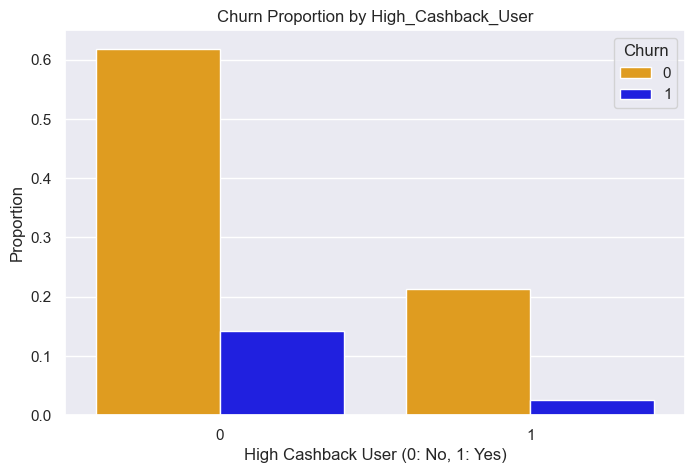

In [532]:
# --- Set a custom color palette for consistent orange and blue ---
# You can define your colors here. '#FFA500' is a standard orange, '#0000FF' is a standard blue.
# If you prefer a different shade, you can use other hex codes.
custom_palette = ['#FFA500', '#0000FF'] # Orange for 0 (Not Churned), Blue for 1 (Churned)
# OR if 0 is blue and 1 is orange: custom_palette = ['#0000FF', '#FFA500']

# --- Plotting with Custom Colors ---

# 1. Total_CC_Score vs. Churn
plt.figure(figsize=(8, 5))
sns.boxplot(x='Churn', y='Total_CC_Score', data=df, palette=custom_palette)
plt.title('Total_CC_Score vs. Churn')

plt.ylabel('Total_CC_Score')
plt.show()


# 2. Avg_Coupon_Per_Month vs. Churn
plt.figure(figsize=(8, 5))
sns.boxplot(x='Churn', y='Avg_Coupon_Per_Month', data=df, palette=custom_palette)
plt.title('Avg Coupon Per Month vs Churn')

plt.ylabel('Average Coupon Per Month')
plt.show()


# 3. Is_Long_Term_Customer vs. Churn
plt.figure(figsize=(8, 5))
# For countplot with hue, the `hue` variable will use the palette
sns.countplot(x='Is_Long_Term_Customer', hue='Churn', data=df, stat='proportion', palette=custom_palette)
plt.title('Churn Proportion by Is_Long_Term_Customer')
plt.xlabel('Is Long-Term Customer (0: No, 1: Yes)')
plt.ylabel('Proportion')

plt.show()


# 4. High_Cashback_User vs. Churn
plt.figure(figsize=(8, 5))
sns.countplot(x='High_Cashback_User', hue='Churn', data=df, stat='proportion', palette=custom_palette)
plt.title('Churn Proportion by High_Cashback_User')
plt.xlabel('High Cashback User (0: No, 1: Yes)')
plt.ylabel('Proportion')

plt.show()

In [756]:
df.dtypes



Churn                        int64
Tenure                     float64
City_Tier                  float64
CC_Contacted_LY            float64
Payment                     object
Gender                      object
Service_Score              float64
Account_user_count         float64
account_segment             object
CC_Agent_Score             float64
Marital_Status              object
rev_per_month              float64
Complain_ly                float64
rev_growth_yoy             float64
coupon_used_for_payment    float64
Day_Since_CC_connect       float64
cashback                   float64
Login_device                object
dtype: object

<Axes: xlabel='Churn', ylabel='Density'>

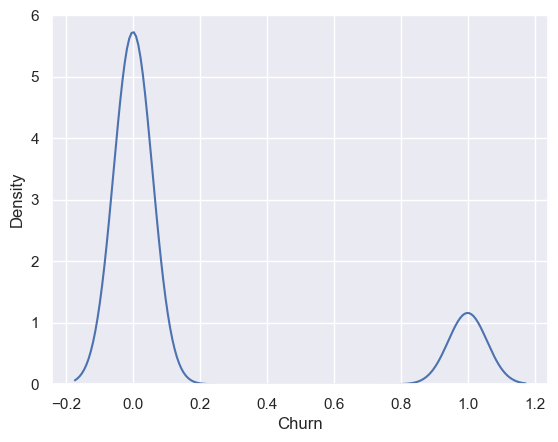

In [758]:
# checking if data is balanced
sns.kdeplot(data=df, x="Churn")

In [760]:
import pandas as pd

# Select only numeric columns
df_numeric = df.select_dtypes(include='number')

# Calculate Q1, Q3, and IQR for numeric columns only
Q1 = df_numeric.quantile(0.25)
Q3 = df_numeric.quantile(0.75)
IQR = Q3 - Q1

# Calculate outlier mask for numeric columns only
outlier_mask = (df_numeric < (Q1 - 1.5 * IQR)) | (df_numeric > (Q3 + 1.5 * IQR))

# Calculate percentage of outliers per column
outlier_percent = (outlier_mask.sum() / df_numeric.shape[0]) * 100

# Convert to DataFrame and round
outlier_percent_df = pd.DataFrame(outlier_percent, columns=['outlier %']).round(2)

print(outlier_percent_df)


                         outlier %
Churn                       16.840
Tenure                       1.230
City_Tier                    0.000
CC_Contacted_LY              0.370
Service_Score                0.120
Account_user_count           6.760
CC_Agent_Score               0.000
rev_per_month                1.640
Complain_ly                  0.000
rev_growth_yoy               0.000
coupon_used_for_payment     12.260
Day_Since_CC_connect         1.150
cashback                     8.760


In [544]:
df.isnull()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,TenureGroup,Total_CC_Score,Avg_Coupon_Per_Month,Is_Long_Term_Customer,High_Cashback_User,Scaled_Churn,Scaled_Tenure,Scaled_City_Tier,Scaled_CC_Contacted_LY
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
11256,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
11257,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
11258,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [762]:
import pandas as pd

print("Kurtosis and skewness of dataset are as below:")

# Select numeric columns only
df_numeric = df.select_dtypes(include='number')

# Calculate kurtosis and skewness
stats_df = pd.DataFrame(
    data=[df_numeric.kurtosis(), df_numeric.skew()],
    index=['Kurtosis', 'Skewness']
).T.round(2)

print(stats_df)


Kurtosis and skewness of dataset are as below:
                         Kurtosis  Skewness
Churn                       1.140     1.770
Tenure                     23.920     3.940
City_Tier                  -1.370     0.750
CC_Contacted_LY             8.330     1.430
Service_Score              -0.650     0.000
Account_user_count          0.730    -0.430
CC_Agent_Score             -1.110    -0.140
rev_per_month              93.890     9.440
Complain_ly                -1.000     1.000
rev_growth_yoy             -0.220     0.750
coupon_used_for_payment     9.100     2.580
Day_Since_CC_connect        5.570     1.320
cashback                   84.850     8.970


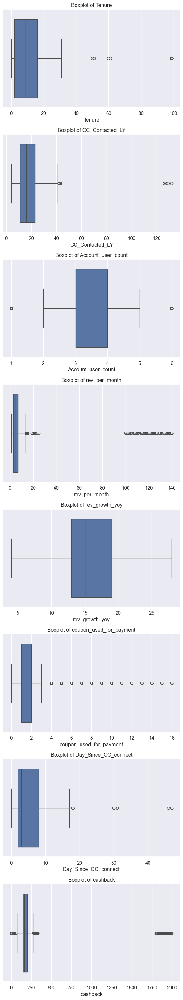

In [548]:
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = [ 'Tenure', 'CC_Contacted_LY', 'Account_user_count', 'rev_per_month',  'rev_growth_yoy', 'coupon_used_for_payment', 
            'Day_Since_CC_connect', 'cashback']

plt.figure(figsize=(6, len(num_cols)*4))  # Height adjusts based on number of columns

for i, col in enumerate(num_cols, 1):
    plt.subplot(len(num_cols), 1, i)
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()

plt.show()


In [764]:
#treating outlier
def remove_outlier(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range  

In [766]:
import numpy as np

# Define IQR-based outlier removal function
def remove_outlier(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound

# List of columns to apply outlier capping
cols_to_cap = ['Tenure', 'CC_Contacted_LY', 'Account_user_count', 'cashback', 
               'rev_per_month', 'Day_Since_CC_connect', 'coupon_used_for_payment', 'rev_growth_yoy']

# Apply capping
for col in cols_to_cap:
    lw, up = remove_outlier(df[col])
    df[col] = np.where(df[col] > up, up, df[col])
    df[col] = np.where(df[col] < lw, lw, df[col])


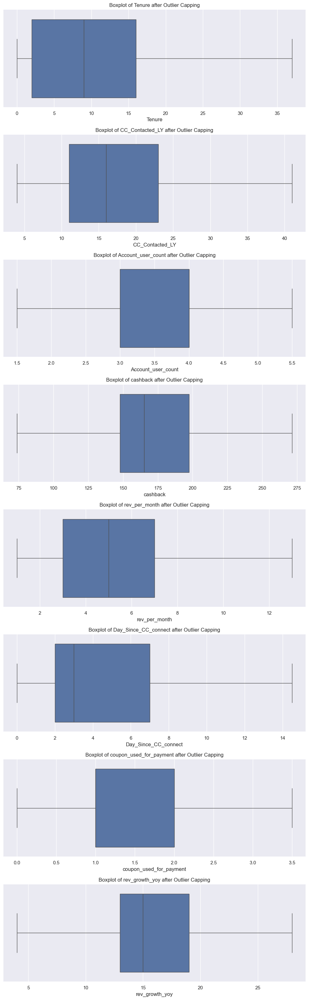

In [768]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, len(cols_to_cap)*4))

for i, col in enumerate(cols_to_cap, 1):
    plt.subplot(len(cols_to_cap), 1, i)
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col} after Outlier Capping')
    plt.tight_layout()

plt.show()


In [770]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    11260 non-null  int64  
 1   Tenure                   11260 non-null  float64
 2   City_Tier                11260 non-null  float64
 3   CC_Contacted_LY          11260 non-null  float64
 4   Payment                  11260 non-null  object 
 5   Gender                   11260 non-null  object 
 6   Service_Score            11260 non-null  float64
 7   Account_user_count       11260 non-null  float64
 8   account_segment          11260 non-null  object 
 9   CC_Agent_Score           11260 non-null  float64
 10  Marital_Status           11260 non-null  object 
 11  rev_per_month            11260 non-null  float64
 12  Complain_ly              11260 non-null  float64
 13  rev_growth_yoy           11260 non-null  float64
 14  coupon_used_for_paymen

In [772]:
from sklearn.preprocessing import LabelEncoder

categorical_cols = ['Payment', 'Gender', 'Marital_Status', 'account_segment', 'Login_device']

for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])


In [774]:
numeric_cols = ['Service_Score', 'Account_user_count', 'CC_Agent_Score', 'rev_per_month', 
                'coupon_used_for_payment', 'Day_Since_CC_connect', 'cashback', 'Complain_ly', 'rev_growth_yoy',]

for col in numeric_cols:
    df[col] = df[col].fillna(0)    # Fill NaN with 0 (or use another value)
    df[col] = df[col].astype('int64')


In [776]:
for col in numeric_cols:
    median_value = df[col].median()
    df[col] = df[col].fillna(median_value)
    df[col] = df[col].astype('int64')


In [778]:
import numpy as np

# Replace infinite values with NaN, then fill NaN
df.replace([np.inf, -np.inf], np.nan, inplace=True)


In [780]:
numeric_cols = ['Service_Score', 'Account_user_count', 'CC_Agent_Score', 'rev_per_month', 
                'coupon_used_for_payment', 'Day_Since_CC_connect', 'cashback', 'Complain_ly', 'rev_growth_yoy']

for col in numeric_cols:
    df[col] = df[col].astype('int64')


In [781]:
df['Payment'] = df['Payment'].astype('int64')
df['Gender'] = df['Gender'].astype('int64')
df['Service_Score'] = df['Service_Score'].astype('int64')
df['Account_user_count'] = df['Account_user_count'].astype('int64')
df['account_segment'] = df['account_segment'].astype('int64')
df['CC_Agent_Score'] = df['CC_Agent_Score'].astype('int64')
df['rev_per_month'] = df['rev_per_month'].astype('int64')
df['coupon_used_for_payment'] = df['coupon_used_for_payment'].astype('int64')
df['Day_Since_CC_connect'] = df['Day_Since_CC_connect'].astype('int64')
df['cashback'] = df['cashback'].astype('int64')
df['Marital_Status'] = df['Marital_Status'].astype('int64')
df['Complain_ly'] = df['Complain_ly'].astype('int64')
df['rev_growth_yoy'] = df['rev_growth_yoy'].astype('int64')
df['Login_device'] = df['Login_device'].astype('int64')



In [784]:
from sklearn.preprocessing import MinMaxScaler

df['Scaled_Churn'] = MinMaxScaler().fit_transform(df[['Churn']])
df['Scaled_Tenure'] = MinMaxScaler().fit_transform(df[['Tenure']])
df['Scaled_City_Tier'] = MinMaxScaler().fit_transform(df[['City_Tier']])
df['Scaled_CC_Contacted_LY'] = MinMaxScaler().fit_transform(df[['CC_Contacted_LY']])
df['Scaled_Payment'] = MinMaxScaler().fit_transform(df[['Payment']])
df['Scaled_Gender'] = MinMaxScaler().fit_transform(df[['Gender']])
df['Scaled_Service_Score'] = MinMaxScaler().fit_transform(df[['Service_Score']])
df['Scaled_Account_user_count'] = MinMaxScaler().fit_transform(df[['Account_user_count']])
df['Scaled_account_segment'] = MinMaxScaler().fit_transform(df[['account_segment']])
df['Scaled_CC_Agent_Score'] = MinMaxScaler().fit_transform(df[['CC_Agent_Score']])
df['Scaled_Marital_Status'] = MinMaxScaler().fit_transform(df[['Marital_Status']])
df['Scaled_rev_per_month'] = MinMaxScaler().fit_transform(df[['rev_per_month']])
df['Scaled_Complain_ly'] = MinMaxScaler().fit_transform(df[['Complain_ly']])
df['Scaled_rev_growth_yoy'] = MinMaxScaler().fit_transform(df[['rev_growth_yoy']])
df['Scaled_coupon_used_for_payment'] = MinMaxScaler().fit_transform(df[['coupon_used_for_payment']])
df['Scaled_Day_Since_CC_connect'] = MinMaxScaler().fit_transform(df[['Day_Since_CC_connect']])
df['Scaled_cashback'] = MinMaxScaler().fit_transform(df[['cashback']])
df['Scaled_Login_device'] = MinMaxScaler().fit_transform(df[['Login_device']])




In [786]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 36 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Churn                           11260 non-null  int64  
 1   Tenure                          11260 non-null  float64
 2   City_Tier                       11260 non-null  float64
 3   CC_Contacted_LY                 11260 non-null  float64
 4   Payment                         11260 non-null  int64  
 5   Gender                          11260 non-null  int64  
 6   Service_Score                   11260 non-null  int64  
 7   Account_user_count              11260 non-null  int64  
 8   account_segment                 11260 non-null  int64  
 9   CC_Agent_Score                  11260 non-null  int64  
 10  Marital_Status                  11260 non-null  int64  
 11  rev_per_month                   11260 non-null  int64  
 12  Complain_ly                     

In [788]:
churn_scaled = pd.DataFrame({
    
    'Tenure': df['Scaled_Tenure'],    
    'City_Tier': df['Scaled_City_Tier'],    
    'CC_Contacted_LY': df['Scaled_CC_Contacted_LY'],    
    'Payment': df['Scaled_Payment'],    
    'Gender': df['Scaled_Gender'],    
    'Service_Score': df['Scaled_Service_Score'],    
    'Account_user_count': df['Scaled_Account_user_count'],    
    'account_segment': df['Scaled_account_segment'],    
    'CC_Agent_Score': df['Scaled_CC_Agent_Score'],    
    'Marital_Status': df['Scaled_Marital_Status'],    
    'rev_per_month': df['Scaled_rev_per_month'],    
    'Complain_ly': df['Scaled_Complain_ly'],    
    'rev_growth_yoy': df['Scaled_rev_growth_yoy'],    
    'coupon_used_for_payment': df['Scaled_coupon_used_for_payment'],    
    'Day_Since_CC_connect': df['Scaled_Day_Since_CC_connect'],
    'cashback': df['Scaled_cashback'],    
    'Login_device': df['Scaled_Login_device']
})

churn_scaled


,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,0.108,1.000,0.054,0.500,0.000,0.600,0.500,0.750,0.250,1.000,0.667,1.000,0.292,0.333,0.357,0.434,0.500
1,0.000,0.000,0.108,1.000,1.000,0.600,0.750,0.500,0.500,1.000,0.500,1.000,0.458,0.000,0.000,0.237,0.500
2,0.000,0.000,0.703,0.500,1.000,0.400,0.750,0.500,0.500,1.000,0.417,1.000,0.417,0.000,0.214,0.465,0.500
3,0.000,1.000,0.297,0.500,1.000,0.400,0.750,0.750,1.000,1.000,0.583,0.000,0.792,0.000,0.214,0.308,0.500
4,0.000,0.000,0.216,0.250,1.000,0.400,0.500,0.500,1.000,1.000,0.167,0.000,0.292,0.333,0.214,0.283,0.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,0.270,0.000,0.811,0.250,1.000,0.600,0.250,0.750,0.000,0.500,0.667,0.000,0.625,0.333,0.286,0.404,0.000
11256,0.351,0.000,0.405,0.250,1.000,0.600,1.000,0.000,1.000,0.500,0.500,0.000,0.500,0.333,0.571,0.773,0.500
11257,0.027,0.000,0.270,0.500,1.000,0.600,0.250,0.750,0.750,0.500,0.500,1.000,0.750,0.333,0.286,0.596,0.500
11258,0.622,1.000,0.189,0.250,1.000,0.800,1.000,0.750,0.750,0.500,0.500,0.000,0.500,0.667,0.643,0.535,0.000


In [790]:
churn_scaled = pd.DataFrame({
'Churn': df['Scaled_Churn'] ,    
'Tenure': df['Scaled_Tenure'] ,    
'City_Tier': df['Scaled_City_Tier'] ,    
'CC_Contacted_LY': df['Scaled_CC_Contacted_LY'] ,    
'Payment': df['Scaled_Payment'] ,    
'Gender': df['Scaled_Gender'] ,    
'Service_Score': df['Scaled_Service_Score'] ,    
'Account_user_count': df['Scaled_Account_user_count'] ,    
'account_segment': df['Scaled_account_segment'] ,    
'CC_Agent_Score': df['Scaled_CC_Agent_Score'] ,    
'Marital_Status': df['Scaled_Marital_Status'] ,    
'rev_per_month': df['Scaled_rev_per_month'] ,    
'Complain_ly': df['Scaled_Complain_ly'] ,    
'rev_growth_yoy': df['Scaled_rev_growth_yoy'] ,    
'coupon_used_for_payment': df['Scaled_coupon_used_for_payment'] ,    
'Day_Since_CC_connect': df['Scaled_Day_Since_CC_connect'] ,
'cashback': df['Scaled_cashback'] ,    
'Login_device': df['Scaled_Login_device'] })
churn_scaled

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1.000,0.108,1.000,0.054,0.500,0.000,0.600,0.500,0.750,0.250,1.000,0.667,1.000,0.292,0.333,0.357,0.434,0.500
1,1.000,0.000,0.000,0.108,1.000,1.000,0.600,0.750,0.500,0.500,1.000,0.500,1.000,0.458,0.000,0.000,0.237,0.500
2,1.000,0.000,0.000,0.703,0.500,1.000,0.400,0.750,0.500,0.500,1.000,0.417,1.000,0.417,0.000,0.214,0.465,0.500
3,1.000,0.000,1.000,0.297,0.500,1.000,0.400,0.750,0.750,1.000,1.000,0.583,0.000,0.792,0.000,0.214,0.308,0.500
4,1.000,0.000,0.000,0.216,0.250,1.000,0.400,0.500,0.500,1.000,1.000,0.167,0.000,0.292,0.333,0.214,0.283,0.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,0.000,0.270,0.000,0.811,0.250,1.000,0.600,0.250,0.750,0.000,0.500,0.667,0.000,0.625,0.333,0.286,0.404,0.000
11256,0.000,0.351,0.000,0.405,0.250,1.000,0.600,1.000,0.000,1.000,0.500,0.500,0.000,0.500,0.333,0.571,0.773,0.500
11257,0.000,0.027,0.000,0.270,0.500,1.000,0.600,0.250,0.750,0.750,0.500,0.500,1.000,0.750,0.333,0.286,0.596,0.500
11258,0.000,0.622,1.000,0.189,0.250,1.000,0.800,1.000,0.750,0.750,0.500,0.500,0.000,0.500,0.667,0.643,0.535,0.000


In [792]:
print(churn_scaled.std())

Churn                     0.374
Tenure                    0.240
City_Tier                 0.456
CC_Contacted_LY           0.231
Payment                   0.252
Gender                    0.489
Service_Score             0.144
Account_user_count        0.238
account_segment           0.280
CC_Agent_Score            0.343
Marital_Status            0.329
rev_per_month             0.240
Complain_ly               0.447
rev_growth_yoy            0.157
coupon_used_for_payment   0.332
Day_Since_CC_connect      0.248
cashback                  0.220
Login_device              0.259
dtype: float64


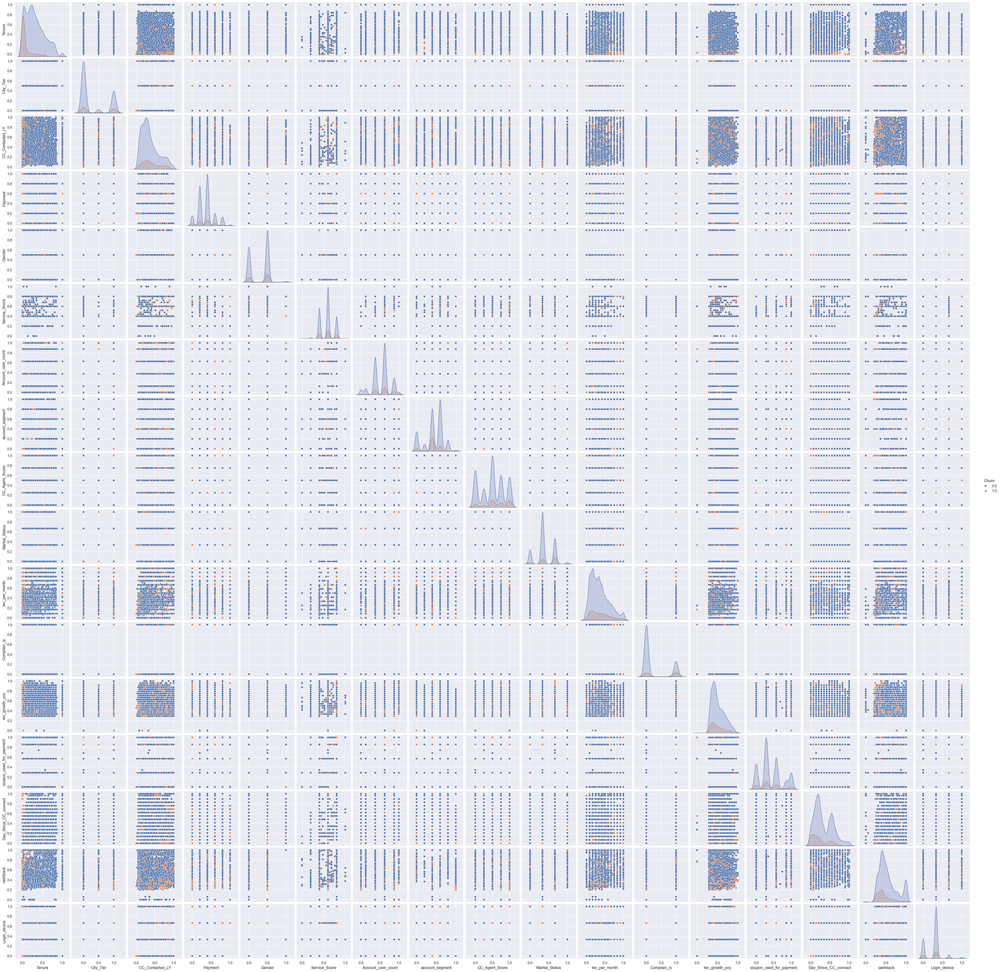

In [1474]:
# plotting sns plot
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# pair plot to check on data distribution and co-linearity
sns.pairplot(churn_scaled, hue = 'Churn', diag_kind='kde')  
plt.show()

Is the data unbalanced? If so, what can be done? Please explain in the context of the 
business 

In [794]:
df['Churn'].value_counts()

Churn
0    9364
1    1896
Name: count, dtype: int64

In [796]:
churn_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    11260 non-null  float64
 1   Tenure                   11260 non-null  float64
 2   City_Tier                11260 non-null  float64
 3   CC_Contacted_LY          11260 non-null  float64
 4   Payment                  11260 non-null  float64
 5   Gender                   11260 non-null  float64
 6   Service_Score            11260 non-null  float64
 7   Account_user_count       11260 non-null  float64
 8   account_segment          11260 non-null  float64
 9   CC_Agent_Score           11260 non-null  float64
 10  Marital_Status           11260 non-null  float64
 11  rev_per_month            11260 non-null  float64
 12  Complain_ly              11260 non-null  float64
 13  rev_growth_yoy           11260 non-null  float64
 14  coupon_used_for_paymen

In [798]:
churn_scaled['Payment'] = churn_scaled['Payment'].astype('int64')
churn_scaled['Gender'] = churn_scaled['Gender'].astype('int64')
churn_scaled['Service_Score'] = churn_scaled['Service_Score'].astype('int64')
churn_scaled['Account_user_count'] = churn_scaled['Account_user_count'].astype('int64')
churn_scaled['account_segment'] = churn_scaled['account_segment'].astype('int64')
churn_scaled['CC_Agent_Score'] = churn_scaled['CC_Agent_Score'].astype('int64')
churn_scaled['rev_per_month'] = churn_scaled['rev_per_month'].astype('int64')
churn_scaled['coupon_used_for_payment'] = churn_scaled['coupon_used_for_payment'].astype('int64')
churn_scaled['Day_Since_CC_connect'] = churn_scaled['Day_Since_CC_connect'].astype('int64')
churn_scaled['cashback'] = churn_scaled['cashback'].astype('int64')
churn_scaled['Marital_Status'] = churn_scaled['Marital_Status'].astype('int64')
churn_scaled['Complain_ly'] = churn_scaled['Complain_ly'].astype('int64')
churn_scaled['rev_growth_yoy'] = churn_scaled['rev_growth_yoy'].astype('int64')
churn_scaled['Login_device'] = churn_scaled['Login_device'].astype('int64')
#churn_scaled['Churn'] = churn_scaled['Churn'].astype('int64')
churn_scaled['Tenure'] = churn_scaled['Tenure'].astype('int64')
churn_scaled['City_Tier'] = churn_scaled['City_Tier'].astype('int64')
churn_scaled['CC_Contacted_LY'] = churn_scaled['CC_Contacted_LY'].astype('int64')

In [800]:
churn_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    11260 non-null  float64
 1   Tenure                   11260 non-null  int64  
 2   City_Tier                11260 non-null  int64  
 3   CC_Contacted_LY          11260 non-null  int64  
 4   Payment                  11260 non-null  int64  
 5   Gender                   11260 non-null  int64  
 6   Service_Score            11260 non-null  int64  
 7   Account_user_count       11260 non-null  int64  
 8   account_segment          11260 non-null  int64  
 9   CC_Agent_Score           11260 non-null  int64  
 10  Marital_Status           11260 non-null  int64  
 11  rev_per_month            11260 non-null  int64  
 12  Complain_ly              11260 non-null  int64  
 13  rev_growth_yoy           11260 non-null  int64  
 14  coupon_used_for_paymen

Splitting data into train and test data set1

In [802]:
# splitting data into independent and dependent variables
X = churn_scaled.drop('Churn' , axis=1)

y = churn_scaled.pop("Churn")

In [804]:

#splitting data into train and test data set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=1)

In [806]:
#checking the dimentsions of training and test data
print('X_train',X_train.shape)
print('X_test',X_test.shape)
print('y_train',y_train.shape)
print('y_test',y_test.shape)

X_train (7882, 17)
X_test (3378, 17)
y_train (7882,)
y_test (3378,)


In [808]:
from numpy import where
import matplotlib.pyplot as plt

from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE

In [810]:
X, y = make_classification(n_samples=1000, n_features=2, n_redundant=0, n_clusters_per_class=1, weights=[0.975], flip_y=0, random_state=1)
counter=Counter(y)
counter

Counter({0: 975, 1: 25})

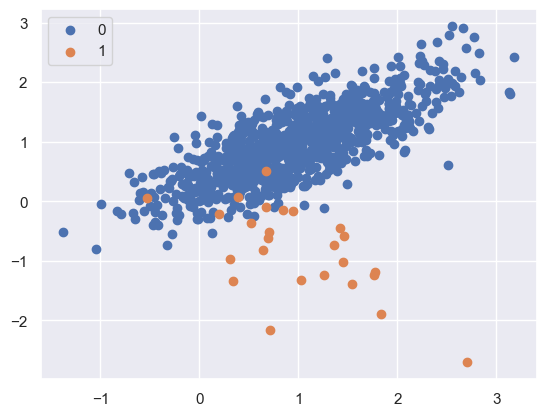

In [812]:
from collections import Counter
for label, _ in counter.items():
    row_ix = where(y == label)[0]
    plt.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
plt.legend()
plt.show()

## Performing SMOTE to balance data

In [814]:
from imblearn.over_sampling import SMOTE 
from collections import Counter

In [816]:
# applying smote to train dataset and resampling
sm = SMOTE(random_state=1)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())

In [818]:
#checking the dimentsions of training and test data
print('X_train_res',X_train_res.shape)
#print('X_test',X_test.shape)
print('y_train_res',y_train_res.shape)
#print('y_test',y_test.shape)

X_train_res (13112, 17)
y_train_res (13112,)


In [820]:
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

In [822]:
counter=Counter(y)
counter

Counter({0: 975, 1: 975})

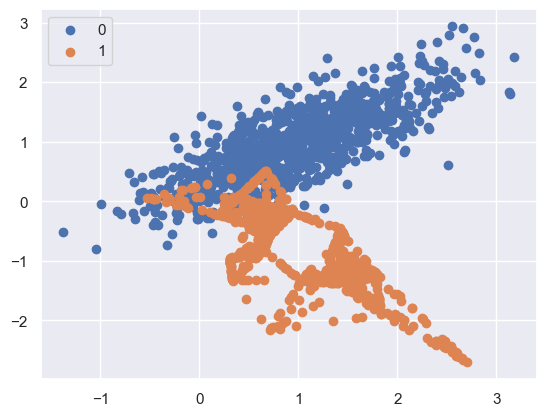

In [824]:
for label, _ in counter.items():
    row_ix = where(y == label)[0]
    plt.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
plt.legend()
plt.show()

In [826]:
from sklearn.preprocessing import StandardScaler, LabelEncoder



# Encode categorical variables
cat_cols = df.select_dtypes(include='object').columns
for col in cat_cols:
    df[col] = LabelEncoder().fit_transform(df[col])

# Scale the data
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

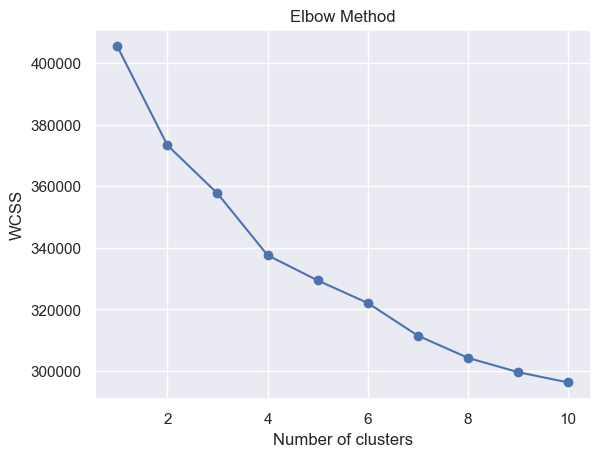

In [828]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Elbow method
wcss = []
for k in range(1, 11):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(df_scaled)
    wcss.append(km.inertia_)

plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [1173]:
k = 5  # example, choose based on elbow plot
kmeans = KMeans(n_clusters=k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df_scaled)

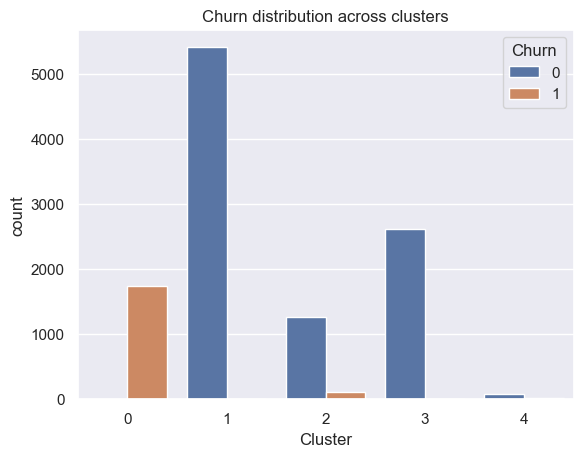

In [1175]:
import seaborn as sns

sns.countplot(data=df, x='Cluster', hue='Churn')
plt.title("Churn distribution across clusters")
plt.show()

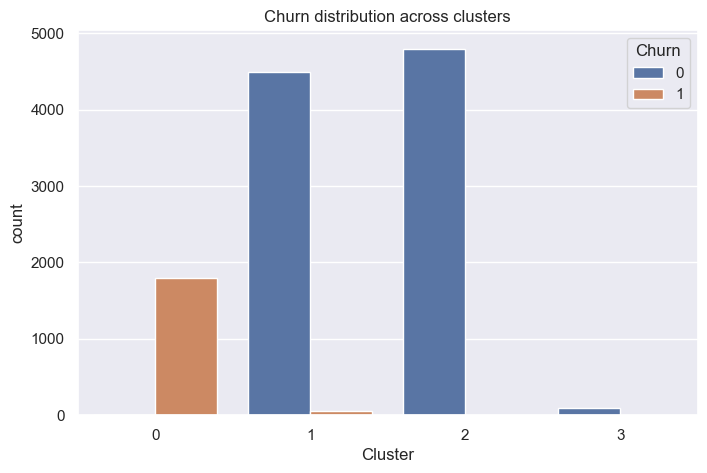

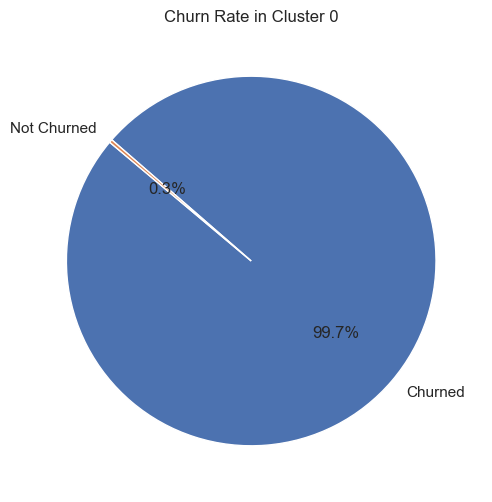

Churn
1   99.723
0    0.277
Name: proportion, dtype: float64

In [1177]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming churn_df is the clustered dataset with 'Cluster' and 'Churn' columns
# For demonstration, we'll create a mock structure similar to the plot
# Normally, this should be your actual dataset after clustering

# Creating a mock dataframe similar to the plot for demonstration
data = {
    'Cluster': [0]*1800 + [1]*4500 + [2]*4800 + [3]*100 + [1]*50 + [0]*5,
    'Churn':   [1]*1800 + [0]*4500 + [0]*4800 + [0]*100 + [1]*50 + [0]*5
}
churn_df = pd.DataFrame(data)

# 1. Cluster distribution
plt.figure(figsize=(8, 5))
sns.countplot(data=churn_df, x='Cluster', hue='Churn')
plt.title('Churn distribution across clusters')
plt.show()

# 2. EDA focusing on Cluster 0 (High churn cluster)
cluster_0 = churn_df[churn_df['Cluster'] == 0]

# Showing how many churned vs not in Cluster 0
churn_counts = cluster_0['Churn'].value_counts()

# 3. Pie chart of churn distribution in Cluster 0
plt.figure(figsize=(6, 6))
plt.pie(churn_counts, labels=['Churned' if i==1 else 'Not Churned' for i in churn_counts.index], autopct='%1.1f%%', startangle=140)
plt.title('Churn Rate in Cluster 0')
plt.show()

# Outputting some basic stats
cluster_0_summary = cluster_0['Churn'].value_counts(normalize=True) * 100
cluster_0_summary


In [1179]:
std_devs = df.std()
print(std_devs)


Churn                       0.374
Tenure                     12.758
City_Tier                   0.913
CC_Contacted_LY             8.815
Payment                     1.008
Gender                      0.489
Service_Score               0.722
Account_user_count          1.004
account_segment             1.119
CC_Agent_Score              1.373
Marital_Status              0.659
rev_per_month              11.489
Complain_ly                 0.447
rev_growth_yoy              3.757
coupon_used_for_payment     1.969
Day_Since_CC_connect        3.650
cashback                  174.978
Login_device                0.517
Cluster                     1.039
dtype: float64


In [141]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans 
import matplotlib.pyplot as plt
%matplotlib inline

In [143]:
wss =[] 
for i in range(1,11):
    KM = KMeans(n_clusters=i)
    KM.fit(churn_scaled)
    wss.append(KM.inertia_)

In [145]:
wss

[13987.429129662476,
 12221.800768981484,
 10740.326704193654,
 9750.3929737004,
 8550.265224055056,
 7713.314523363556,
 7048.9101582224575,
 6597.432545044252,
 5968.303352157189,
 5471.072862791295]

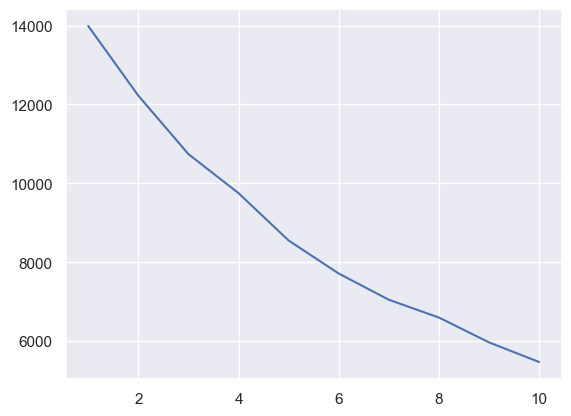

In [147]:
plt.plot(range(1,11), wss)

In [149]:
k_means = KMeans(n_clusters = 3)
k_means.fit(churn_scaled)
labels = k_means.labels_

In [151]:
churn_scaled["Clus_kmeans"] = labels
churn_scaled.head(5)

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Clus_kmeans
0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
1,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0
3,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,2
4,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0


In [153]:
churn_scaled.groupby(["Clus_kmeans"]).count()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
Clus_kmeans,,,,,,,,,,,,,,,,,
0,2870,2870,2870,2870,2870,2870,2870,2870,2870,2870,2870,2870,2870,2870,2870,2870,2870
1,5587,5587,5587,5587,5587,5587,5587,5587,5587,5587,5587,5587,5587,5587,5587,5587,5587
2,2803,2803,2803,2803,2803,2803,2803,2803,2803,2803,2803,2803,2803,2803,2803,2803,2803


# PROJECT NOTE - II

In [830]:

X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7882 entries, 7580 to 235
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Tenure                   7882 non-null   int64
 1   City_Tier                7882 non-null   int64
 2   CC_Contacted_LY          7882 non-null   int64
 3   Payment                  7882 non-null   int64
 4   Gender                   7882 non-null   int64
 5   Service_Score            7882 non-null   int64
 6   Account_user_count       7882 non-null   int64
 7   account_segment          7882 non-null   int64
 8   CC_Agent_Score           7882 non-null   int64
 9   Marital_Status           7882 non-null   int64
 10  rev_per_month            7882 non-null   int64
 11  Complain_ly              7882 non-null   int64
 12  rev_growth_yoy           7882 non-null   int64
 13  coupon_used_for_payment  7882 non-null   int64
 14  Day_Since_CC_connect     7882 non-null   int64
 15  cashbac

In [832]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3378 entries, 784 to 9559
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Tenure                   3378 non-null   int64
 1   City_Tier                3378 non-null   int64
 2   CC_Contacted_LY          3378 non-null   int64
 3   Payment                  3378 non-null   int64
 4   Gender                   3378 non-null   int64
 5   Service_Score            3378 non-null   int64
 6   Account_user_count       3378 non-null   int64
 7   account_segment          3378 non-null   int64
 8   CC_Agent_Score           3378 non-null   int64
 9   Marital_Status           3378 non-null   int64
 10  rev_per_month            3378 non-null   int64
 11  Complain_ly              3378 non-null   int64
 12  rev_growth_yoy           3378 non-null   int64
 13  coupon_used_for_payment  3378 non-null   int64
 14  Day_Since_CC_connect     3378 non-null   int64
 15  cashbac

In [834]:
X_train_res.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13112 entries, 0 to 13111
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Tenure                   13112 non-null  int64
 1   City_Tier                13112 non-null  int64
 2   CC_Contacted_LY          13112 non-null  int64
 3   Payment                  13112 non-null  int64
 4   Gender                   13112 non-null  int64
 5   Service_Score            13112 non-null  int64
 6   Account_user_count       13112 non-null  int64
 7   account_segment          13112 non-null  int64
 8   CC_Agent_Score           13112 non-null  int64
 9   Marital_Status           13112 non-null  int64
 10  rev_per_month            13112 non-null  int64
 11  Complain_ly              13112 non-null  int64
 12  rev_growth_yoy           13112 non-null  int64
 13  coupon_used_for_payment  13112 non-null  int64
 14  Day_Since_CC_connect     13112 non-null  int64
 15  ca

# Building Logistic Regression Model

In [836]:
# building Logistic regression model
# Fit the model on original data
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
# Fit the Logistic Regression model
lg = LogisticRegression(random_state=1)
lg.fit(X_train, y_train)

LogisticRegression(random_state=1)

In [165]:
# predict on train and test data set
ytrain_predict_lg = lg.predict(X_train) # can compare with y_train
ytest_predict_lg = lg.predict(X_test) # can compare with y_test

In [167]:
#Accuracy - Training Data
print("Accuracy of training dataset:",lg.score(X_train, y_train))

Accuracy of training dataset: 0.8382390256280132


In [169]:

# Accuracy - Test Data
print("Accuracy of testing dataset:",lg.score(X_test, y_test))

Accuracy of testing dataset: 0.8377738306690349


In [171]:
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import scale
# confusion matrix for train data set
print("Confusion Matrix for train dataset")
confusion_matrix(y_train, ytrain_predict_lg)

Confusion Matrix for train dataset


array([[6442,  114],
       [1161,  165]], dtype=int64)

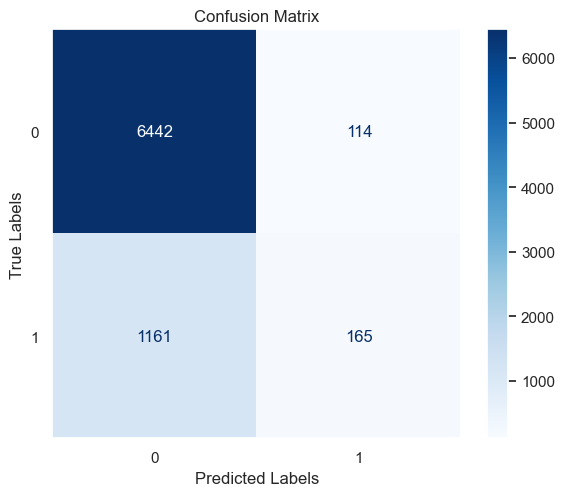

In [187]:
# Get predictions
y_pred =lg.predict(X_train)

# Compute confusion matrix
cm = confusion_matrix(y_train, y_pred)

# Create display object with custom settings
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

# Plot with improved aesthetics
fig, ax = plt.subplots(figsize=(6, 5))  # Change figsize as needed
disp.plot(cmap='Blues', ax=ax, values_format='d')  # 'd' for integer display

plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)  # Hide grid
plt.tight_layout()
plt.show()

In [173]:
# confusion matrix for test data set
print("Confusion Matrix for test dataset")
confusion_matrix(y_test, ytest_predict_lg)

Confusion Matrix for test dataset


array([[2756,   52],
       [ 496,   74]], dtype=int64)

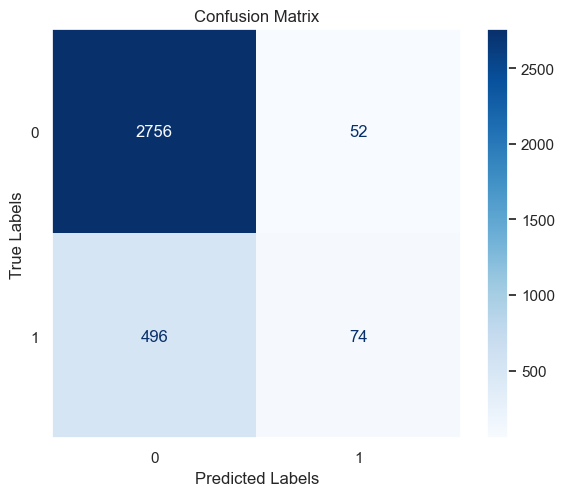

In [185]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

# Get predictions
y_pred =lg.predict(X_test)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create display object with custom settings
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

# Plot with improved aesthetics
fig, ax = plt.subplots(figsize=(6, 5))  # Change figsize as needed
disp.plot(cmap='Blues', ax=ax, values_format='d')  # 'd' for integer display

plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)  # Hide grid
plt.tight_layout()
plt.show()


In [179]:
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay

In [191]:
import pandas as pd
from sklearn.metrics import classification_report

report_dict = classification_report(y_train, ytrain_predict_lg, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()
print("Classification Report (Train):")
print(report_df)


Classification Report (Train):
              precision  recall  f1-score  support
0.0               0.847   0.983     0.910 6556.000
1.0               0.591   0.124     0.206 1326.000
accuracy          0.838   0.838     0.838    0.838
macro avg         0.719   0.554     0.558 7882.000
weighted avg      0.804   0.838     0.791 7882.000


In [193]:
import pandas as pd
from sklearn.metrics import classification_report

report_dict = classification_report(y_test, ytest_predict_lg, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()
print("Classification Report (Test):")
print(report_df)

Classification Report (Test):
              precision  recall  f1-score  support
0.0               0.847   0.981     0.910 2808.000
1.0               0.587   0.130     0.213  570.000
accuracy          0.838   0.838     0.838    0.838
macro avg         0.717   0.556     0.561 3378.000
weighted avg      0.804   0.838     0.792 3378.000


AUC score and ROC curve for training dataset
AUC: 0.750


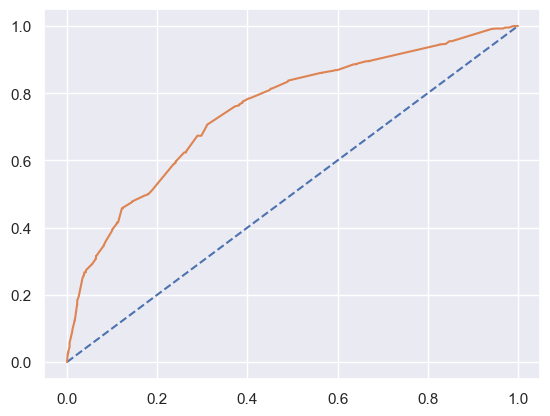

In [197]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = lg.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.750


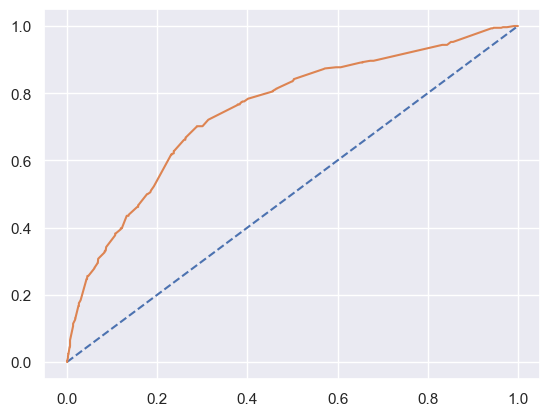

In [199]:
# creating ROC curve and getting AUC score for test data set
# predict probabilities
probs = lg.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [201]:
from sklearn.model_selection import cross_val_score
print("cross validation scroes for traning dataset")
scores_lg_train = cross_val_score(lg, X_train, y_train, cv=10)
scores_lg_train

cross validation scroes for traning dataset


array([0.83269962, 0.8365019 , 0.84771574, 0.84390863, 0.84137056,
       0.83756345, 0.84010152, 0.83121827, 0.83883249, 0.83629442])

In [203]:
print("cross calidation scores for testing dataset")
scores_lg_test = cross_val_score(lg, X_test, y_test, cv=10)
scores_lg_test

cross calidation scores for testing dataset


array([0.82248521, 0.84023669, 0.84023669, 0.82840237, 0.84911243,
       0.84615385, 0.83727811, 0.83727811, 0.83976261, 0.84272997])

# HYPERPARAMETER TUNING

In [206]:
# loading GridSearchCV and creating dataframe for parameters
from sklearn.model_selection import GridSearchCV
param_grid = {
    'solver': ['lbfgs','newton-cg', 'liblinear', 'sag', 'saga'],
    'penalty': ['l1','l2','none'],
    'tol':[0.0001,0.00001]
}

grid_search = GridSearchCV(estimator = lg, param_grid = param_grid, cv = 10, n_jobs=-1,scoring='f1')

In [208]:
# fitting grid search into traing dataset
grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(random_state=1), n_jobs=-1,
             param_grid={'penalty': ['l1', 'l2', 'none'],
                         'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag',
                                    'saga'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1')

In [210]:
# getting best parameters used out of all the combinations given in grid search
grid_search.best_params_

{'penalty': 'l2', 'solver': 'lbfgs', 'tol': 0.0001}

In [212]:
# getting best estimators
best_grid = grid_search.best_estimator_

In [214]:
# predicting training and testing dataset
ytrain_predict_lgcv = best_grid.predict(X_train)
ytest_predict_lgcv = best_grid.predict(X_test)

In [216]:
#Accuracy - Training Data
print("Accuracy of training dataset after gridsearchCV:",best_grid.score(X_train, y_train))

Accuracy of training dataset after gridsearchCV: 0.8382390256280132


In [218]:
#Accuracy - testing Data
print("Accuracy of testing dataset after gridsearchCV:",best_grid.score(X_test, y_test))

Accuracy of testing dataset after gridsearchCV: 0.8377738306690349


In [220]:
# getting classification report for train data set
print("Classification report for train dataset")
print(classification_report(y_train, ytrain_predict_lgcv))

Classification report for train dataset
              precision    recall  f1-score   support

         0.0       0.85      0.98      0.91      6556
         1.0       0.59      0.12      0.21      1326

    accuracy                           0.84      7882
   macro avg       0.72      0.55      0.56      7882
weighted avg       0.80      0.84      0.79      7882



In [222]:
# getting classification report for test data set
print("Classification report for test dataset")
print(classification_report(y_test, ytest_predict_lgcv))

Classification report for test dataset
              precision    recall  f1-score   support

         0.0       0.85      0.98      0.91      2808
         1.0       0.59      0.13      0.21       570

    accuracy                           0.84      3378
   macro avg       0.72      0.56      0.56      3378
weighted avg       0.80      0.84      0.79      3378



In [224]:
# confusion matrix of train dataset
print("confusion matrix for train dataset")
confusion_matrix(y_train, ytrain_predict_lgcv)

confusion matrix for train dataset


array([[6442,  114],
       [1161,  165]], dtype=int64)

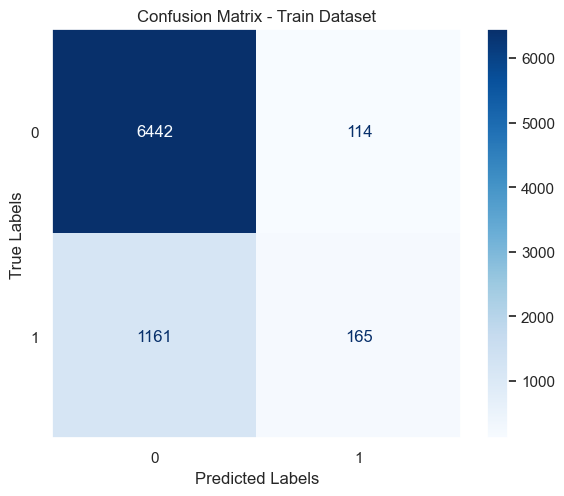

In [228]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

# Generate confusion matrix
cm = confusion_matrix(y_train, ytrain_predict_lgcv)

# Create display object
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

# Plot with better formatting
fig, ax = plt.subplots(figsize=(6, 5))  # Adjust size as needed
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Train Dataset")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()


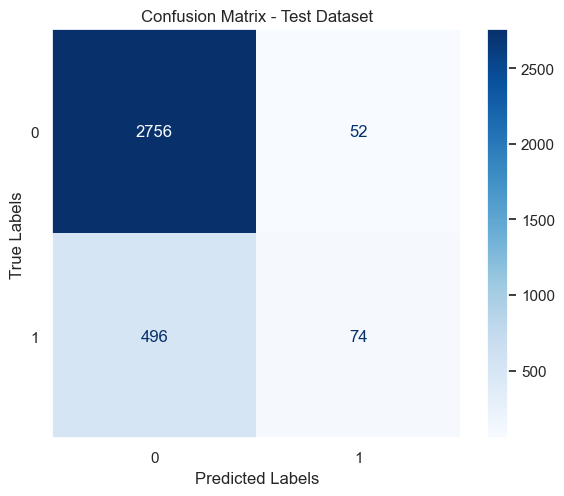

In [232]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

# Compute confusion matrix
cm_test = confusion_matrix(y_test, ytest_predict_lgcv)

# Create display object
disp = ConfusionMatrixDisplay(confusion_matrix=cm_test)

# Plot with good formatting
fig, ax = plt.subplots(figsize=(6, 5))  # Adjust figure size if needed
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Test Dataset")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()


In [234]:
# confusion matrix of train dataset
print("confusion matrix for test dataset")
confusion_matrix(y_test, ytest_predict_lgcv)

confusion matrix for test dataset


array([[2756,   52],
       [ 496,   74]], dtype=int64)

AUC score and ROC curve for training dataset
AUC: 0.750


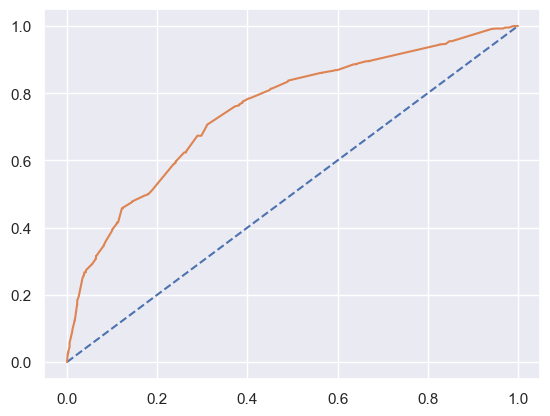

In [238]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = best_grid.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.749


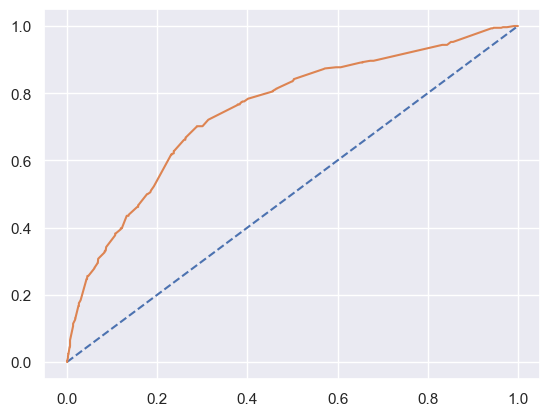

In [242]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = best_grid.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [244]:
print("cross validation score for training dataset")
scores_lgcv_train = cross_val_score(best_grid, X_train, y_train, cv=10)
scores_lgcv_train

cross validation score for training dataset


array([0.83269962, 0.8365019 , 0.84771574, 0.84390863, 0.84137056,
       0.83756345, 0.84010152, 0.83121827, 0.83883249, 0.83629442])

In [246]:
print("cross calidation score for testing dataset")
scores_lgcv_test = cross_val_score(best_grid, X_test, y_test, cv=10)
scores_lgcv_test

cross calidation score for testing dataset


array([0.82248521, 0.84023669, 0.84023669, 0.82840237, 0.84911243,
       0.84615385, 0.83727811, 0.83727811, 0.83976261, 0.84272997])

## Building Logistic regression model using SMOTE

In [249]:
from imblearn.over_sampling import SMOTE 
from collections import Counter

In [251]:
#fitting model into training dataset
lg.fit(X_train_res, y_train_res)

LogisticRegression(random_state=1)

In [253]:
# predict on train and test data set with balanced dataset
ytrain_predict_lgsm = lg.predict(X_train_res) # can compare with y_train
ytest_predict_lgsm = lg.predict(X_test) # can compare with y_test

In [255]:

#Accuracy - Training Data with balanced dataset
print("Accuracy of training dataset:",lg.score(X_train_res, y_train_res))

Accuracy of training dataset: 0.6908175716900549


In [257]:
#Accuracy - testing Data
print("Accuracy of testing dataset:",lg.score(X_test, y_test))

Accuracy of testing dataset: 0.6524570751924216


In [259]:
# getting classification report for train data set with balanced dataset
print("Classification report for train dataset")
print(classification_report(y_train_res, ytrain_predict_lgsm))

Classification report for train dataset
              precision    recall  f1-score   support

         0.0       0.71      0.64      0.67      6556
         1.0       0.67      0.74      0.71      6556

    accuracy                           0.69     13112
   macro avg       0.69      0.69      0.69     13112
weighted avg       0.69      0.69      0.69     13112



In [261]:
# getting classification report for train data set
print("Classification report for test dataset")
print(classification_report(y_test, ytest_predict_lgsm))

Classification report for test dataset
              precision    recall  f1-score   support

         0.0       0.92      0.63      0.75      2808
         1.0       0.29      0.75      0.42       570

    accuracy                           0.65      3378
   macro avg       0.61      0.69      0.59      3378
weighted avg       0.82      0.65      0.70      3378



In [263]:
# confusion matrix for train dataset
print("Confusion matrix for train dataset")
confusion_matrix(y_train_res, ytrain_predict_lgsm)

Confusion matrix for train dataset


array([[4201, 2355],
       [1699, 4857]], dtype=int64)

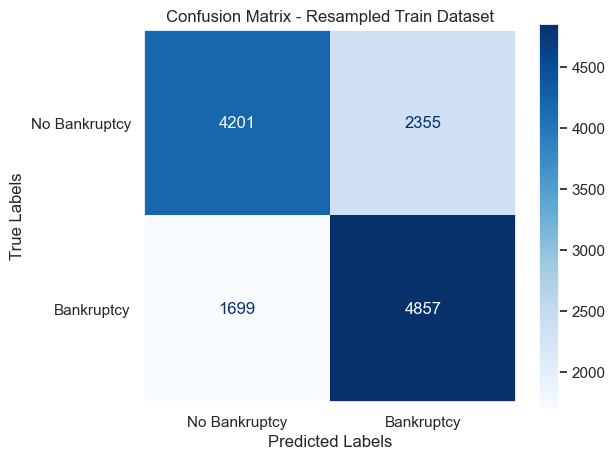

In [265]:
# Generate confusion matrix
cm_train_res = confusion_matrix(y_train_res, ytrain_predict_lgsm)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_train_res,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

# Plot with styling
fig, ax = plt.subplots(figsize=(6, 5))  # Adjust as needed
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Resampled Train Dataset")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)

In [269]:
# confusion matrix for test dataset
print("Confusion matrix for test dataset")
confusion_matrix(y_test, ytest_predict_lgsm)

Confusion matrix for test dataset


array([[1779, 1029],
       [ 145,  425]], dtype=int64)

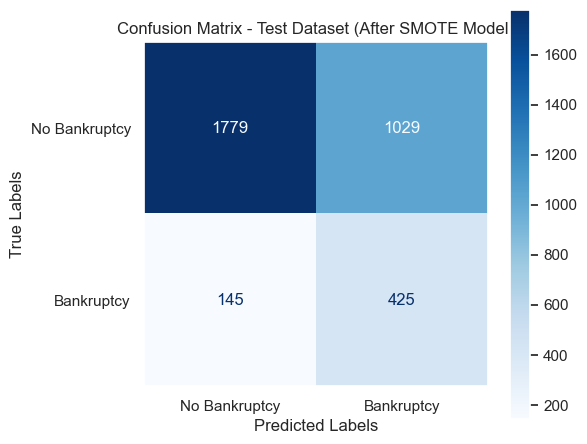

In [267]:
# Compute confusion matrix
cm_test = confusion_matrix(y_test, ytest_predict_lgsm)

# Create display object with class labels (optional)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_test,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

# Plot with improved aesthetics
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Test Dataset (After SMOTE Model)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

AUC score and ROC curve for training dataset
AUC: 0.749


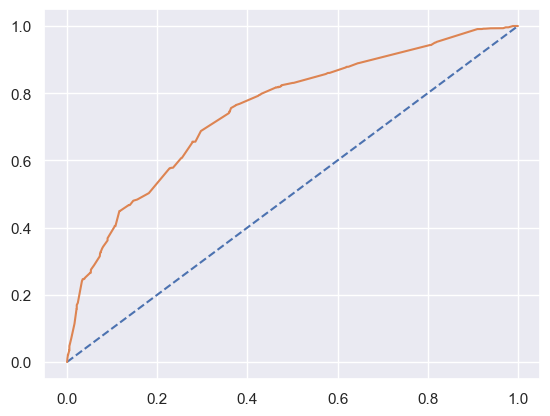

In [273]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = lg.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.746


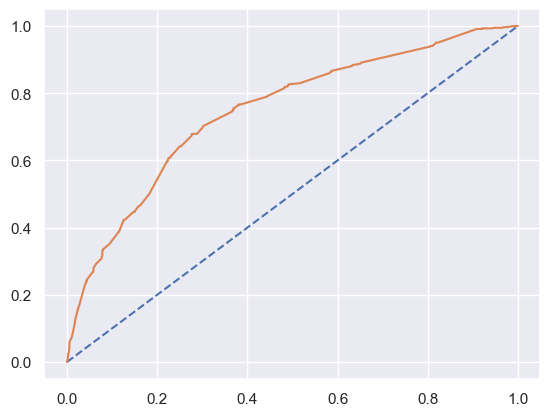

In [275]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = lg.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [277]:
print("cross validation score for balanced training dataset")
scores_lgsm_train = cross_val_score(lg, X_train_res, y_train_res, cv=10)
scores_lgsm_train

cross validation score for balanced training dataset


array([0.67911585, 0.68368902, 0.6819222 , 0.70022883, 0.68726163,
       0.71777269, 0.67658276, 0.68421053, 0.69870328, 0.70022883])

In [279]:
print("cross validation score for testing dataset")
scores_lgsm_test = cross_val_score(lg, X_test, y_test, cv=10)
scores_lgsm_test

cross validation score for testing dataset


array([0.82248521, 0.84023669, 0.84023669, 0.82840237, 0.84911243,
       0.84615385, 0.83727811, 0.83727811, 0.83976261, 0.84272997])

## Building Linear Discriminant Analysis Model (LDA)

In [284]:
#building Linear Discriminant Analysis (LDA)
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [286]:
# fitting LDA model into training dataset
lda = LinearDiscriminantAnalysis()
lda.fit(X_train,y_train)
lda

LinearDiscriminantAnalysis()

In [288]:
# Training Data Class Prediction
ytrain_predict_lda = lda.predict(X_train)

# Test Data Class Prediction
ytest_predict_lda = lda.predict(X_test)

In [290]:
#Accuracy - Training dataset
print("Accuracy score of training dataset:",lda.score(X_train, y_train))

Accuracy score of training dataset: 0.8439482364882009


In [292]:
# Accuracy - Test Data
print("Accuracy score of testing dataset:",lda.score(X_test, y_test))

Accuracy score of testing dataset: 0.8377738306690349


In [294]:
print("Confusion matrix of training dataset")
confusion_matrix(y_train, ytrain_predict_lda)

Confusion matrix of training dataset


array([[6393,  163],
       [1067,  259]], dtype=int64)

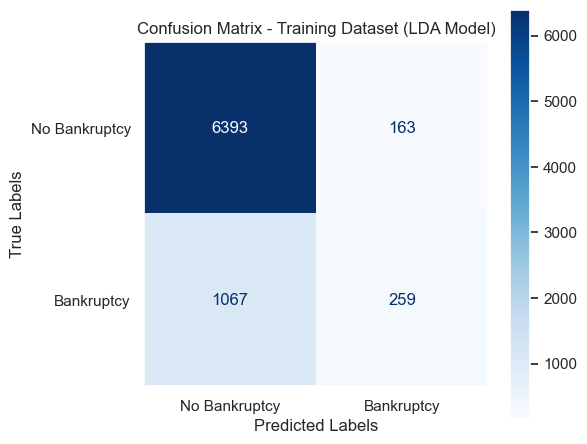

In [296]:
# Generate the confusion matrix
cm_lda_train = confusion_matrix(y_train, ytrain_predict_lda)

# Create and plot display
disp = ConfusionMatrixDisplay(confusion_matrix=cm_lda_train,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Training Dataset (LDA Model)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

In [298]:
print("Confusion matrix of testing dataset")
confusion_matrix(y_test, ytest_predict_lda)

Confusion matrix of testing dataset


array([[2727,   81],
       [ 467,  103]], dtype=int64)

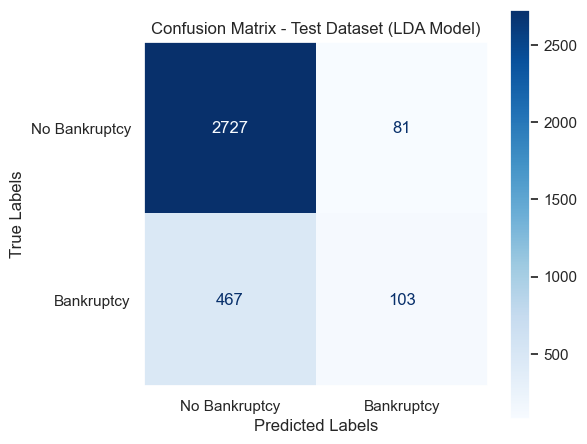

In [300]:
# Generate the confusion matrix
cm_lda_test = confusion_matrix(y_test, ytest_predict_lda)

# Create and display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_lda_test,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Test Dataset (LDA Model)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

In [302]:
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay

In [304]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train,ytrain_predict_lda),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test,ytest_predict_lda),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

         0.0       0.86      0.98      0.91      6556
         1.0       0.61      0.20      0.30      1326

    accuracy                           0.84      7882
   macro avg       0.74      0.59      0.60      7882
weighted avg       0.82      0.84      0.81      7882
 

Classification Report of the test data:

               precision    recall  f1-score   support

         0.0       0.85      0.97      0.91      2808
         1.0       0.56      0.18      0.27       570

    accuracy                           0.84      3378
   macro avg       0.71      0.58      0.59      3378
weighted avg       0.80      0.84      0.80      3378
 



AUC score and ROC curve for training dataset
AUC: 0.746


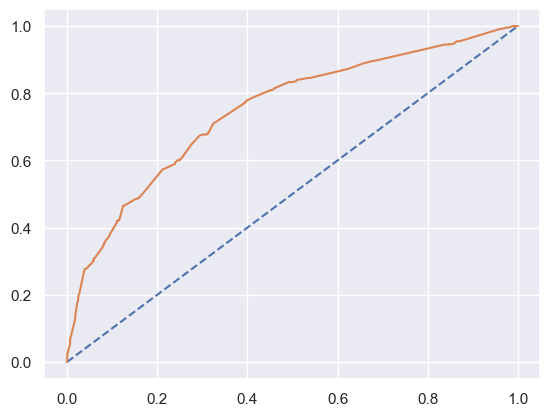

In [306]:
#creating ROC curve and getting AUC score for train data set
#predict probabilities
probs1 = lda.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs1 = probs1[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
train_auc1 = roc_auc_score(y_train, probs1)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr1, train_tpr1, train_thresholds1 = roc_curve(y_train, probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr1, train_tpr1);

AUC score and ROC curve for testing dataset
AUC: 0.746


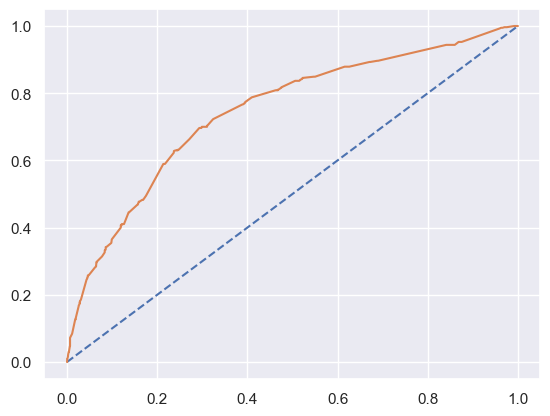

In [308]:
# creating ROC curve and getting AUC score for train data set
# predict probabilities
probs2 = lda.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs2 = probs2[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
test_auc = roc_auc_score(y_test, probs2)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr2, test_tpr2, test_thresholds2 = roc_curve(y_test, probs2)
plt.plot([0, 1], [0, 1], linestyle='--')
#plot the roc curve for the model
plt.plot(test_fpr2, test_tpr2);

In [310]:
print("cross validation score for training dataset")
scores_lda_train = cross_val_score(lda, X_train, y_train, cv=10)
scores_lda_train

cross validation score for training dataset


array([0.83269962, 0.84157161, 0.85279188, 0.84771574, 0.84010152,
       0.84390863, 0.84137056, 0.84137056, 0.84771574, 0.84263959])

In [312]:
print("cross validation score for testing dataset")
scores_lda_test = cross_val_score(lda, X_test, y_test, cv=10)
scores_lda_test

cross validation score for testing dataset


array([0.81656805, 0.82840237, 0.83727811, 0.82840237, 0.85207101,
       0.83727811, 0.83727811, 0.85207101, 0.83976261, 0.83086053])

## Building LDA model using GridSearchCV

In [315]:
# creating dataframe for GridSearchCV
from sklearn.model_selection import GridSearchCV
param_grid = {
    'solver': ['svd', 'lsqr', 'eigen'],
    'tol' : [0.0001,0.0002,0.0003],
    'shrinkage' : ['auto', 'float', 'None'],
    
}

grid_search = GridSearchCV(estimator = lda, param_grid = param_grid, cv = 10, n_jobs=-1,scoring='f1')

In [317]:
# fitting model into training dataset
grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=LinearDiscriminantAnalysis(), n_jobs=-1,
             param_grid={'shrinkage': ['auto', 'float', 'None'],
                         'solver': ['svd', 'lsqr', 'eigen'],
                         'tol': [0.0001, 0.0002, 0.0003]},
             scoring='f1')

In [319]:
# getting best parameters used out of all the combinations given in grid search
grid_search.best_params_

{'shrinkage': 'auto', 'solver': 'lsqr', 'tol': 0.0001}

In [321]:
# getting best estimators
best_grid = grid_search.best_estimator_

In [323]:
# predicting training and testing dataset
ytrain_predict_ldacv = best_grid.predict(X_train)
ytest_predict_ldacv = best_grid.predict(X_test)

In [325]:

#Accuracy - Training Data
print("Accuracy of training dataset after gridsearchCV:",best_grid.score(X_train, y_train))

Accuracy of training dataset after gridsearchCV: 0.8454706927175843


In [327]:
#Accuracy - testing Data
print("Accuracy of testing dataset after gridsearchCV:",best_grid.score(X_test, y_test))

Accuracy of testing dataset after gridsearchCV: 0.8362936648904677


In [329]:
# getting classification report for train data set
print("Classification report for train dataset")
print(classification_report(y_train, ytrain_predict_ldacv))

Classification report for train dataset
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91      6556
         1.0       0.59      0.27      0.37      1326

    accuracy                           0.85      7882
   macro avg       0.73      0.62      0.64      7882
weighted avg       0.82      0.85      0.82      7882



In [331]:
# getting classification report for train data set
print("Classification report for test dataset")
print(classification_report(y_test, ytest_predict_ldacv))

Classification report for test dataset
              precision    recall  f1-score   support

         0.0       0.86      0.96      0.91      2808
         1.0       0.53      0.25      0.34       570

    accuracy                           0.84      3378
   macro avg       0.70      0.60      0.62      3378
weighted avg       0.81      0.84      0.81      3378



In [333]:
# confusion matrix for training data set
print("confusuon matrix for training dataset")
confusion_matrix(y_train, ytrain_predict_ldacv)

confusuon matrix for training dataset


array([[6307,  249],
       [ 969,  357]], dtype=int64)

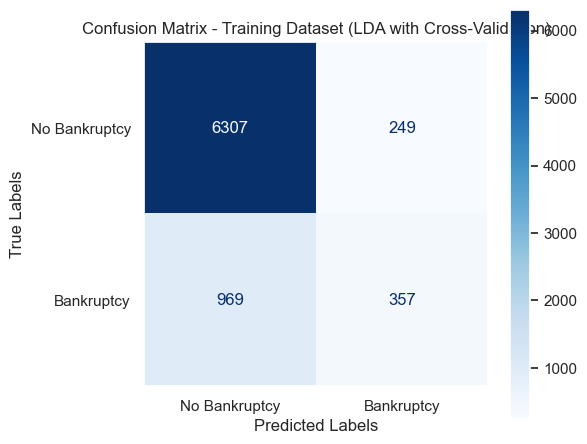

In [335]:
# Generate the confusion matrix
cm_ldacv_train = confusion_matrix(y_train, ytrain_predict_ldacv)

# Display it nicely
disp = ConfusionMatrixDisplay(confusion_matrix=cm_ldacv_train,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Training Dataset (LDA with Cross-Validation)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

In [337]:
# confusion matrix for testing data set
print("confusuon matrix for testing dataset")
confusion_matrix(y_test, ytest_predict_ldacv)

confusuon matrix for testing dataset


array([[2682,  126],
       [ 427,  143]], dtype=int64)

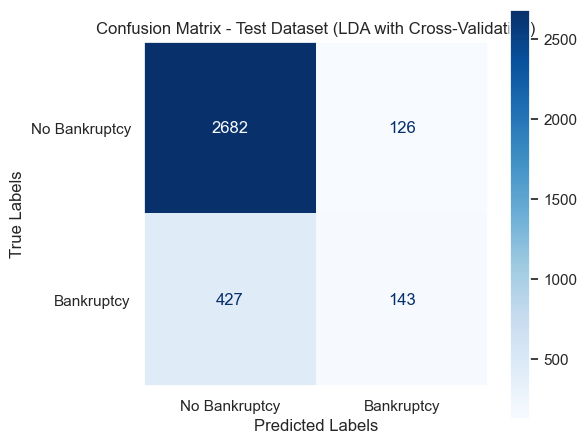

In [339]:
# Compute confusion matrix
cm_ldacv_test = confusion_matrix(y_test, ytest_predict_ldacv)

# Create and display the matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_ldacv_test,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

fig, ax = plt.subplots(figsize=(6, 5))  # Adjust figure size as needed
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Test Dataset (LDA with Cross-Validation)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

AUC score and ROC curve for training dataset
AUC: 0.746


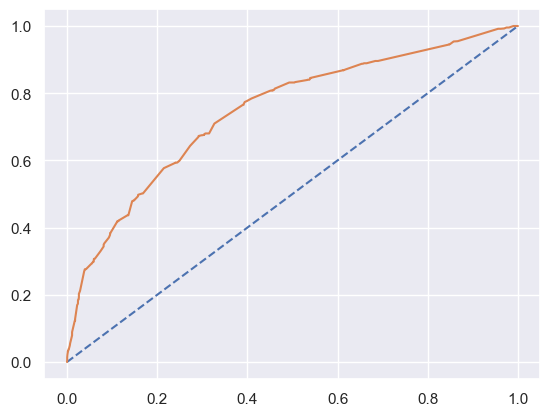

In [341]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = best_grid.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.745


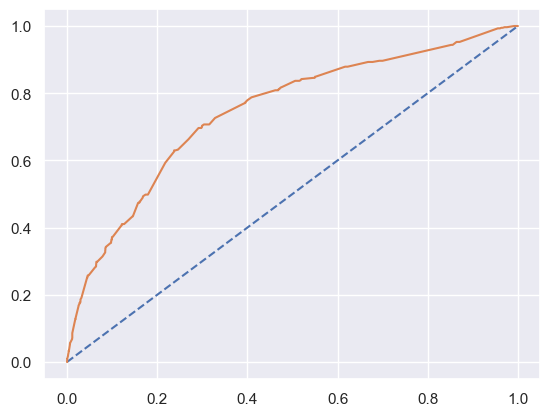

In [345]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = best_grid.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [347]:
print("cross validation scores for training dataset")
scores_ldacv_train = cross_val_score(best_grid, X_train, y_train, cv=10)
scores_ldacv_train

cross validation scores for training dataset


array([0.83396705, 0.83776933, 0.85786802, 0.85152284, 0.83756345,
       0.85152284, 0.84517766, 0.84137056, 0.85152284, 0.84517766])

In [349]:
print("cross validation scores from testing dataset")
scores_ldacv_test = cross_val_score(lda, X_test, y_test, cv=10)
scores_ldacv_test

cross validation scores from testing dataset


array([0.81656805, 0.82840237, 0.83727811, 0.82840237, 0.85207101,
       0.83727811, 0.83727811, 0.85207101, 0.83976261, 0.83086053])

## Building LDA model using SMOTE

In [352]:
#fitting model into training dataset
lda.fit(X_train_res, y_train_res)

LinearDiscriminantAnalysis()

In [354]:
# predict on train and test data set with balanced dataset
ytrain_predict_ldasm = lda.predict(X_train_res) # can compare with y_train
ytest_predict_ldasm = lda.predict(X_test) # can compare with y_test

In [356]:
#Accuracy - Training Data with balanced dataset
print("Accuracy of training dataset:",lda.score(X_train_res, y_train_res))

Accuracy of training dataset: 0.6957748627211714


In [358]:
#Accuracy - testing Data
print("Accuracy of testing dataset:",lda.score(X_test, y_test))

Accuracy of testing dataset: 0.6992303137951451


In [360]:
# getting classification report for train data set with balanced dataset
print("Classification report for train dataset")
print(classification_report(y_train_res, ytrain_predict_ldasm))

Classification report for train dataset
              precision    recall  f1-score   support

         0.0       0.69      0.70      0.70      6556
         1.0       0.70      0.69      0.69      6556

    accuracy                           0.70     13112
   macro avg       0.70      0.70      0.70     13112
weighted avg       0.70      0.70      0.70     13112



In [362]:
# getting classification report for train data set
print("Classification report for test dataset")
print(classification_report(y_test, ytest_predict_ldasm))

Classification report for test dataset
              precision    recall  f1-score   support

         0.0       0.92      0.70      0.79      2808
         1.0       0.32      0.71      0.44       570

    accuracy                           0.70      3378
   macro avg       0.62      0.70      0.62      3378
weighted avg       0.82      0.70      0.73      3378



In [366]:
# confusion matrix for train dataset
print("confusion matrix for training dataset")
confusion_matrix(y_train_res, ytrain_predict_ldasm)

confusion matrix for training dataset


array([[4599, 1957],
       [2032, 4524]], dtype=int64)

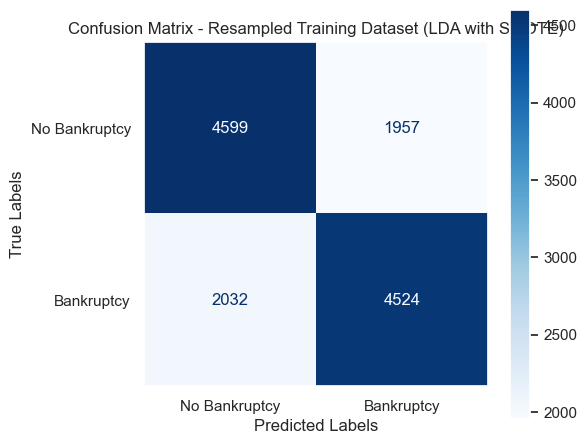

In [364]:
# Generate confusion matrix
cm_ldasm_train = confusion_matrix(y_train_res, ytrain_predict_ldasm)

# Display with class labels
disp = ConfusionMatrixDisplay(confusion_matrix=cm_ldasm_train,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

# Plot with better visuals
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Resampled Training Dataset (LDA with SMOTE)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

In [368]:
# confusion matrix for test dataset
print("confusion matrix for testing dataset")
confusion_matrix(y_test, ytest_predict_ldasm)

confusion matrix for testing dataset


array([[1959,  849],
       [ 167,  403]], dtype=int64)

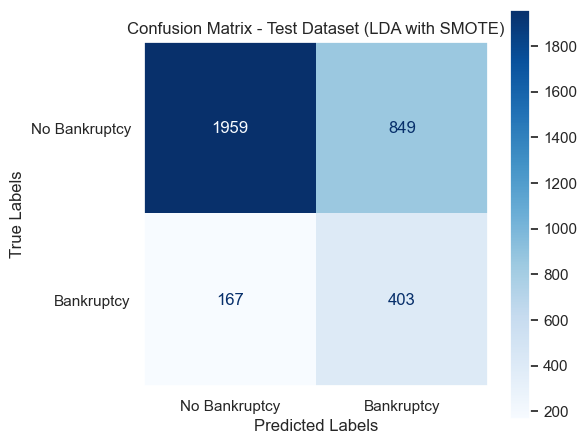

In [370]:
# Compute confusion matrix
cm_ldasm_test = confusion_matrix(y_test, ytest_predict_ldasm)

# Create display object with class labels
disp = ConfusionMatrixDisplay(confusion_matrix=cm_ldasm_test,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

# Plot
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Test Dataset (LDA with SMOTE)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

AUC score and ROC curve for training dataset
AUC: 0.749


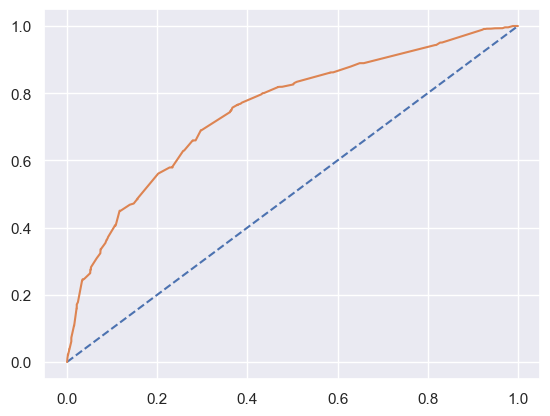

In [372]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = lda.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.746


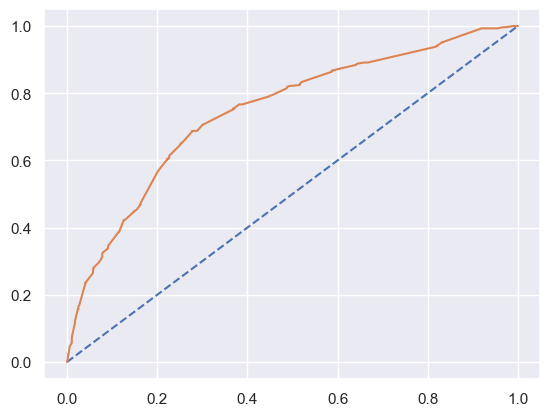

In [374]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = lda.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [376]:
print("cross validation scores for training dataset")
scores_ldasm_train = cross_val_score(lda, X_train_res, y_train_res, cv=10)
scores_ldasm_train

cross validation scores for training dataset


array([0.66615854, 0.6882622 , 0.67353166, 0.70938215, 0.67963387,
       0.71853547, 0.67963387, 0.69336384, 0.6979405 , 0.69565217])

In [378]:
print("cross validation scores for testing dataset")
scores_ldasm_test = cross_val_score(lda, X_test, y_test, cv=10)
scores_ldasm_test

cross validation scores for testing dataset


array([0.81656805, 0.82840237, 0.83727811, 0.82840237, 0.85207101,
       0.83727811, 0.83727811, 0.85207101, 0.83976261, 0.83086053])

# KNN Model

In [381]:
# building KNN model using the default hyper-parameter
from sklearn.neighbors import KNeighborsClassifier

knn=KNeighborsClassifier()
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [383]:
## Performance Matrix on train data set
ytrain_predict_knn = knn.predict(X_train)
print("Accracy of training dataset:", knn.score(X_train, y_train))

Accracy of training dataset: 0.8360822126363867


In [385]:
print("confusion matrix of training dataset")
print(metrics.confusion_matrix(y_train, ytrain_predict_knn))

confusion matrix of training dataset
[[6182  374]
 [ 918  408]]


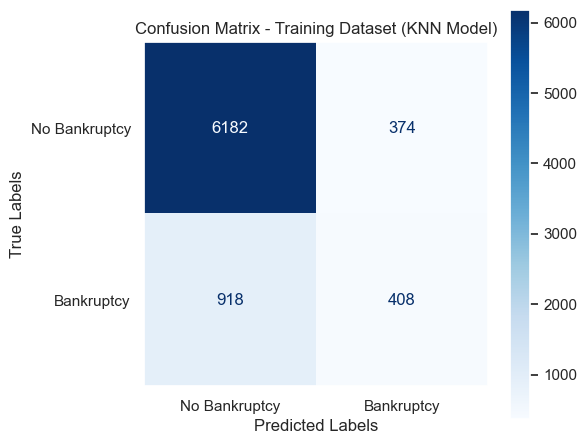

In [387]:
# Generate the confusion matrix
cm_knn_train = confusion_matrix(y_train, ytrain_predict_knn)

# Create display
disp = ConfusionMatrixDisplay(confusion_matrix=cm_knn_train,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

# Plot
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Training Dataset (KNN Model)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

In [389]:
print("classificatoin report of training dataset")
print (classification_report(y_train, ytrain_predict_knn))

classificatoin report of training dataset
              precision    recall  f1-score   support

         0.0       0.87      0.94      0.91      6556
         1.0       0.52      0.31      0.39      1326

    accuracy                           0.84      7882
   macro avg       0.70      0.63      0.65      7882
weighted avg       0.81      0.84      0.82      7882



In [391]:
# Performance Matrix on test data set
ytest_predict_knn = knn.predict(X_test)
print("accuracy for testing dataset", knn.score(X_test, y_test))

accuracy for testing dataset 0.8312611012433393


In [393]:

print("confusion matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_knn))

confusion matrix for testing dataset
[[2633  175]
 [ 395  175]]


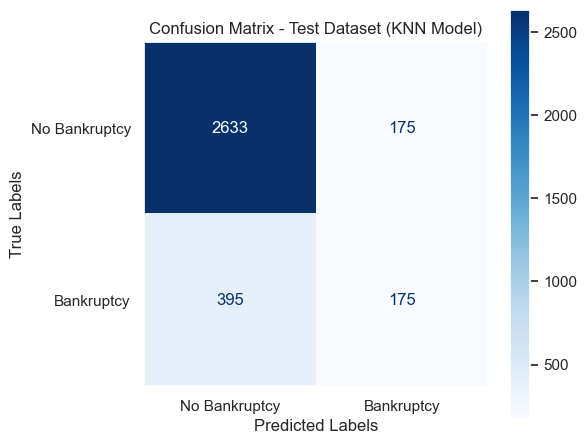

In [395]:
# Compute confusion matrix
cm_knn_test = confusion_matrix(y_test, ytest_predict_knn)

# Create display with class labels
disp = ConfusionMatrixDisplay(confusion_matrix=cm_knn_test,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

# Plot
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Test Dataset (KNN Model)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

In [397]:
print("classsification report for testing dataset")
print(metrics.classification_report(y_test, ytest_predict_knn))

classsification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.87      0.94      0.90      2808
         1.0       0.50      0.31      0.38       570

    accuracy                           0.83      3378
   macro avg       0.68      0.62      0.64      3378
weighted avg       0.81      0.83      0.81      3378



AUC score and ROC curve for training dataset
AUC: 0.720


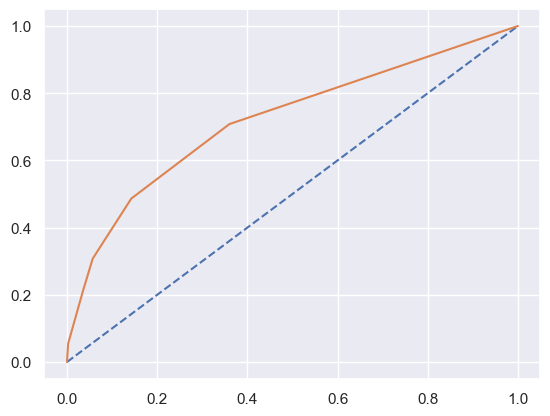

In [399]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = knn.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.707


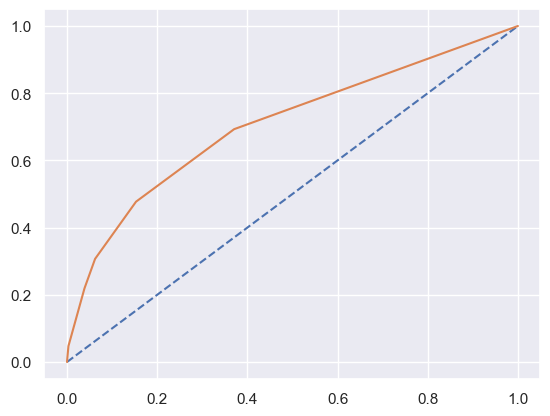

In [403]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = knn.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [405]:
print("cross validation scores for train dataset")
scores_knn_train = cross_val_score(knn, X_train, y_train, cv=10)
scores_knn_train

cross validation scores for train dataset


array([0.82509506, 0.82636248, 0.8286802 , 0.8248731 , 0.81979695,
       0.82994924, 0.84771574, 0.83629442, 0.84390863, 0.82741117])

In [407]:
print("cross validation scores for test dataset")
scores_knn_test = cross_val_score(knn, X_test, y_test, cv=10)
scores_knn_test

cross validation scores for test dataset


array([0.81952663, 0.83727811, 0.82248521, 0.79585799, 0.80473373,
       0.83431953, 0.80473373, 0.79881657, 0.74777448, 0.84866469])

## Finding the right value for n_neighbor1m

In [412]:
# getting the ideal number of value of "N"
# empty list that will hold accuracy scores
ac_scores = []

# perform accuracy metrics for values from 1,3,5....19
for k in range(1,20,2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    # evaluate test accuracy
    scores = knn.score(X_test, y_test)
    ac_scores.append(scores)

# changing to misclassification error
MCE = [1 - x for x in ac_scores]
MCE

[0.29840142095914746,
 0.17229129662522202,
 0.1687388987566607,
 0.16370633510953225,
 0.16400236826524572,
 0.16548253404381286,
 0.1642984014209592,
 0.15571343990526942,
 0.16341030195381878,
 0.16459443457667255]

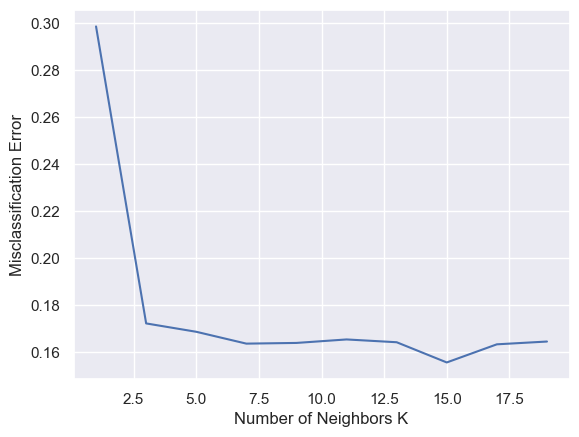

In [890]:
import matplotlib.pyplot as plt
# plot misclassification error vs k
plt.plot(range(1,20,2), MCE)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()

In [892]:
#from sklearn.neighbors import KNeighborsClassifier

knn5=KNeighborsClassifier(n_neighbors=15)
knn5.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=15)

In [908]:
## Performance Matrix on train data set
ytrain_predict_knn5 = knn5.predict(X_train)
print("Accuracy of training dataset:", knn5.score(X_train, y_train))

Accuracy of training dataset: 0.8553666582085765


In [910]:
## Performance Matrix on train data set
ytrain_predict_knn5 = knn5.predict(X_test)
print("Accuracy of training dataset:", knn5.score(X_test, y_test))

Accuracy of training dataset: 0.8496151568975725


In [894]:

# Performance Matrix on train data set
ytrain_predict_knn5 = knn5.predict(X_train)
print("accuracy for training dataset:",knn5.score(X_train, y_train))

print("confusion matrix for training dataset")
print(confusion_matrix(y_train, ytrain_predict_knn5))

print("classification report for training dataset")
print(classification_report(y_train, ytrain_predict_knn5))

accuracy for training dataset: 0.8553666582085765
confusion matrix for training dataset
[[6457   99]
 [1041  285]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.86      0.98      0.92      6556
         1.0       0.74      0.21      0.33      1326

    accuracy                           0.86      7882
   macro avg       0.80      0.60      0.63      7882
weighted avg       0.84      0.86      0.82      7882



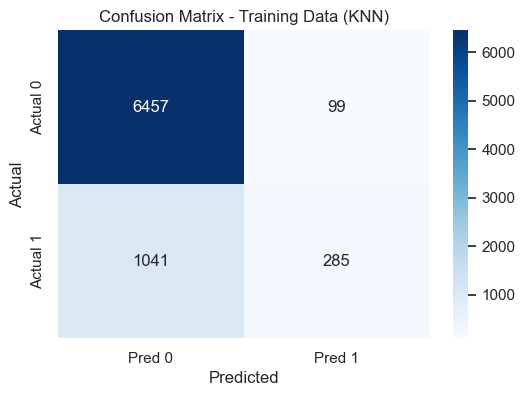

Accuracy for training dataset: 0.8553666582085765

Classification report:
              precision    recall  f1-score   support

         0.0       0.86      0.98      0.92      6556
         1.0       0.74      0.21      0.33      1326

    accuracy                           0.86      7882
   macro avg       0.80      0.60      0.63      7882
weighted avg       0.84      0.86      0.82      7882



In [914]:
# Confusion Matrix
cm = confusion_matrix(y_train, ytrain_predict_knn5)

# Plotting
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Training Data (KNN)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Accuracy and Report
print("Accuracy for training dataset:", knn5.score(X_train, y_train))
print("\nClassification report:")
print(classification_report(y_train, ytrain_predict_knn5))

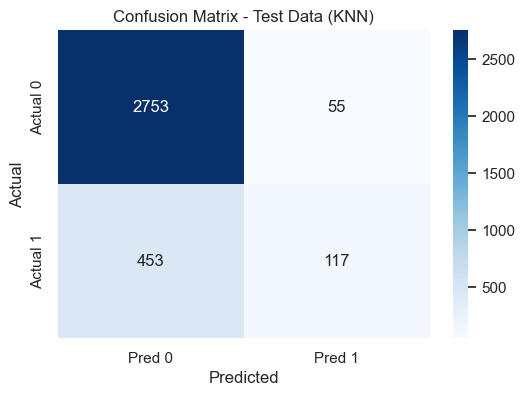

Accuracy score for testing dataset: 0.8496151568975725

Classification report:
              precision    recall  f1-score   support

         0.0       0.86      0.98      0.92      2808
         1.0       0.68      0.21      0.32       570

    accuracy                           0.85      3378
   macro avg       0.77      0.59      0.62      3378
weighted avg       0.83      0.85      0.81      3378



In [918]:
# Confusion matrix
cm_test = confusion_matrix(y_test, ytest_predict_knn5)

# Plotting confusion matrix
plt.figure(figsize=(6,4))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Test Data (KNN)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Accuracy and report
print("Accuracy score for testing dataset:", knn5.score(X_test, y_test))
print("\nClassification report:")
print(classification_report(y_test, ytest_predict_knn5))


In [896]:
# Performance Matrix on test data set
ytest_predict_knn5 = knn5.predict(X_test)
print("accuracy score for testing dataset:",knn5.score(X_test, y_test))

print("confusion matrix for testing dataset")
print(confusion_matrix(y_test, ytest_predict_knn5))

print("classification report for testing dataset")
print(classification_report(y_test, ytest_predict_knn5))

accuracy score for testing dataset: 0.8496151568975725
confusion matrix for testing dataset
[[2753   55]
 [ 453  117]]
classification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.86      0.98      0.92      2808
         1.0       0.68      0.21      0.32       570

    accuracy                           0.85      3378
   macro avg       0.77      0.59      0.62      3378
weighted avg       0.83      0.85      0.81      3378



In [420]:
0.8572697284953058 - 0.8404381290704559

0.016831599424849908

AUC score and ROC curve for training dataset
AUC: 0.799


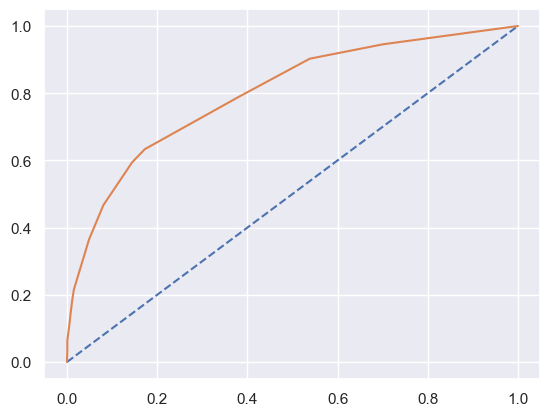

In [920]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = knn5.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.761


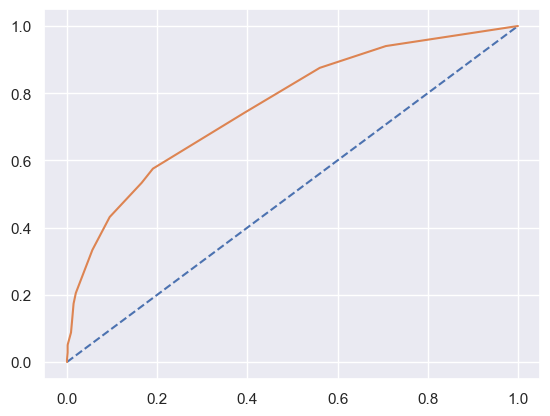

In [922]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = knn5.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [924]:
print("cross validation scores for training dataset")
scores_knn5_train = cross_val_score(knn5, X_train, y_train, cv=10)
scores_knn5_train

cross validation scores for training dataset


array([0.83776933, 0.84664132, 0.84771574, 0.85913706, 0.8464467 ,
       0.85279188, 0.84263959, 0.84263959, 0.85406091, 0.85025381])

In [926]:
print("cross validation scores for testing dataset")
scores_knn5_test = cross_val_score(knn5, X_test, y_test, cv=10)
scores_knn5_test

cross validation scores for testing dataset


array([0.85207101, 0.83136095, 0.82248521, 0.82248521, 0.85207101,
       0.83431953, 0.83727811, 0.82544379, 0.83976261, 0.83976261])

## Building KNN model using GridSearchCV

In [928]:
param_grid = {
    'n_neighbors': [5,7,9],
    'weights' : ['uniform','distance'],
    'metric' : ['euclidean', 'manhattan'],
    'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
    
}

grid_search = GridSearchCV(estimator = knn, param_grid = param_grid, cv = 10, n_jobs=-1,scoring='f1')

In [930]:
# fitting gridsearchCV into training dataset
grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(n_neighbors=19), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [5, 7, 9],
                         'weights': ['uniform', 'distance']},
             scoring='f1')

In [932]:
# getting best parameters used out of all the combinations given in grid search
grid_search.best_params_

{'algorithm': 'ball_tree',
 'metric': 'euclidean',
 'n_neighbors': 9,
 'weights': 'distance'}

In [934]:
# getting best estimators
best_grid = grid_search.best_estimator_

In [936]:
ytrain_predict_knncv = best_grid.predict(X_train)
ytest_predict_knncv = best_grid.predict(X_test)

In [938]:
#Accuracy - Training Data
print("Accuracy of training dataset after gridsearchCV:",best_grid.score(X_train, y_train))

Accuracy of training dataset after gridsearchCV: 0.8572697284953058


In [940]:
#Accuracy - testing Data
print("Accuracy of testing dataset after gridsearchCV:",best_grid.score(X_test, y_test))

Accuracy of testing dataset after gridsearchCV: 0.84251036116045


In [942]:
# getting classification report for train data set
print("Classification report for train dataset")
print(classification_report(y_train, ytrain_predict_knncv))

Classification report for train dataset
              precision    recall  f1-score   support

         0.0       0.88      0.96      0.92      6556
         1.0       0.63      0.37      0.47      1326

    accuracy                           0.86      7882
   macro avg       0.76      0.66      0.69      7882
weighted avg       0.84      0.86      0.84      7882



In [944]:
# getting classification report for train data set
print("Classification report for test dataset")
print(classification_report(y_test, ytest_predict_knncv))

Classification report for test dataset
              precision    recall  f1-score   support

         0.0       0.88      0.94      0.91      2808
         1.0       0.55      0.36      0.43       570

    accuracy                           0.84      3378
   macro avg       0.71      0.65      0.67      3378
weighted avg       0.82      0.84      0.83      3378



In [946]:
# confusion matrix for training data set
print("confusuon matrix for training dataset")
confusion_matrix(y_train, ytrain_predict_knncv)

confusuon matrix for training dataset


array([[6264,  292],
       [ 833,  493]], dtype=int64)

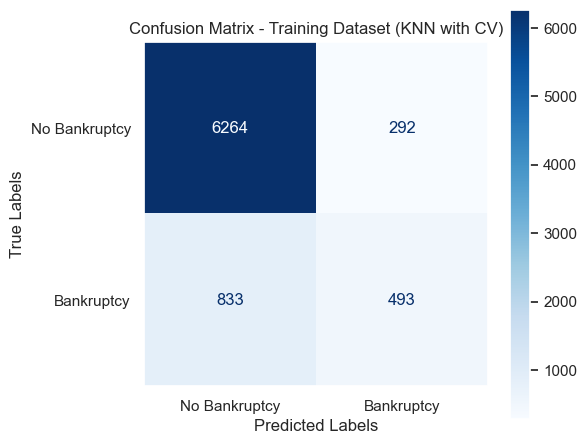

In [948]:
# Compute confusion matrix
cm_knncv_train = confusion_matrix(y_train, ytrain_predict_knncv)

# Display confusion matrix with labels
disp = ConfusionMatrixDisplay(confusion_matrix=cm_knncv_train,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

# Plot it nicely
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Training Dataset (KNN with CV)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

In [950]:
# confusion matrix for testing data set
print("confusuon matrix for testing dataset")
confusion_matrix(y_test, ytest_predict_knncv)

confusuon matrix for testing dataset


array([[2643,  165],
       [ 367,  203]], dtype=int64)

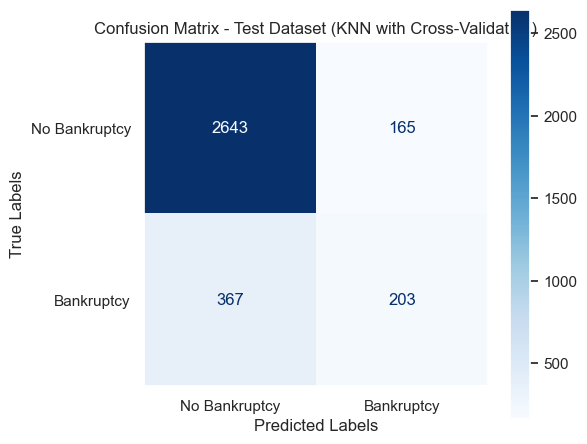

In [952]:
# Compute confusion matrix
cm_knncv_test = confusion_matrix(y_test, ytest_predict_knncv)

# Create display object
disp = ConfusionMatrixDisplay(confusion_matrix=cm_knncv_test,
                              display_labels=["No Bankruptcy", "Bankruptcy"])

# Plot
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(cmap='Blues', ax=ax, values_format='d')

plt.title("Confusion Matrix - Test Dataset (KNN with Cross-Validation)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.grid(False)
plt.tight_layout()
plt.show()

AUC score and ROC curve for training dataset
AUC: 0.809


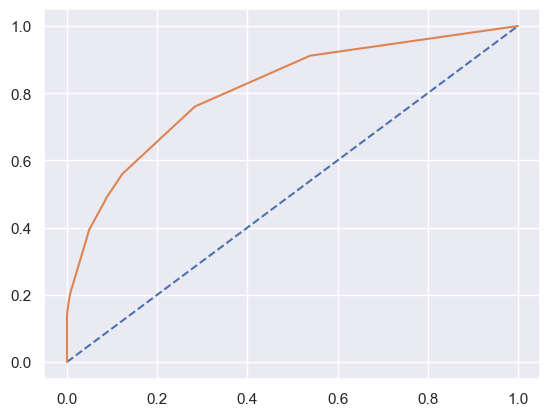

In [954]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = best_grid.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.768


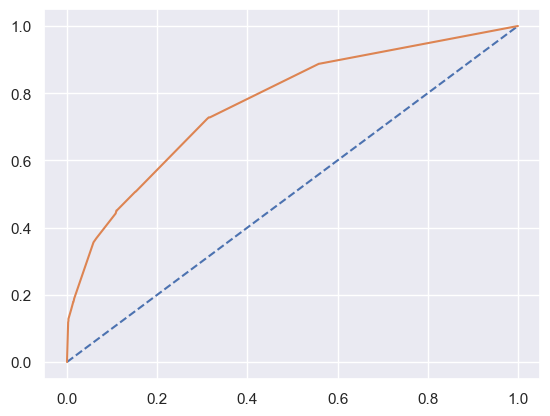

In [955]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
# predict probabilities
probs = best_grid.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [957]:
print("cross validation scores for train dataset")
scores_knncv_train = cross_val_score(best_grid, X_train, y_train, cv=10)
scores_knncv_train

cross validation scores for train dataset


array([0.83523447, 0.85171103, 0.84771574, 0.85279188, 0.84137056,
       0.85406091, 0.8464467 , 0.83629442, 0.86294416, 0.84010152])

In [959]:
print("cross validation scores for test dataset")
scores_knncv_test = cross_val_score(best_grid, X_test, y_test, cv=10)
scores_knncv_test

cross validation scores for test dataset


array([0.85798817, 0.84615385, 0.81952663, 0.83136095, 0.84615385,
       0.84615385, 0.84319527, 0.83136095, 0.85459941, 0.85756677])

## Building KNN model over balanced dataset using SMOTE

In [965]:
#fitting model into training dataset
knn.fit(X_train_res, y_train_res)

KNeighborsClassifier(n_neighbors=19)

In [967]:
# predict on train and test data set with balanced dataset
ytrain_predict_knnsm = knn.predict(X_train_res) # can compare with y_train
ytest_predict_knnsm = knn.predict(X_test) # can compare with y_test

In [968]:
#Accuracy - Training Data with balanced dataset
print("Accuracy of training dataset:",knn.score(X_train_res, y_train_res))

Accuracy of training dataset: 0.7454240390482001


In [971]:
#Accuracy - testing Data
print("Accuracy of testing dataset:",knn.score(X_test, y_test))

Accuracy of testing dataset: 0.7249851983422143


In [973]:
# getting classification report for train data set with balanced dataset
print("Classification report for train dataset")
print(classification_report(y_train_res, ytrain_predict_knnsm))

Classification report for train dataset
              precision    recall  f1-score   support

         0.0       0.74      0.75      0.75      6556
         1.0       0.75      0.74      0.74      6556

    accuracy                           0.75     13112
   macro avg       0.75      0.75      0.75     13112
weighted avg       0.75      0.75      0.75     13112



In [975]:

# getting classification report for train data set
print("Classification report for test dataset")
print(classification_report(y_test, ytest_predict_knnsm))

Classification report for test dataset
              precision    recall  f1-score   support

         0.0       0.93      0.73      0.81      2808
         1.0       0.35      0.72      0.47       570

    accuracy                           0.72      3378
   macro avg       0.64      0.72      0.64      3378
weighted avg       0.83      0.72      0.76      3378



In [977]:
# confusion matrix for train dataset
print("confusion matrix for training dataset")
confusion_matrix(y_train_res, ytrain_predict_knnsm)

confusion matrix for training dataset


array([[4926, 1630],
       [1708, 4848]], dtype=int64)

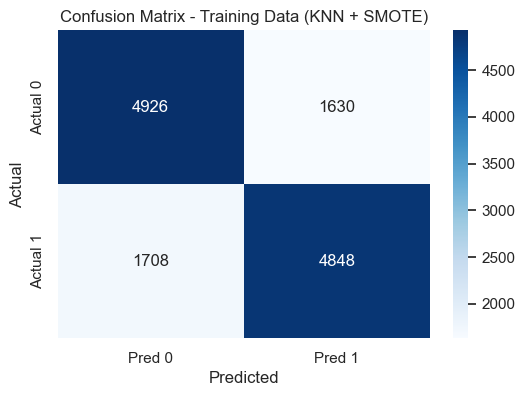

Classification Report for training data (KNN + SMOTE):
              precision    recall  f1-score   support

         0.0       0.74      0.75      0.75      6556
         1.0       0.75      0.74      0.74      6556

    accuracy                           0.75     13112
   macro avg       0.75      0.75      0.75     13112
weighted avg       0.75      0.75      0.75     13112



In [1005]:
cm_train_knnsm = confusion_matrix(y_train_res, ytrain_predict_knnsm)

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_train_knnsm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Training Data (KNN + SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# (Optional) Print classification report
print("Classification Report for training data (KNN + SMOTE):")
print(classification_report(y_train_res, ytrain_predict_knnsm))

In [1007]:
# confusion matrix for test dataset
print("confusion matrix for testing dataset")
confusion_matrix(y_test, ytest_predict_knnsm)

confusion matrix for testing dataset


array([[2039,  769],
       [ 160,  410]], dtype=int64)

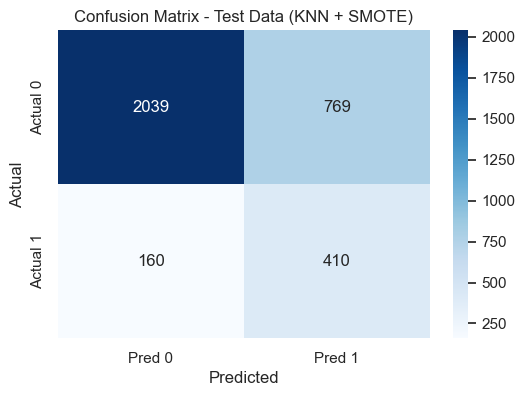

Classification Report for testing data (KNN + SMOTE):
              precision    recall  f1-score   support

         0.0       0.93      0.73      0.81      2808
         1.0       0.35      0.72      0.47       570

    accuracy                           0.72      3378
   macro avg       0.64      0.72      0.64      3378
weighted avg       0.83      0.72      0.76      3378



In [1011]:
# Compute confusion matrix
cm_test_knnsm = confusion_matrix(y_test, ytest_predict_knnsm)

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_test_knnsm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Test Data (KNN + SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Optional: Classification report
print("Classification Report for testing data (KNN + SMOTE):")
print(classification_report(y_test, ytest_predict_knnsm))


AUC score and ROC curve for training dataset
AUC: 0.816


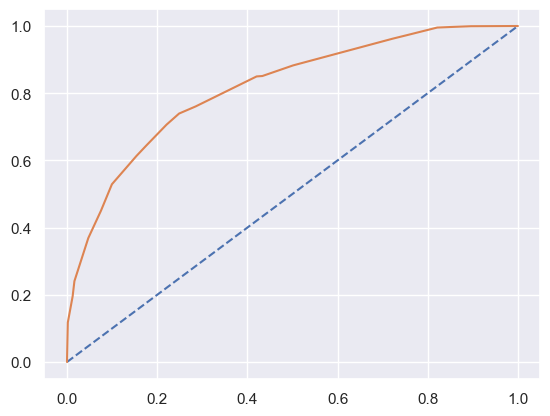

In [1013]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = knn.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.790


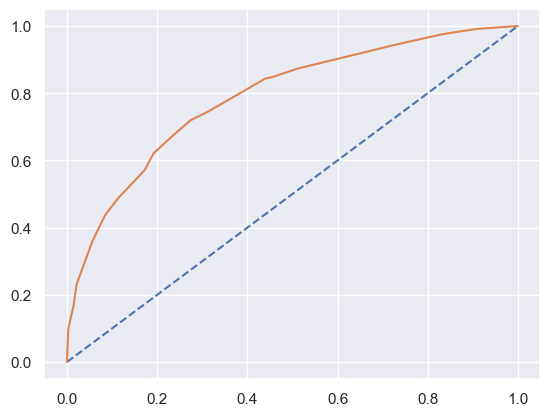

In [1015]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = knn.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [1017]:
print("cross validation scores for train dataset")
scores_knnsm_train = cross_val_score(knn, X_train_res, y_train_res, cv=10)
scores_knnsm_train

cross validation scores for train dataset


array([0.7027439 , 0.72942073, 0.72311213, 0.72921434, 0.72540046,
       0.74141876, 0.70480549, 0.71167048, 0.72692601, 0.71777269])

In [1019]:
print("cross validation scores for test dataset")
scores_knnsm_test = cross_val_score(knn, X_test, y_test, cv=10)
scores_knnsm_test

cross validation scores for test dataset


array([0.85502959, 0.82840237, 0.82248521, 0.83136095, 0.84615385,
       0.83431953, 0.82840237, 0.83136095, 0.8189911 , 0.83086053])

## Building Gaussian Naive Bayes

In [1023]:
#importing libraries to build NB model
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics

In [1025]:
# fitting NB model into training dataset
nb = GaussianNB()
nb.fit(X_train, y_train)

GaussianNB()

In [1031]:
# predicting and checking accoracy on training dataset
ytrain_predict_nb = nb.predict(X_train)
print("Accuracy of training dataset:", nb.score(X_train, y_train))

Accuracy of training dataset: 0.28431870083735095


In [1035]:
# getting confusion matirx and classification report for training dataset
print("Confusion matrix of train dataset")
print(confusion_matrix(y_train, ytrain_predict_nb)) ## confusion_matrix

#print("Classification report of train dataset")
print(classification_report(y_train, ytrain_predict_nb))     ## classification_report

Confusion matrix of train dataset
[[ 996 5560]
 [  81 1245]]
              precision    recall  f1-score   support

         0.0       0.92      0.15      0.26      6556
         1.0       0.18      0.94      0.31      1326

    accuracy                           0.28      7882
   macro avg       0.55      0.55      0.28      7882
weighted avg       0.80      0.28      0.27      7882



Confusion matrix of training dataset:
[[ 996 5560]
 [  81 1245]]

Classification report of training dataset:
              precision    recall  f1-score   support

         0.0       0.92      0.15      0.26      6556
         1.0       0.18      0.94      0.31      1326

    accuracy                           0.28      7882
   macro avg       0.55      0.55      0.28      7882
weighted avg       0.80      0.28      0.27      7882



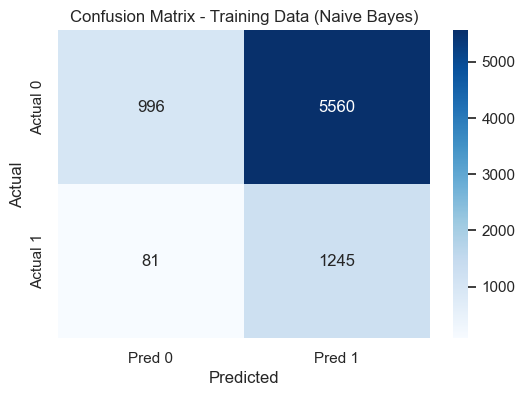

In [1043]:
# Compute confusion matrix
cm_train_nb = confusion_matrix(y_train, ytrain_predict_nb)

# Print confusion matrix
print("Confusion matrix of training dataset:")
print(cm_train_nb)

# Print classification report
print("\nClassification report of training dataset:")
print(classification_report(y_train, ytrain_predict_nb))

# Visualize confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm_train_nb, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Training Data (Naive Bayes)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [1039]:
# predicting and getting accuracy score for testing dataset
ytest_predict_nb = nb.predict(X_test)
print("Accuracy of testing dataset:", nb.score(X_test, y_test))

Accuracy of testing dataset: 0.2921847246891652



Confusion matrix of testing dataset:
[[ 444 2364]
 [  27  543]]

Classification report of testing dataset:
              precision    recall  f1-score   support

         0.0       0.94      0.16      0.27      2808
         1.0       0.19      0.95      0.31       570

    accuracy                           0.29      3378
   macro avg       0.56      0.56      0.29      3378
weighted avg       0.82      0.29      0.28      3378



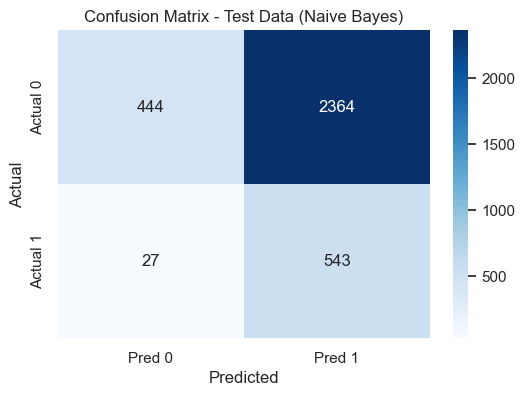

In [1047]:
# Confusion Matrix
cm_test_nb = confusion_matrix(y_test, ytest_predict_nb)
print("\nConfusion matrix of testing dataset:")
print(cm_test_nb)

# Classification Report
print("\nClassification report of testing dataset:")
print(classification_report(y_test, ytest_predict_nb))

# Visualization (Heatmap in Purple)
plt.figure(figsize=(6, 4))
sns.heatmap(cm_test_nb, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Test Data (Naive Bayes)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [505]:
# printing confusuon matix and classification report for testing datatset
print("Confusion matrix of test dataset")
print(confusion_matrix(y_test, ytest_predict_nb))         ## confusion_matrix
print("Classification report of test dataset")
print(classification_report(y_test, ytest_predict_nb))    ## classification_report

Confusion matrix of test dataset
[[ 243 2565]
 [   9  561]]
Classification report of test dataset
              precision    recall  f1-score   support

         0.0       0.96      0.09      0.16      2808
         1.0       0.18      0.98      0.30       570

    accuracy                           0.24      3378
   macro avg       0.57      0.54      0.23      3378
weighted avg       0.83      0.24      0.18      3378



AUC score and ROC curve for training dataset
AUC: 0.726


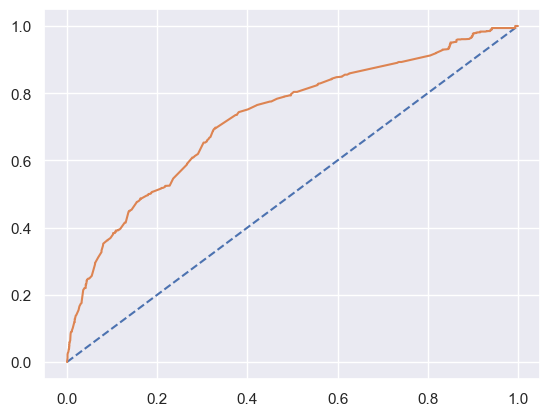

In [1049]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = nb.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.736


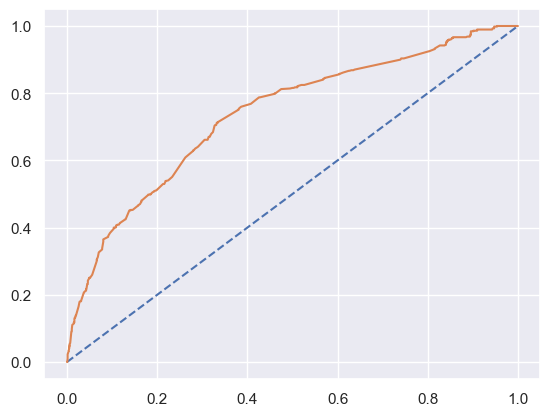

In [1053]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = nb.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [513]:
print("cross validation scores for train dataset")
scores_nb_train = cross_val_score(nb, X_train, y_train, cv=10)
scores_nb_train

cross validation scores for train dataset


array([0.23320659, 0.21926489, 0.23857868, 0.22969543, 0.23096447,
       0.23984772, 0.22335025, 0.23730964, 0.16878173, 0.25126904])

In [515]:
print("cross validation scores for test dataset")
scores_nb_test = cross_val_score(nb, X_test, y_test, cv=10)
scores_nb_test

cross validation scores for test dataset


array([0.23372781, 0.23668639, 0.22781065, 0.26035503, 0.24852071,
       0.23076923, 0.24852071, 0.22781065, 0.23738872, 0.23442136])

## Building Gaussian Naive Bayes over balanced data using SMOTE

In [1055]:
# fitting NB model into balanced training dataset
nb = GaussianNB()
nb.fit(X_train_res, y_train_res)

GaussianNB()

In [1073]:
# predicting and checking accoracy on training dataset
ytrain_predict_nbsm = nb.predict(X_train_res)
print("Accuracy of training dataset:", nb.score(X_train_res, y_train_res))

Accuracy of training dataset: 0.5617754728492984


In [1059]:
# getting confusion matirx and classification report for training dataset
print("Confusion matrix of train dataset")
print(confusion_matrix(y_train_res, ytrain_predict_nbsm)) ## confusion_matrix

#print("Classification report of train dataset")
print(classification_report(y_train_res, ytrain_predict_nbsm))     ## classification_report

Confusion matrix of train dataset
[[1163 5393]
 [ 353 6203]]
              precision    recall  f1-score   support

         0.0       0.77      0.18      0.29      6556
         1.0       0.53      0.95      0.68      6556

    accuracy                           0.56     13112
   macro avg       0.65      0.56      0.49     13112
weighted avg       0.65      0.56      0.49     13112



Confusion Matrix for Training Dataset:
[[1163 5393]
 [ 353 6203]]

Classification Report for Training Dataset:
              precision    recall  f1-score   support

         0.0       0.77      0.18      0.29      6556
         1.0       0.53      0.95      0.68      6556

    accuracy                           0.56     13112
   macro avg       0.65      0.56      0.49     13112
weighted avg       0.65      0.56      0.49     13112



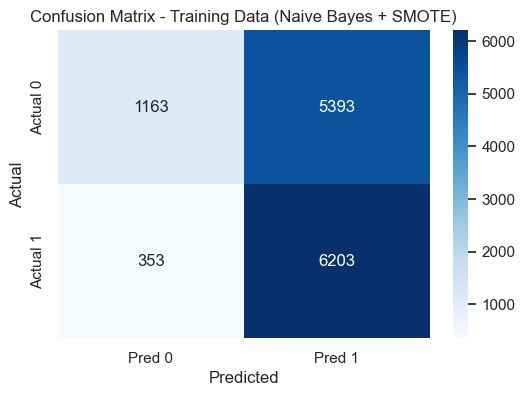

In [1079]:
# Generate confusion matrix
cm_nbsm_train = confusion_matrix(y_train_res, ytrain_predict_nbsm)

# Print the matrix
print("Confusion Matrix for Training Dataset:")
print(cm_nbsm_train)

# Classification report
print("\nClassification Report for Training Dataset:")
print(classification_report(y_train_res, ytrain_predict_nbsm))

# Visualize confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm_nbsm_train, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Training Data (Naive Bayes + SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [1075]:

# predicting and getting accuracy score for testing dataset
ytest_predict_nbsm = nb.predict(X_test)
print("Accuracy of testing dataset:", nb.score(X_test, y_test))

Accuracy of testing dataset: 0.3063943161634103


In [1063]:
# printing confusuon matix and classification report for testing datatset
print("Confusion matrix of test dataset")
print(confusion_matrix(y_test, ytest_predict_nbsm))         ## confusion_matrix
print("Classification report of test dataset")
print(classification_report(y_test, ytest_predict_nbsm))    ## classification_report

Confusion matrix of test dataset
[[ 502 2306]
 [  37  533]]
Classification report of test dataset
              precision    recall  f1-score   support

         0.0       0.93      0.18      0.30      2808
         1.0       0.19      0.94      0.31       570

    accuracy                           0.31      3378
   macro avg       0.56      0.56      0.31      3378
weighted avg       0.81      0.31      0.30      3378



Confusion matrix of test dataset:
[[ 502 2306]
 [  37  533]]

Classification report of test dataset:
              precision    recall  f1-score   support

         0.0       0.93      0.18      0.30      2808
         1.0       0.19      0.94      0.31       570

    accuracy                           0.31      3378
   macro avg       0.56      0.56      0.31      3378
weighted avg       0.81      0.31      0.30      3378



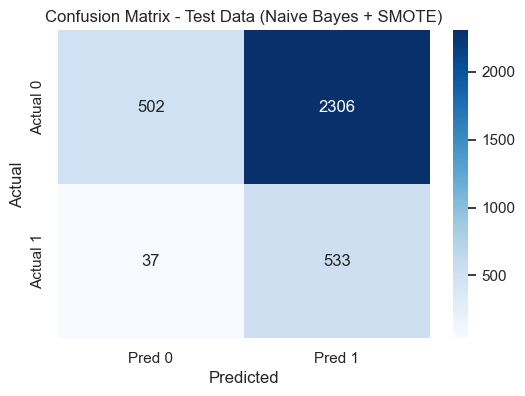

In [1083]:
# Generate confusion matrix
cm_nbsm_test = confusion_matrix(y_test, ytest_predict_nbsm)

# Print confusion matrix
print("Confusion matrix of test dataset:")
print(cm_nbsm_test)

# Print classification report
print("\nClassification report of test dataset:")
print(classification_report(y_test, ytest_predict_nbsm))

# Visualize confusion matrix with Seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(cm_nbsm_test, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Test Data (Naive Bayes + SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

AUC score and ROC curve for training dataset
AUC: 0.731


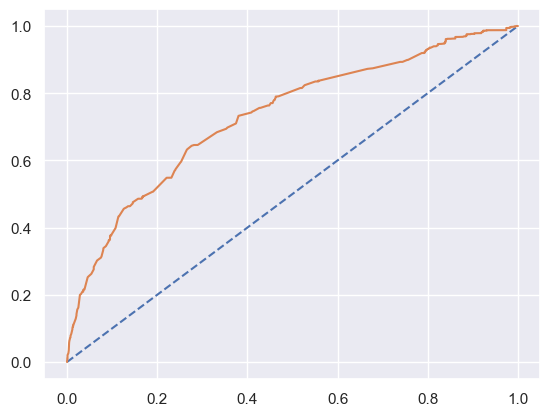

In [1085]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = nb.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.713


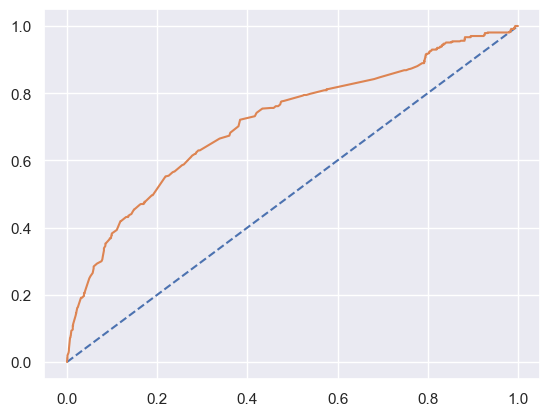

In [1087]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = nb.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [1089]:
print("cross validation scores for train dataset")
scores_nbsm_train = cross_val_score(nb, X_train_res, y_train_res, cv=10)
scores_nbsm_train

cross validation scores for train dataset


array([0.54954268, 0.52515244, 0.57742182, 0.5553013 , 0.56521739,
       0.5713196 , 0.55758963, 0.55606407, 0.56064073, 0.57818459])

In [1091]:
print("cross validation scores for test dataset")
scores_nbsm_test = cross_val_score(nb, X_test, y_test, cv=10)
scores_nbsm_test

cross validation scores for test dataset


array([0.29289941, 0.29289941, 0.28402367, 0.31656805, 0.28994083,
       0.26627219, 0.30769231, 0.27810651, 0.30860534, 0.27002967])

## Random Forest

In [537]:
# building rando forect model
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier(random_state=1)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=1)

In [539]:
# Performance Matrix on train data set
ytrain_predict_rf = rf.predict(X_train)
print("accuracy score for training dataset:",rf.score(X_train, y_train))

print("confusion matrix for training dataset")
print(metrics.confusion_matrix(y_train, ytrain_predict_rf))

print("classification report for training dataset")
print(metrics.classification_report(y_train, ytrain_predict_rf))

accuracy score for training dataset: 0.8546054300938848
confusion matrix for training dataset
[[6348  208]
 [ 938  388]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      6556
         1.0       0.65      0.29      0.40      1326

    accuracy                           0.85      7882
   macro avg       0.76      0.63      0.66      7882
weighted avg       0.83      0.85      0.83      7882




Confusion matrix for training dataset:
[[6348  208]
 [ 938  388]]

Classification report for training dataset:
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      6556
         1.0       0.65      0.29      0.40      1326

    accuracy                           0.85      7882
   macro avg       0.76      0.63      0.66      7882
weighted avg       0.83      0.85      0.83      7882



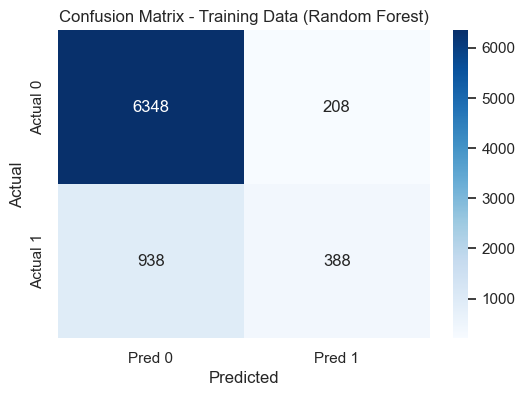

In [1095]:
# Confusion matrix
cm_rf_train = confusion_matrix(y_train, ytrain_predict_rf)
print("\nConfusion matrix for training dataset:")
print(cm_rf_train)

# Classification report
print("\nClassification report for training dataset:")
print(classification_report(y_train, ytrain_predict_rf))

# Visualize confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_rf_train, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Training Data (Random Forest)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [541]:
# Performance Matrix on test data set
ytest_predict_rf = rf.predict(X_test)
print("accuracy score for testing dataset:",rf.score(X_test, y_test))

print("confusion matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_rf))

print("classification report for testing dataste")
print(metrics.classification_report(y_test, ytest_predict_rf))

accuracy score for testing dataset: 0.8457667258732978
confusion matrix for testing dataset
[[2696  112]
 [ 409  161]]
classification report for testing dataste
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91      2808
         1.0       0.59      0.28      0.38       570

    accuracy                           0.85      3378
   macro avg       0.73      0.62      0.65      3378
weighted avg       0.82      0.85      0.82      3378




Confusion matrix for testing dataset:
[[2696  112]
 [ 409  161]]

Classification report for testing dataset:
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91      2808
         1.0       0.59      0.28      0.38       570

    accuracy                           0.85      3378
   macro avg       0.73      0.62      0.65      3378
weighted avg       0.82      0.85      0.82      3378



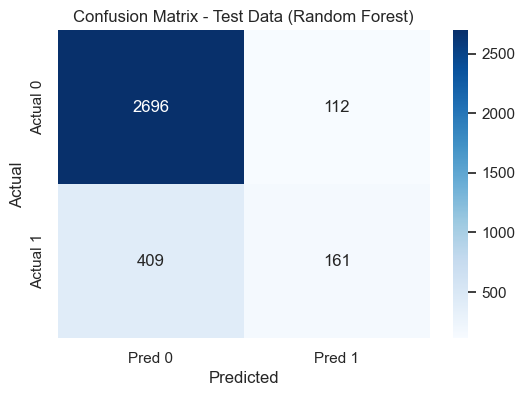

In [1099]:
# Confusion matrix
cm_rf_test = confusion_matrix(y_test, ytest_predict_rf)
print("\nConfusion matrix for testing dataset:")
print(cm_rf_test)

# Classification report
print("\nClassification report for testing dataset:")
print(classification_report(y_test, ytest_predict_rf))

# Confusion matrix heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_rf_test, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Pred 0", "Pred 1"], yticklabels=["Actual 0", "Actual 1"])
plt.title("Confusion Matrix - Test Data (Random Forest)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

AUC score and ROC curve for training dataset
AUC: 0.706


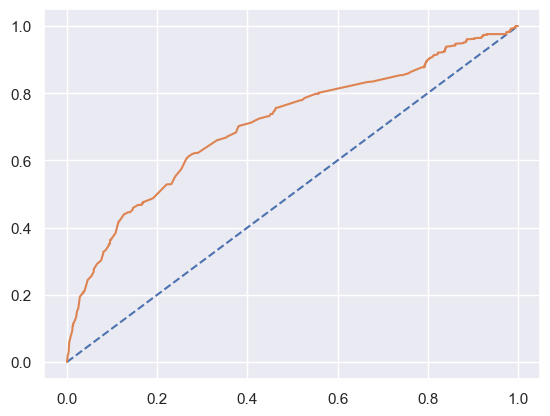

In [1101]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = nb.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.713


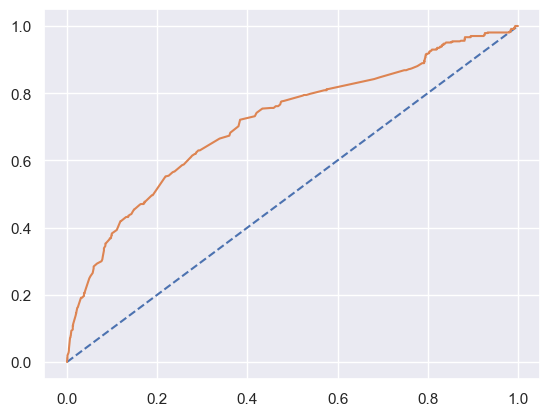

In [1103]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = nb.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

## Building random forest model over balanced dataset

In [548]:
rf.fit(X_train_res, y_train_res)

RandomForestClassifier(random_state=1)

In [550]:
# Performance Matrix on train data set
ytrain_predict_rfsm = rf.predict(X_train_res)
print("accuracy score for training dataset:",rf.score(X_train_res, y_train_res))

print("confusion matrix for training dataset")
print(metrics.confusion_matrix(y_train_res, ytrain_predict_rfsm))

print("classification report for training dataset")
print(metrics.classification_report(y_train_res, ytrain_predict_rfsm))

accuracy score for training dataset: 0.725594874923734
confusion matrix for training dataset
[[5074 1482]
 [2116 4440]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.71      0.77      0.74      6556
         1.0       0.75      0.68      0.71      6556

    accuracy                           0.73     13112
   macro avg       0.73      0.73      0.72     13112
weighted avg       0.73      0.73      0.72     13112



In [552]:
# Performance Matrix on test data set
ytest_predict_rfsm = rf.predict(X_test)
print("accuracy score for testing dataset:",rf.score(X_test, y_test))

print("confusion matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_rfsm))

print("classification report for testing dataste")
print(metrics.classification_report(y_test, ytest_predict_rfsm))

accuracy score for testing dataset: 0.7448194197750148
confusion matrix for testing dataset
[[2144  664]
 [ 198  372]]
classification report for testing dataste
              precision    recall  f1-score   support

         0.0       0.92      0.76      0.83      2808
         1.0       0.36      0.65      0.46       570

    accuracy                           0.74      3378
   macro avg       0.64      0.71      0.65      3378
weighted avg       0.82      0.74      0.77      3378



## Bagging

In [1105]:
from sklearn.ensemble import BaggingClassifier

# Assuming rf is your RandomForestClassifier or any base model
Bagging = BaggingClassifier(estimator=rf, random_state=1)
Bagging.fit(X_train, y_train)


BaggingClassifier(estimator=RandomForestClassifier(random_state=1),
                  random_state=1)

In [1106]:
# Performance Matrix on train data set
ytrain_predict_bagging = Bagging.predict(X_train)
print("accuracy score or training dataset:",Bagging.score(X_train, y_train))

print("confusion report for training dataset")
print(metrics.confusion_matrix(y_train, ytrain_predict_bagging))

print("classification report for training dataset")
print(metrics.classification_report(y_train, ytrain_predict_bagging))

accuracy score or training dataset: 0.8650088809946714
confusion report for training dataset
[[6350  206]
 [ 858  468]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.88      0.97      0.92      6556
         1.0       0.69      0.35      0.47      1326

    accuracy                           0.87      7882
   macro avg       0.79      0.66      0.70      7882
weighted avg       0.85      0.87      0.85      7882



In [1109]:
# Performance Matrix on test data set
ytest_predict_bagging = Bagging.predict(X_test)
print("Accuracy score for testing datatset:",Bagging.score(X_test, y_test))

print("confusuion matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_bagging))

print("classification report for testing dataset")
print(metrics.classification_report(y_test, ytest_predict_bagging))

Accuracy score for testing datatset: 0.8496151568975725
confusuion matrix for testing dataset
[[2678  130]
 [ 378  192]]
classification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.88      0.95      0.91      2808
         1.0       0.60      0.34      0.43       570

    accuracy                           0.85      3378
   macro avg       0.74      0.65      0.67      3378
weighted avg       0.83      0.85      0.83      3378



AUC score and ROC curve for training dataset
AUC: 0.841


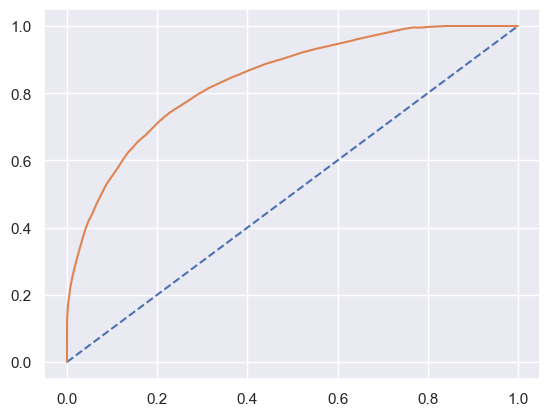

In [1111]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = Bagging.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.802


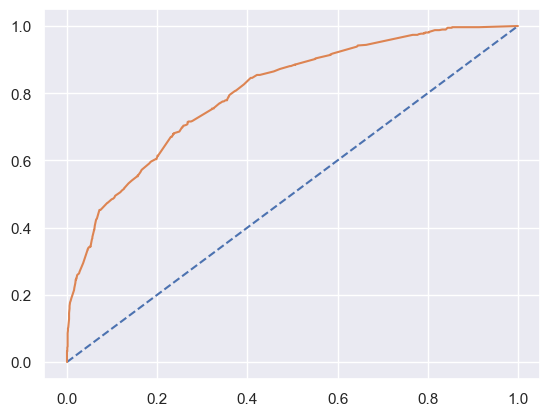

In [1113]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = Bagging.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [569]:
print("cross validation scores for train dataset")
scores_bagging_train = cross_val_score(Bagging, X_train, y_train, cv=10)
scores_bagging_train

cross validation scores for train dataset


array([0.83396705, 0.84030418, 0.85025381, 0.86167513, 0.84010152,
       0.84517766, 0.8464467 , 0.84010152, 0.85406091, 0.84137056])

In [571]:
print("cross validation scores for test dataset")
scores_bagging_test = cross_val_score(Bagging, X_test, y_test, cv=10)
scores_bagging_test

cross validation scores for test dataset


array([0.82840237, 0.84023669, 0.84023669, 0.84023669, 0.84911243,
       0.83431953, 0.83727811, 0.84023669, 0.83086053, 0.85459941])

## bagging on balanced dataset

In [574]:
Bagging.fit(X_train_res, y_train_res)

BaggingClassifier(estimator=RandomForestClassifier(random_state=1),
                  random_state=1)

In [576]:
# Performance Matrix on train data set
ytrain_predict_bagging_sm = Bagging.predict(X_train_res)
print("accuracy score or training dataset:",Bagging.score(X_train_res, y_train_res))

print("confusion report for training dataset")
print(metrics.confusion_matrix(y_train_res, ytrain_predict_bagging_sm))

print("classification report for training dataset")
print(metrics.classification_report(y_train_res, ytrain_predict_bagging_sm))

accuracy score or training dataset: 0.7255186089078707
confusion report for training dataset
[[5067 1489]
 [2110 4446]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.71      0.77      0.74      6556
         1.0       0.75      0.68      0.71      6556

    accuracy                           0.73     13112
   macro avg       0.73      0.73      0.72     13112
weighted avg       0.73      0.73      0.72     13112



In [578]:
# Performance Matrix on test data set
ytest_predict_bagging_sm= Bagging.predict(X_test)
print("Accuracy score for testing datatset:",Bagging.score(X_test, y_test))

print("confusuion matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_bagging_sm))

print("classification report for testing dataset")
print(metrics.classification_report(y_test, ytest_predict_bagging_sm))

Accuracy score for testing datatset: 0.7448194197750148
confusuion matrix for testing dataset
[[2143  665]
 [ 197  373]]
classification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.92      0.76      0.83      2808
         1.0       0.36      0.65      0.46       570

    accuracy                           0.74      3378
   macro avg       0.64      0.71      0.65      3378
weighted avg       0.82      0.74      0.77      3378



AUC score and ROC curve for training dataset
AUC: 0.836


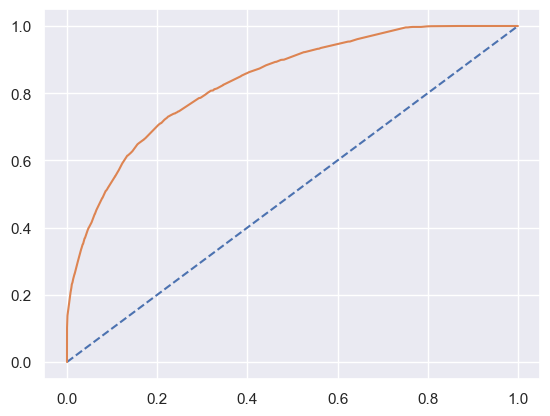

In [1117]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = Bagging.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.772


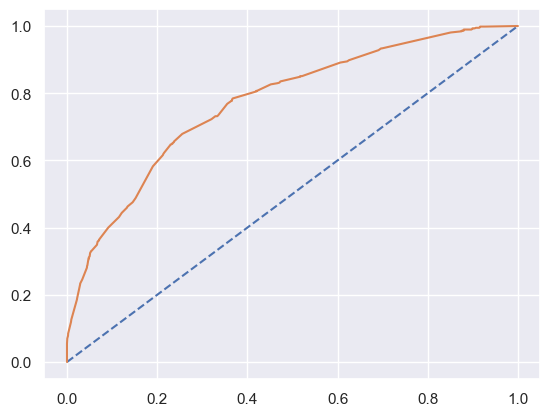

In [584]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = Bagging.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [586]:
print("cross validation scores for train dataset")
scores_bagging_sm_train = cross_val_score(Bagging, X_train_res, y_train_res, cv=10)
scores_bagging_sm_train

cross validation scores for train dataset


array([0.71875   , 0.72027439, 0.71243326, 0.73073989, 0.72845156,
       0.73302822, 0.70022883, 0.71929825, 0.72463768, 0.73226545])

In [588]:
print("cross validation scores for test dataset")
scores_bagging_sm_test = cross_val_score(Bagging, X_test, y_test, cv=10)
scores_bagging_sm_test

cross validation scores for test dataset


array([0.82840237, 0.84023669, 0.84023669, 0.84023669, 0.84911243,
       0.83431953, 0.83727811, 0.84023669, 0.83086053, 0.85459941])

## Ada-Boost

In [1119]:
from sklearn.ensemble import AdaBoostClassifier


adb = AdaBoostClassifier(random_state=1)
adb.fit(X_train,y_train)

AdaBoostClassifier(random_state=1)

In [1121]:
# Performance Matrix on train data set
ytrain_predict_adb = adb.predict(X_train)

print("Accuracy for training dataset:",adb.score(X_train, y_train))

print("confusion matrix for training dataset")
print(metrics.confusion_matrix(y_train, ytrain_predict_adb))

print("classification report for training dataset")
print(metrics.classification_report(y_train, ytrain_predict_adb))

Accuracy for training dataset: 0.840268967267191
confusion matrix for training dataset
[[6440  116]
 [1143  183]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.85      0.98      0.91      6556
         1.0       0.61      0.14      0.23      1326

    accuracy                           0.84      7882
   macro avg       0.73      0.56      0.57      7882
weighted avg       0.81      0.84      0.80      7882



In [1123]:
# Performance Matrix on test data set
ytest_predict_adb = adb.predict(X_test)
print("accuracy score for testing dataset:",adb.score(X_test, y_test))

print("confusion matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_adb))

print("classification report for testing dataset")
print(metrics.classification_report(y_test, ytest_predict_adb))

accuracy score for testing dataset: 0.8413262285375962
confusion matrix for testing dataset
[[2755   53]
 [ 483   87]]
classification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.85      0.98      0.91      2808
         1.0       0.62      0.15      0.25       570

    accuracy                           0.84      3378
   macro avg       0.74      0.57      0.58      3378
weighted avg       0.81      0.84      0.80      3378



AUC score and ROC curve for training dataset
AUC: 0.753


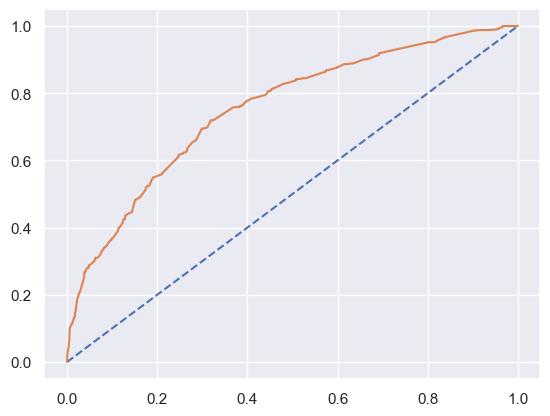

In [1125]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = adb.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.757


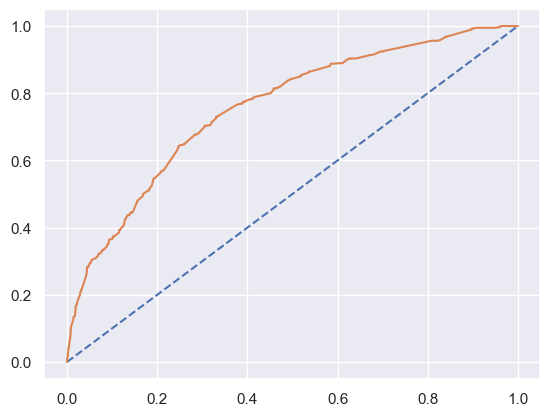

In [1127]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = adb.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [601]:
print("cross validation scores for train dataset")
scores_adb_train = cross_val_score(adb, X_train, y_train, cv=10)
scores_adb_train

cross validation scores for train dataset


array([0.83396705, 0.83776933, 0.84771574, 0.84137056, 0.83756345,
       0.83756345, 0.84263959, 0.83121827, 0.83756345, 0.83502538])

In [603]:
print("cross validation scores for test dataset")
scores_adb_test = cross_val_score(adb, X_test, y_test, cv=10)
scores_adb_test

cross validation scores for test dataset


array([0.82248521, 0.83727811, 0.84023669, 0.82840237, 0.84911243,
       0.84319527, 0.83727811, 0.85207101, 0.83679525, 0.84272997])

## Ada-Boost on balanced dataset

In [1129]:
adb.fit(X_train_res,y_train_res)

AdaBoostClassifier(random_state=1)

In [1131]:
# Performance Matrix on train data set
ytrain_predict_adbsm = adb.predict(X_train_res)

print("Accuracy for training dataset:",adb.score(X_train_res, y_train_res))

print("confusion matrix for training dataset")
print(metrics.confusion_matrix(y_train_res, ytrain_predict_adbsm))

print("classification report for training dataset")
print(metrics.classification_report(y_train_res, ytrain_predict_adbsm))

Accuracy for training dataset: 0.6978340451494814
confusion matrix for training dataset
[[4280 2276]
 [1686 4870]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.72      0.65      0.68      6556
         1.0       0.68      0.74      0.71      6556

    accuracy                           0.70     13112
   macro avg       0.70      0.70      0.70     13112
weighted avg       0.70      0.70      0.70     13112



In [1133]:
# Performance Matrix on test data set
ytest_predict_adbsm = adb.predict(X_test)
print("accuracy score for testing dataset:",adb.score(X_test, y_test))

print("confusion matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_adbsm))

print("classification report for testing dataset")
print(metrics.classification_report(y_test, ytest_predict_adbsm))

accuracy score for testing dataset: 0.6571936056838366
confusion matrix for testing dataset
[[1802 1006]
 [ 152  418]]
classification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.92      0.64      0.76      2808
         1.0       0.29      0.73      0.42       570

    accuracy                           0.66      3378
   macro avg       0.61      0.69      0.59      3378
weighted avg       0.82      0.66      0.70      3378



AUC score and ROC curve for training dataset
AUC: 0.756


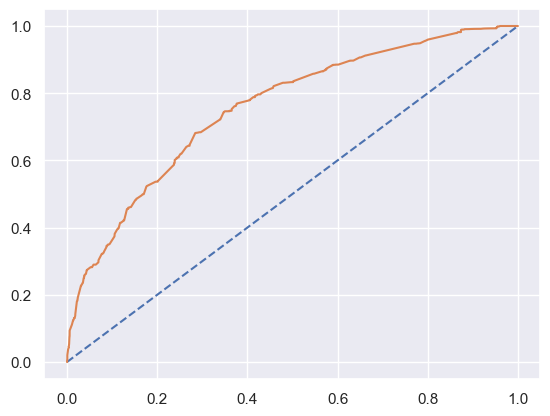

In [1135]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = adb.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.750


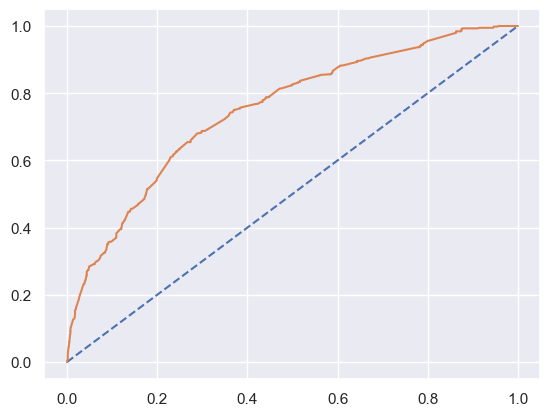

In [1137]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = adb.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [1139]:
print("cross validation scores for train dataset")
scores_adb_sm_train = cross_val_score(adb, X_train_res, y_train_res, cv=10)
scores_adb_sm_train

cross validation scores for train dataset


array([0.67911585, 0.67530488, 0.6849733 , 0.69717773, 0.6819222 ,
       0.71929825, 0.67963387, 0.6849733 , 0.71014493, 0.71472159])

In [1140]:
print("cross validation scores for test dataset")
scores_adb_sm_test = cross_val_score(adb, X_test, y_test, cv=10)
scores_adb_sm_test

cross validation scores for test dataset


array([0.83136095, 0.83431953, 0.83136095, 0.85502959, 0.86094675,
       0.85207101, 0.84023669, 0.84615385, 0.84569733, 0.84272997])

## Gradient Boosting

In [1143]:
from sklearn.ensemble import GradientBoostingClassifier
gb = GradientBoostingClassifier(random_state=1)
gb.fit(X_train, y_train)

GradientBoostingClassifier(random_state=1)

In [1145]:
# Performance Matrix on train data set
ytrain_predict_gb = gb.predict(X_train)
print("accuracy for training dataset:", gb.score(X_train, y_train))

print("confusion matrix for training dataset")
print(metrics.confusion_matrix(y_train, ytrain_predict_gb))

print("classification report for training dataset")
print(metrics.classification_report(y_train, ytrain_predict_gb))

accuracy for training dataset: 0.8506724181679777
confusion matrix for training dataset
[[6450  106]
 [1071  255]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.86      0.98      0.92      6556
         1.0       0.71      0.19      0.30      1326

    accuracy                           0.85      7882
   macro avg       0.78      0.59      0.61      7882
weighted avg       0.83      0.85      0.81      7882



In [1147]:
# Performance Matrix on test data set
ytest_predict_gb = gb.predict(X_test)
print("accuracy score for testing dataset:", gb.score(X_test, y_test))

print("confusuon matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_gb))

print("classification report for testing dataset")
print(metrics.classification_report(y_test, ytest_predict_gb))

accuracy score for testing dataset: 0.8463587921847247
confusuon matrix for testing dataset
[[2745   63]
 [ 456  114]]
classification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.86      0.98      0.91      2808
         1.0       0.64      0.20      0.31       570

    accuracy                           0.85      3378
   macro avg       0.75      0.59      0.61      3378
weighted avg       0.82      0.85      0.81      3378



AUC score and ROC curve for training dataset
AUC: 0.787


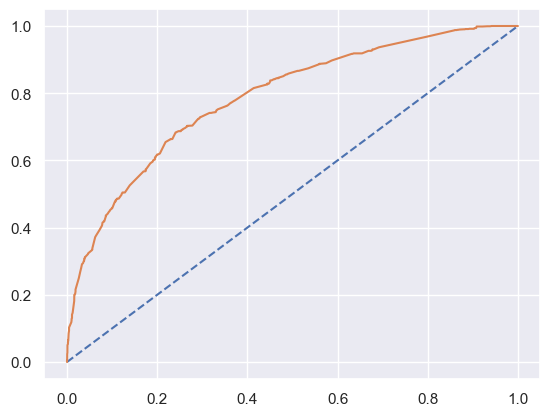

In [1149]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = gb.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.779


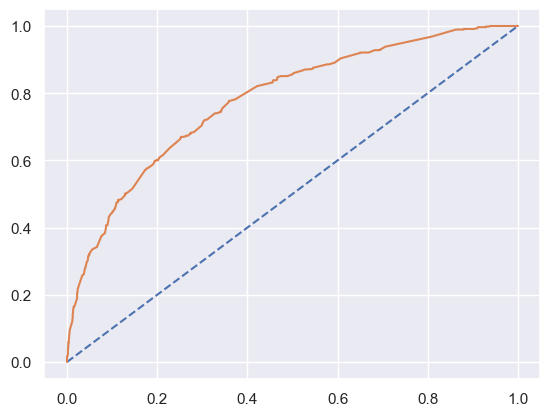

In [1151]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = gb.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [1153]:
print("cross validation scores for train dataset")
scores_gb_train = cross_val_score(gb, X_train, y_train, cv=10)
scores_gb_train

cross validation scores for train dataset


array([0.8365019 , 0.85171103, 0.85406091, 0.85532995, 0.84898477,
       0.85025381, 0.84898477, 0.84898477, 0.8464467 , 0.84137056])

In [1154]:
print("cross validation scores for test dataset")
scores_gb_test = cross_val_score(gb, X_test, y_test, cv=10)
scores_gb_test

cross validation scores for test dataset


array([0.84615385, 0.82840237, 0.83136095, 0.84023669, 0.86094675,
       0.86094675, 0.82544379, 0.82544379, 0.83382789, 0.83679525])

## Gradient Boosting on balanced dataset

In [1157]:
gb.fit(X_train_res, y_train_res)

GradientBoostingClassifier(random_state=1)

In [1159]:
# Performance Matrix on train data set
ytrain_predict_gbsm = gb.predict(X_train_res)
print("accuracy for training dataset:", gb.score(X_train_res, y_train_res))

print("confusion matrix for training dataset")
print(metrics.confusion_matrix(y_train_res, ytrain_predict_gbsm))

print("classification report for training dataset")
print(metrics.classification_report(y_train_res, ytrain_predict_gbsm))

accuracy for training dataset: 0.7210189139719341
confusion matrix for training dataset
[[4871 1685]
 [1973 4583]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.71      0.74      0.73      6556
         1.0       0.73      0.70      0.71      6556

    accuracy                           0.72     13112
   macro avg       0.72      0.72      0.72     13112
weighted avg       0.72      0.72      0.72     13112



In [1161]:
# Performance Matrix on test data set
ytest_predict_gbsm = gb.predict(X_test)
print("accuracy score for testing dataset:", gb.score(X_test, y_test))

print("confusuon matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_gbsm))

print("classification report for testing dataset")
print(metrics.classification_report(y_test, ytest_predict_gbsm))

accuracy score for testing dataset: 0.7175843694493783
confusuon matrix for testing dataset
[[2037  771]
 [ 183  387]]
classification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.92      0.73      0.81      2808
         1.0       0.33      0.68      0.45       570

    accuracy                           0.72      3378
   macro avg       0.63      0.70      0.63      3378
weighted avg       0.82      0.72      0.75      3378



AUC score and ROC curve for training dataset
AUC: 0.789


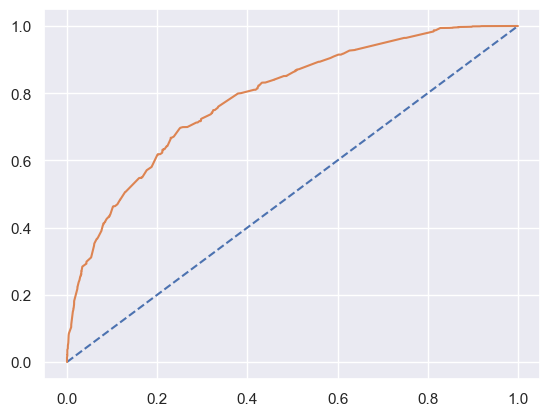

In [1163]:
# creating ROC curve and getting AUC score for train data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = gb.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for training dataset")
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC score and ROC curve for testing dataset
AUC: 0.771


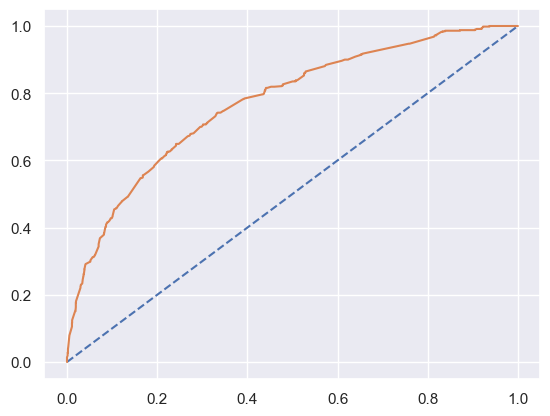

In [1165]:
# creating ROC curve and getting AUC score for test data set
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
# predict probabilities
probs = gb.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
print("AUC score and ROC curve for testing dataset")
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [1167]:
print("cross validation scores for train dataset")
scores_gb_sm_train = cross_val_score(gb, X_train_res, y_train_res, cv=10)
scores_gb_sm_train

cross validation scores for train dataset


array([0.70960366, 0.68978659, 0.71319603, 0.73073989, 0.71472159,
       0.73684211, 0.68954996, 0.70633105, 0.7238749 , 0.73073989])

In [1168]:

print("cross validation scores for test dataset")
scores_gb_sm_test = cross_val_score(gb, X_test, y_test, cv=10)
scores_gb_sm_test


cross validation scores for test dataset


array([0.84615385, 0.82840237, 0.83136095, 0.84023669, 0.86094675,
       0.86094675, 0.82544379, 0.82544379, 0.83382789, 0.83679525])

## Decision Tree

In [654]:
from sklearn import tree

In [656]:
dt_model= tree.DecisionTreeClassifier(random_state=7)
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=7)

In [658]:
## Performance Matrix on train data set
dt_train_predict = dt_model.predict(X_train)
dt_model_score = dt_model.score(X_train, y_train)
print(dt_model_score)
print(confusion_matrix(y_train, dt_train_predict))
print(classification_report(y_train, dt_train_predict))

0.8546054300938848
[[6377  179]
 [ 967  359]]
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      6556
         1.0       0.67      0.27      0.39      1326

    accuracy                           0.85      7882
   macro avg       0.77      0.62      0.65      7882
weighted avg       0.83      0.85      0.83      7882



In [660]:
## Performance Matrix on test data set
dt_test_predict = dt_model.predict(X_test)
dt_test_model_score = dt_model.score(X_test, y_test)
print(dt_test_model_score)
print(confusion_matrix(y_test, dt_test_predict))
print(classification_report(y_test, dt_test_predict))

0.8454706927175843
[[2708  100]
 [ 422  148]]
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91      2808
         1.0       0.60      0.26      0.36       570

    accuracy                           0.85      3378
   macro avg       0.73      0.61      0.64      3378
weighted avg       0.82      0.85      0.82      3378



In [662]:
reg_dt_model = tree.DecisionTreeClassifier(criterion = 'gini', max_depth = 8, min_samples_leaf=10, min_samples_split=30)
reg_dt_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=8, min_samples_leaf=10, min_samples_split=30)

In [664]:
## Performance Matrix on train data set
reg_dt_train_predict = reg_dt_model.predict(X_train)
reg_dt_train_score = reg_dt_model.score(X_train, y_train)
print(reg_dt_train_score)
print(confusion_matrix(y_train, reg_dt_train_predict))
print(classification_report(y_train, reg_dt_train_predict))

0.8502918041106318
[[6375  181]
 [ 999  327]]
              precision    recall  f1-score   support

         0.0       0.86      0.97      0.92      6556
         1.0       0.64      0.25      0.36      1326

    accuracy                           0.85      7882
   macro avg       0.75      0.61      0.64      7882
weighted avg       0.83      0.85      0.82      7882



In [1173]:
# Predictions
reg_dt_train_predict = reg_dt_model.predict(X_train)

# Accuracy
reg_dt_train_score = reg_dt_model.score(X_train, y_train)
print("Accuracy score for training dataset:", reg_dt_train_score)
cm_dt_train = confusion_matrix(y_train, reg_dt_train_predict)
print("\nConfusion matrix for training dataset:")
print(cm_dt_train)

# Classification report
print("\nClassification report for training dataset:")
print(classification_report(y_train, reg_dt_train_predict))

Accuracy score for training dataset: 0.8405227099720883

Confusion matrix for training dataset:
[[6247  309]
 [ 948  378]]

Classification report for training dataset:
              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91      6556
         1.0       0.55      0.29      0.38      1326

    accuracy                           0.84      7882
   macro avg       0.71      0.62      0.64      7882
weighted avg       0.81      0.84      0.82      7882



Area under Curve is 0.6094990185495516


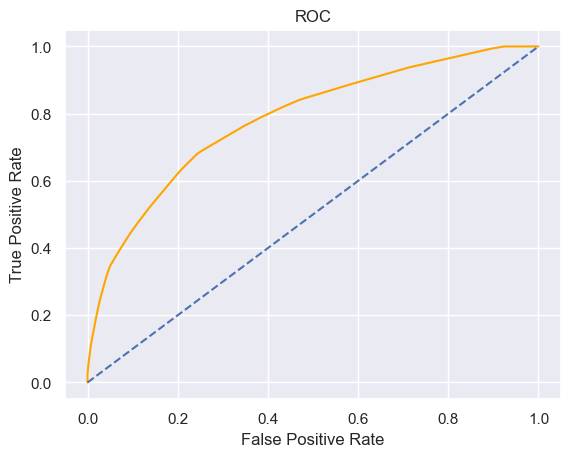

In [672]:
# ROC, AUC for Training Data
reg_dt_train_fpr, reg_dt_train_tpr,_=roc_curve(y_train, reg_dt_model.predict_proba(X_train)[:,1])
plt.plot(reg_dt_train_fpr, reg_dt_train_tpr,color='orange')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
reg_dt_train_auc=roc_auc_score(y_train, reg_dt_model.predict(X_train))
print('Area under Curve is', reg_dt_train_auc)

In [674]:
## Performance Matrix on test data set
reg_dt_test_predict = reg_dt_model.predict(X_test)
reg_dt_test_score = reg_dt_model.score(X_test, y_test)
print(reg_dt_test_score)
print(confusion_matrix(y_test, reg_dt_test_predict))
print(classification_report(y_test, reg_dt_test_predict))

0.8436944937833037
[[2706  102]
 [ 426  144]]
              precision    recall  f1-score   support

         0.0       0.86      0.96      0.91      2808
         1.0       0.59      0.25      0.35       570

    accuracy                           0.84      3378
   macro avg       0.72      0.61      0.63      3378
weighted avg       0.82      0.84      0.82      3378



In [1175]:
# Predictions
reg_dt_test_predict = reg_dt_model.predict(X_test)

# Accuracy
reg_dt_test_score = reg_dt_model.score(X_test, y_test)
print("Accuracy score for testing dataset:", reg_dt_test_score)

# Confusion matrix
cm_dt_test = confusion_matrix(y_test, reg_dt_test_predict)
print("\nConfusion matrix for testing dataset:")
print(cm_dt_test)

# Classification report
print("\nClassification report for testing dataset:")
print(classification_report(y_test, reg_dt_test_predict))

Accuracy score for testing dataset: 0.8345174659561871

Confusion matrix for testing dataset:
[[2645  163]
 [ 396  174]]

Classification report for testing dataset:
              precision    recall  f1-score   support

         0.0       0.87      0.94      0.90      2808
         1.0       0.52      0.31      0.38       570

    accuracy                           0.83      3378
   macro avg       0.69      0.62      0.64      3378
weighted avg       0.81      0.83      0.82      3378



Area under Curve is 0.608153396311291


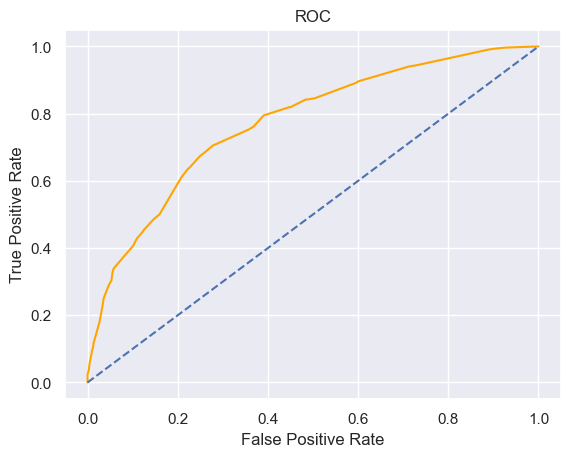

In [676]:
# ROC, AUC for Test Data
reg_dt_test_fpr, reg_dt_test_tpr,_=roc_curve(y_test, reg_dt_model.predict_proba(X_test)[:,1])
plt.plot(reg_dt_test_fpr,reg_dt_test_tpr,color='orange')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
reg_dt_test_auc=roc_auc_score(y_test, reg_dt_model.predict(X_test))
print('Area under Curve is', reg_dt_test_auc)

## Support Vector Machine

In [1177]:
from sklearn import svm
SVM = svm.SVC()
SVM.fit(X_train, y_train)

SVC()

In [1178]:
# Performance Matrix on train data set
ytrain_predict_SVM = SVM.predict(X_train)
print("accuracy for training dataset:", SVM.score(X_train, y_train))

print("confusion matrix for training dataset")
print(metrics.confusion_matrix(y_train, ytrain_predict_SVM))

print("classification report for training dataset")
print(metrics.classification_report(y_train, ytrain_predict_SVM))

accuracy for training dataset: 0.8570159857904085
confusion matrix for training dataset
[[6399  157]
 [ 970  356]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.87      0.98      0.92      6556
         1.0       0.69      0.27      0.39      1326

    accuracy                           0.86      7882
   macro avg       0.78      0.62      0.65      7882
weighted avg       0.84      0.86      0.83      7882



In [1181]:
# Performance Matrix on test data set
ytest_predict_SVM = SVM.predict(X_test)
print("accuracy score for testing dataset:", SVM.score(X_test, y_test))

print("confusuon matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_SVM))

print("classification report for testing dataset")
print(metrics.classification_report(y_test, ytest_predict_SVM))

accuracy score for testing dataset: 0.8481349911190054
confusuon matrix for testing dataset
[[2710   98]
 [ 415  155]]
classification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.91      2808
         1.0       0.61      0.27      0.38       570

    accuracy                           0.85      3378
   macro avg       0.74      0.62      0.65      3378
weighted avg       0.82      0.85      0.82      3378



Accuracy for training dataset: 0.8570159857904085

Confusion matrix for training dataset:
[[6399  157]
 [ 970  356]]

Classification report for training dataset:
              precision    recall  f1-score   support

         0.0       0.87      0.98      0.92      6556
         1.0       0.69      0.27      0.39      1326

    accuracy                           0.86      7882
   macro avg       0.78      0.62      0.65      7882
weighted avg       0.84      0.86      0.83      7882



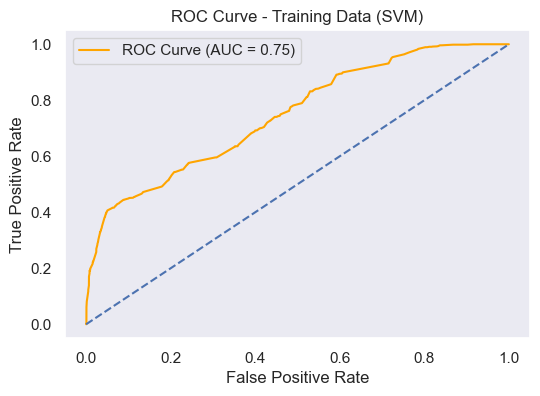

In [1195]:
# 1. Fit SVM with probability enabled (if not already)
SVM = SVC(kernel='rbf', probability=True, random_state=42)  # Already trained? Then skip this line
SVM.fit(X_train, y_train)  # Train again only if needed

# 2. Predictions and Accuracy
ytrain_predict_SVM = SVM.predict(X_train)
print("Accuracy for training dataset:", SVM.score(X_train, y_train))

# 3. Confusion Matrix
cm_svm_train = confusion_matrix(y_train, ytrain_predict_SVM)
print("\nConfusion matrix for training dataset:")
print(cm_svm_train)

# 4. Classification Report
print("\nClassification report for training dataset:")
print(classification_report(y_train, ytrain_predict_SVM))

# 5. ROC Curve
ytrain_probs = SVM.predict_proba(X_train)[:, 1]  # Probabilities for class 1
fpr, tpr, thresholds = roc_curve(y_train, ytrain_probs)
roc_auc = roc_auc_score(y_train, ytrain_probs)

plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='orange')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.title('ROC Curve - Training Data (SVM)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid()
plt.show()

Accuracy score for testing dataset: 0.8481349911190054

Confusion matrix for testing dataset:
[[2710   98]
 [ 415  155]]

Classification report for testing dataset:
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.91      2808
         1.0       0.61      0.27      0.38       570

    accuracy                           0.85      3378
   macro avg       0.74      0.62      0.65      3378
weighted avg       0.82      0.85      0.82      3378



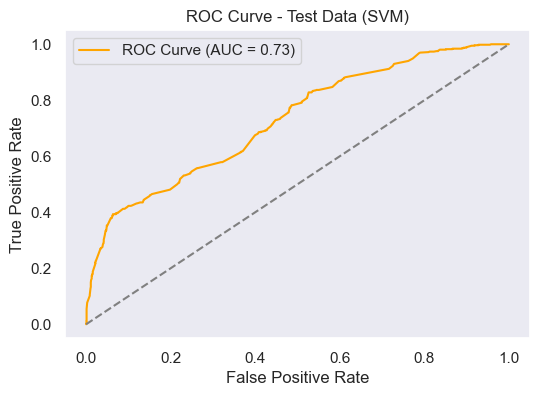

In [1199]:
# 1. Predictions and Accuracy
ytest_predict_SVM = SVM.predict(X_test)
print("Accuracy score for testing dataset:", SVM.score(X_test, y_test))

# 2. Confusion Matrix
cm_svm_test = confusion_matrix(y_test, ytest_predict_SVM)
print("\nConfusion matrix for testing dataset:")
print(cm_svm_test)

# 3. Classification Report
print("\nClassification report for testing dataset:")
print(classification_report(y_test, ytest_predict_SVM))

# 4. ROC Curve and AUC
ytest_probs = SVM.predict_proba(X_test)[:, 1]  # Probabilities for class 1
fpr, tpr, thresholds = roc_curve(y_test, ytest_probs)
roc_auc = roc_auc_score(y_test, ytest_probs)

plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='orange')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title('ROC Curve - Test Data (SVM)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid()
plt.show()

## Hypertuning SVM

In [1203]:
param_grid = {
    'kernel': ['linear','rbf','poly'],
    'C':np.logspace (-3, 2, 10),
    'gamma': [0.2,0.3,0.4,0.5,0.6],
    'degree': [2,3],
    
}

grid_search = GridSearchCV(estimator = SVM, param_grid = param_grid, cv = 5, n_jobs=-1,scoring='f1')

In [1205]:
# fitting gridsearchCV into training dataset
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(probability=True, random_state=42), n_jobs=-1,
             param_grid={'C': array([1.00000000e-03, 3.59381366e-03, 1.29154967e-02, 4.64158883e-02,
       1.66810054e-01, 5.99484250e-01, 2.15443469e+00, 7.74263683e+00,
       2.78255940e+01, 1.00000000e+02]),
                         'degree': [2, 3], 'gamma': [0.2, 0.3, 0.4, 0.5, 0.6],
                         'kernel': ['linear', 'rbf', 'poly']},
             scoring='f1')

In [849]:
# getting best parameters used out of all the combinations given in grid search
grid_search.best_params_

{'C': 7.742636826811277, 'degree': 2, 'gamma': 0.5, 'kernel': 'rbf'}

In [851]:
# getting best estimators
best_grid = grid_search.best_estimator_

In [853]:
ytrain_predict_SVMcv = best_grid.predict(X_train)
ytest_predict_SVMcv = best_grid.predict(X_test)

In [855]:
#Accuracy - Training Data
print("Accuracy of training dataset after gridsearchCV:",best_grid.score(X_train, y_train))

Accuracy of training dataset after gridsearchCV: 0.8652626236995686


In [857]:
#Accuracy - testing Data
print("Accuracy of testing dataset after gridsearchCV:",best_grid.score(X_test, y_test))

Accuracy of testing dataset after gridsearchCV: 0.85198342214328


In [859]:
# getting classification report for train data set
print("Classification report for train dataset")
print(classification_report(y_train, ytrain_predict_SVMcv))

Classification report for train dataset
              precision    recall  f1-score   support

         0.0       0.87      0.98      0.92      6556
         1.0       0.74      0.31      0.44      1326

    accuracy                           0.87      7882
   macro avg       0.81      0.64      0.68      7882
weighted avg       0.85      0.87      0.84      7882



In [861]:
# getting classification report for train data set
print("Classification report for test dataset")
print(classification_report(y_test, ytest_predict_SVMcv))

Classification report for test dataset
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      2808
         1.0       0.63      0.29      0.40       570

    accuracy                           0.85      3378
   macro avg       0.75      0.63      0.66      3378
weighted avg       0.83      0.85      0.83      3378



In [863]:
# confusion matrix for training data set
print("confusuon matrix for training dataset")
confusion_matrix(y_train, ytrain_predict_SVMcv)

confusuon matrix for training dataset


array([[6410,  146],
       [ 916,  410]], dtype=int64)

In [865]:
# confusion matrix for testing data set
print("confusuon matrix for testing dataset")
confusion_matrix(y_test, ytest_predict_SVMcv)

confusuon matrix for testing dataset


array([[2712,   96],
       [ 404,  166]], dtype=int64)

## Support Vector Machine on Balanced Dataset

In [868]:
SVM.fit(X_train_res, y_train_res)

SVC()

In [870]:
# Performance Matrix on train data set
ytrain_predict_SVMsm = SVM.predict(X_train_res)
print("accuracy for training dataset:", SVM.score(X_train_res, y_train_res))

print("confusion matrix for training dataset")
print(metrics.confusion_matrix(y_train_res, ytrain_predict_SVMsm))

print("classification report for training dataset")
print(metrics.classification_report(y_train_res, ytrain_predict_SVMsm))

accuracy for training dataset: 0.7524405125076266
confusion matrix for training dataset
[[5112 1444]
 [1802 4754]]
classification report for training dataset
              precision    recall  f1-score   support

         0.0       0.74      0.78      0.76      6556
         1.0       0.77      0.73      0.75      6556

    accuracy                           0.75     13112
   macro avg       0.75      0.75      0.75     13112
weighted avg       0.75      0.75      0.75     13112



In [871]:
# Performance Matrix on test data set
ytest_predict_SVMsm = SVM.predict(X_test)
print("accuracy score for testing dataset:", SVM.score(X_test, y_test))

print("confusuon matrix for testing dataset")
print(metrics.confusion_matrix(y_test, ytest_predict_SVMsm))

print("classification report for testing dataset")
print(metrics.classification_report(y_test, ytest_predict_SVMsm))

accuracy score for testing dataset: 0.7362344582593251
confusuon matrix for testing dataset
[[2108  700]
 [ 191  379]]
classification report for testing dataset
              precision    recall  f1-score   support

         0.0       0.92      0.75      0.83      2808
         1.0       0.35      0.66      0.46       570

    accuracy                           0.74      3378
   macro avg       0.63      0.71      0.64      3378
weighted avg       0.82      0.74      0.76      3378



In [874]:
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
)
from sklearn.model_selection import cross_val_score

def evaluate_model(name, model, X_train, y_train, X_test, y_test):
    print(f"\n{'='*40}\nEvaluating Model: {name}\n{'='*40}")

    # Predictions
    ytrain_pred = model.predict(X_train)
    ytest_pred = model.predict(X_test)

    # Accuracy
    train_acc = accuracy_score(y_train, ytrain_pred)
    test_acc = accuracy_score(y_test, ytest_pred)
    print(f"Training Accuracy: {train_acc:.4f}")
    print(f"Testing Accuracy : {test_acc:.4f}")

    # Classification Reports
    print("\nClassification Report - Train Data")
    print(classification_report(y_train, ytrain_pred))

    print("Classification Report - Test Data")
    print(classification_report(y_test, ytest_pred))

    # Confusion Matrices
    print("Confusion Matrix - Train Data")
    print(confusion_matrix(y_train, ytrain_pred))

    print("Confusion Matrix - Test Data")
    print(confusion_matrix(y_test, ytest_pred))

    # ROC AUC and ROC Curve for Train
    ytrain_probs = model.predict_proba(X_train)[:, 1]
    train_auc = roc_auc_score(y_train, ytrain_probs)
    train_fpr, train_tpr, _ = roc_curve(y_train, ytrain_probs)

    # ROC AUC and ROC Curve for Test
    ytest_probs = model.predict_proba(X_test)[:, 1]
    test_auc = roc_auc_score(y_test, ytest_probs)
    test_fpr, test_tpr, _ = roc_curve(y_test, ytest_probs)

    print(f"Training AUC: {train_auc:.4f}")
    print(f"Testing AUC : {test_auc:.4f}")

    plt.figure(figsize=(8,5))
    plt.plot(train_fpr, train_tpr, label=f'Train ROC curve (AUC = {train_auc:.3f})')
    plt.plot(test_fpr, test_tpr, label=f'Test ROC curve (AUC = {test_auc:.3f})')
    plt.plot([0,1],[0,1],'k--')
    plt.title(f'ROC Curve - {name}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.show()

    # Cross-validation scores
    cv_train_scores = cross_val_score(model, X_train, y_train, cv=10)
    cv_test_scores = cross_val_score(model, X_test, y_test, cv=10)
    print(f"Cross-validation accuracy (Train): Mean={cv_train_scores.mean():.4f}, Std={cv_train_scores.std():.4f}")
    print(f"Cross-validation accuracy (Test): Mean={cv_test_scores.mean():.4f}, Std={cv_test_scores.std():.4f}")

# Example usage:
# from sklearn.linear_model import LogisticRegression
# lg = LogisticRegression(random_state=1).fit(X_train, y_train)
# evaluate_model("Logistic Regression", lg, X_train, y_train, X_test, y_test)

# You can similarly train and pass other models like:
# DecisionTreeClassifier, RandomForestClassifier, SVM, GradientBoosting, etc.




Evaluating Model: Logistic Regression
Training Accuracy: 0.8393
Testing Accuracy : 0.8396

Classification Report - Train Data
              precision    recall  f1-score   support

         0.0       0.85      0.98      0.91      6556
         1.0       0.60      0.14      0.22      1326

    accuracy                           0.84      7882
   macro avg       0.72      0.56      0.57      7882
weighted avg       0.81      0.84      0.79      7882

Classification Report - Test Data
              precision    recall  f1-score   support

         0.0       0.85      0.98      0.91      2808
         1.0       0.60      0.15      0.24       570

    accuracy                           0.84      3378
   macro avg       0.72      0.56      0.57      3378
weighted avg       0.81      0.84      0.80      3378

Confusion Matrix - Train Data
[[6432  124]
 [1143  183]]
Confusion Matrix - Test Data
[[2751   57]
 [ 485   85]]
Training AUC: 0.7532
Testing AUC : 0.7563


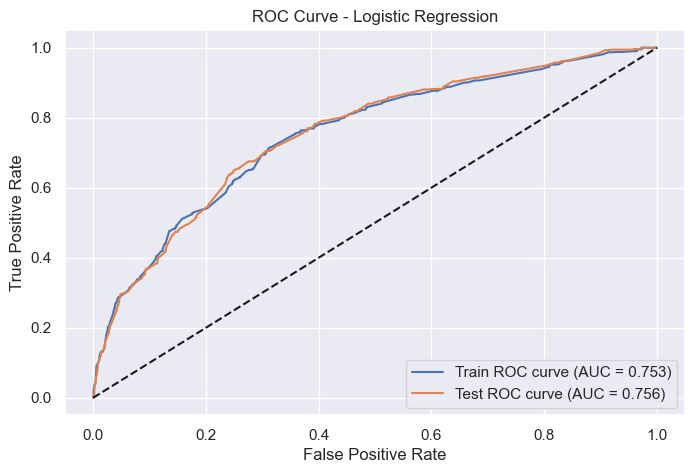

Cross-validation accuracy (Train): Mean=0.8400, Std=0.0047
Cross-validation accuracy (Test): Mean=0.8422, Std=0.0093

Evaluating Model: Logistic Regression with SMOTE
Training Accuracy: 0.7026
Testing Accuracy : 0.6918

Classification Report - Train Data
              precision    recall  f1-score   support

         0.0       0.92      0.70      0.80      6556
         1.0       0.32      0.70      0.44      1326

    accuracy                           0.70      7882
   macro avg       0.62      0.70      0.62      7882
weighted avg       0.82      0.70      0.74      7882

Classification Report - Test Data
              precision    recall  f1-score   support

         0.0       0.92      0.69      0.79      2808
         1.0       0.31      0.70      0.43       570

    accuracy                           0.69      3378
   macro avg       0.62      0.69      0.61      3378
weighted avg       0.82      0.69      0.73      3378

Confusion Matrix - Train Data
[[4615 1941]
 [ 403  923]]


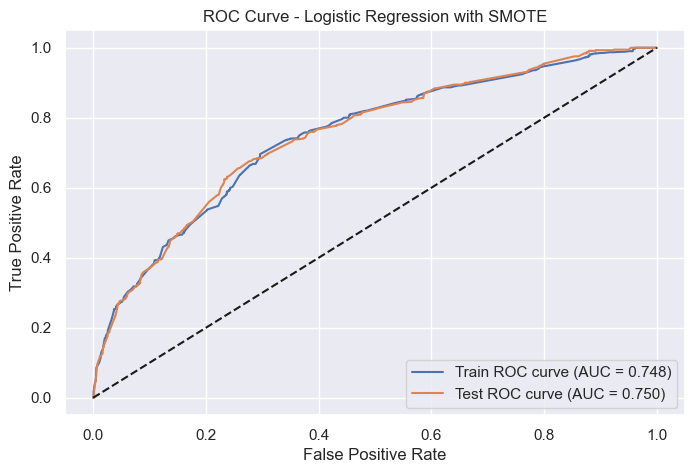

Cross-validation accuracy (Train): Mean=0.8400, Std=0.0047
Cross-validation accuracy (Test): Mean=0.8422, Std=0.0093

Evaluating Model: Tuned Logistic Regression
Training Accuracy: 0.8410
Testing Accuracy : 0.8390

Classification Report - Train Data
              precision    recall  f1-score   support

         0.0       0.85      0.98      0.91      6556
         1.0       0.63      0.13      0.22      1326

    accuracy                           0.84      7882
   macro avg       0.74      0.56      0.56      7882
weighted avg       0.81      0.84      0.79      7882

Classification Report - Test Data
              precision    recall  f1-score   support

         0.0       0.85      0.98      0.91      2808
         1.0       0.60      0.14      0.22       570

    accuracy                           0.84      3378
   macro avg       0.72      0.56      0.57      3378
weighted avg       0.81      0.84      0.79      3378

Confusion Matrix - Train Data
[[6455  101]
 [1152  174]]
Confu

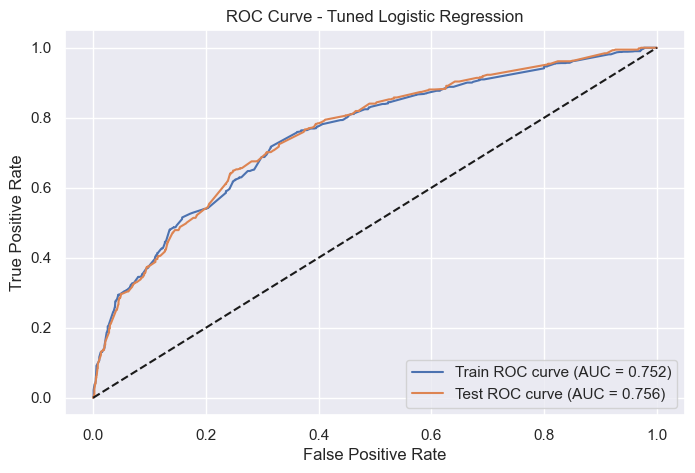

Cross-validation accuracy (Train): Mean=0.8408, Std=0.0043
Cross-validation accuracy (Test): Mean=0.8381, Std=0.0060

Evaluating Model: KNN
Training Accuracy: 0.8511
Testing Accuracy : 0.8378

Classification Report - Train Data
              precision    recall  f1-score   support

         0.0       0.88      0.95      0.91      6556
         1.0       0.60      0.34      0.43      1326

    accuracy                           0.85      7882
   macro avg       0.74      0.65      0.67      7882
weighted avg       0.83      0.85      0.83      7882

Classification Report - Test Data
              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91      2808
         1.0       0.53      0.30      0.38       570

    accuracy                           0.84      3378
   macro avg       0.70      0.62      0.65      3378
weighted avg       0.81      0.84      0.82      3378

Confusion Matrix - Train Data
[[6260  296]
 [ 878  448]]
Confusion Matrix - Test Dat

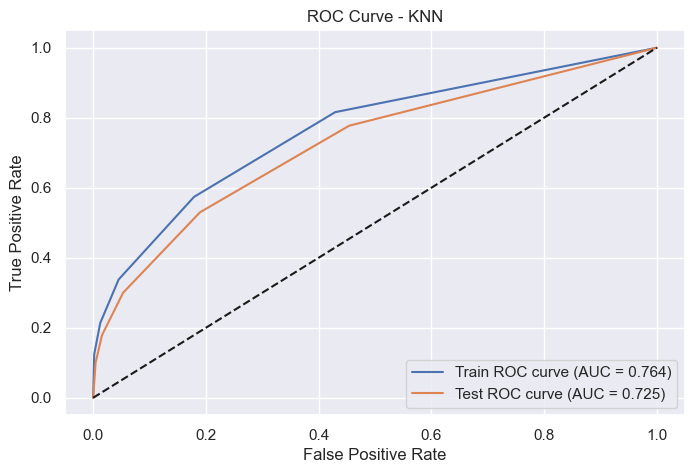

Cross-validation accuracy (Train): Mean=0.8401, Std=0.0085
Cross-validation accuracy (Test): Mean=0.8292, Std=0.0175

Evaluating Model: Tuned KNN
Training Accuracy: 0.8541
Testing Accuracy : 0.8496

Classification Report - Train Data
              precision    recall  f1-score   support

         0.0       0.86      0.99      0.92      6556
         1.0       0.75      0.20      0.31      1326

    accuracy                           0.85      7882
   macro avg       0.81      0.59      0.62      7882
weighted avg       0.84      0.85      0.82      7882

Classification Report - Test Data
              precision    recall  f1-score   support

         0.0       0.86      0.98      0.92      2808
         1.0       0.71      0.19      0.29       570

    accuracy                           0.85      3378
   macro avg       0.78      0.59      0.61      3378
weighted avg       0.83      0.85      0.81      3378

Confusion Matrix - Train Data
[[6469   87]
 [1063  263]]
Confusion Matrix - Te

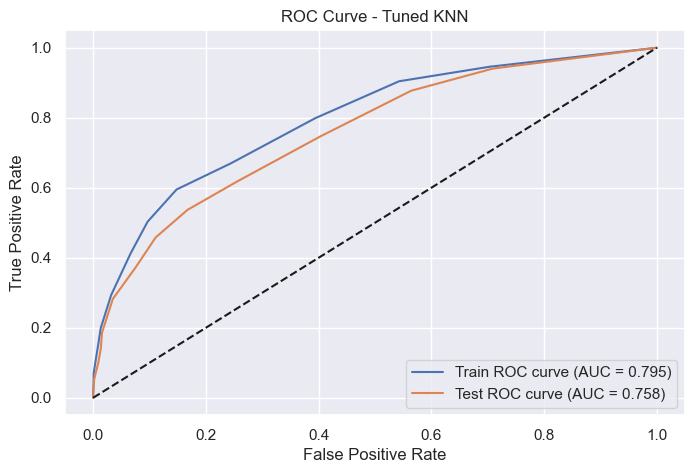

Cross-validation accuracy (Train): Mean=0.8465, Std=0.0059
Cross-validation accuracy (Test): Mean=0.8330, Std=0.0075


In [876]:
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV

# Your evaluate_model function here (or imported)

# Function to apply SMOTE and train model
def train_model_with_smote(model, X_train, y_train):
    sm = SMOTE(random_state=42)
    X_res, y_res = sm.fit_resample(X_train, y_train)
    model.fit(X_res, y_res)
    return model

# Example: Logistic Regression baseline
def build_logistic_regression(X_train, y_train):
    model = LogisticRegression(random_state=42, max_iter=1000)
    model.fit(X_train, y_train)
    return model

# Logistic Regression with SMOTE
def build_logistic_regression_smote(X_train, y_train):
    model = LogisticRegression(random_state=42, max_iter=1000)
    return train_model_with_smote(model, X_train, y_train)

# Example: Hyperparameter tuning for Logistic Regression
def tune_logistic_regression(X_train, y_train):
    param_grid = {
        'C': [0.01, 0.1, 1, 10],
        'solver': ['liblinear', 'newton-cg']
    }
    grid = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, cv=5, scoring='accuracy')
    grid.fit(X_train, y_train)
    return grid.best_estimator_

# Similarly, functions for other models, their hyperparameter tuning, and SMOTE versions.

# Example for KNN baseline
def build_knn(X_train, y_train, n_neighbors=5):
    model = KNeighborsClassifier(n_neighbors=n_neighbors)
    model.fit(X_train, y_train)
    return model

# Example for KNN hyperparameter tuning
def tune_knn(X_train, y_train):
    param_grid = {'n_neighbors': list(range(1, 21))}
    grid = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, scoring='accuracy')
    grid.fit(X_train, y_train)
    return grid.best_estimator_

# Repeat for LDA, Naive Bayes, Random Forest, Bagging, AdaBoost, Gradient Boosting, SVM

# --- Put models in a list to iterate ---

models_to_evaluate = [
    ("Logistic Regression", build_logistic_regression(X_train, y_train)),
    ("Logistic Regression with SMOTE", build_logistic_regression_smote(X_train, y_train)),
    ("Tuned Logistic Regression", tune_logistic_regression(X_train, y_train)),

    ("KNN", build_knn(X_train, y_train)),
    ("Tuned KNN", tune_knn(X_train, y_train)),
    # Add KNN SMOTE similarly

    # Add LDA, LDA SMOTE, LDA tuned
    # Add GaussianNB, GaussianNB SMOTE
    # Add Random Forest, RF SMOTE
    # Add Bagging, Bagging SMOTE
    # Add AdaBoost, AdaBoost SMOTE
    # Add Gradient Boosting, GB SMOTE
    # Add SVM, SVM SMOTE, Tuned SVM
]

# --- Evaluate all models in loop ---
for name, model in models_to_evaluate:
    evaluate_model(name, model, X_train, y_train, X_test, y_test)


In [878]:
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
import pandas as pd


In [880]:
def train_with_smote(model, X, y):
    sm = SMOTE(random_state=42)
    X_res, y_res = sm.fit_resample(X, y)
    model.fit(X_res, y_res)
    return model


In [882]:
def build_logistic(X, y):
    return LogisticRegression(max_iter=1000, random_state=42).fit(X, y)

def build_logistic_tuned(X, y):
    grid = GridSearchCV(LogisticRegression(max_iter=1000), {'C': [0.01, 0.1, 1, 10]}, cv=5)
    grid.fit(X, y)
    return grid.best_estimator_

def build_lda(X, y):
    return LinearDiscriminantAnalysis().fit(X, y)

def build_lda_tuned(X, y):
    grid = GridSearchCV(LinearDiscriminantAnalysis(), {'shrinkage': ['auto'], 'solver': ['lsqr']}, cv=5)
    grid.fit(X, y)
    return grid.best_estimator_

def build_knn(X, y, n=5):
    return KNeighborsClassifier(n_neighbors=n).fit(X, y)

def build_knn_tuned(X, y):
    grid = GridSearchCV(KNeighborsClassifier(), {'n_neighbors': list(range(1, 21))}, cv=5)
    grid.fit(X, y)
    return grid.best_estimator_

def build_nb(X, y):
    return GaussianNB().fit(X, y)

def build_rf(X, y):
    return RandomForestClassifier(random_state=42).fit(X, y)

def build_bagging(X, y):
    return BaggingClassifier(random_state=42).fit(X, y)

def build_adaboost(X, y):
    return AdaBoostClassifier(random_state=42).fit(X, y)

def build_gb(X, y):
    return GradientBoostingClassifier(random_state=42).fit(X, y)

def build_svm(X, y):
    return SVC(probability=True, random_state=42).fit(X, y)

def build_svm_tuned(X, y):
    grid = GridSearchCV(SVC(probability=True), {'C': [0.1, 1, 10], 'kernel': ['rbf', 'linear']}, cv=5)
    grid.fit(X, y)
    return grid.best_estimator_


In [884]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

def evaluate_model(name, model, X_train, y_train, X_test, y_test):
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    print(f"{name}:\nAccuracy: {acc:.3f}, Recall: {rec:.3f}, Precision: {prec:.3f}, F1 Score: {f1:.3f}\n")


In [886]:
models_to_evaluate = [
    ("Logistic Regression", build_logistic(X_train, y_train)),
    ("Tuned Logistic Regression", build_logistic_tuned(X_train, y_train)),
    ("Logistic Regression + SMOTE", train_with_smote(LogisticRegression(max_iter=1000), X_train, y_train)),

    ("LDA", build_lda(X_train, y_train)),
    ("Tuned LDA", build_lda_tuned(X_train, y_train)),
    ("LDA + SMOTE", train_with_smote(LinearDiscriminantAnalysis(), X_train, y_train)),

    ("KNN", build_knn(X_train, y_train)),
    ("Tuned KNN", build_knn_tuned(X_train, y_train)),
    ("KNN + SMOTE", train_with_smote(KNeighborsClassifier(), X_train, y_train)),

    ("Naive Bayes", build_nb(X_train, y_train)),
    ("Naive Bayes + SMOTE", train_with_smote(GaussianNB(), X_train, y_train)),

    ("Random Forest", build_rf(X_train, y_train)),
    ("Random Forest + SMOTE", train_with_smote(RandomForestClassifier(random_state=42), X_train, y_train)),

    ("Bagging", build_bagging(X_train, y_train)),
    ("Bagging + SMOTE", train_with_smote(BaggingClassifier(random_state=42), X_train, y_train)),

    ("AdaBoost", build_adaboost(X_train, y_train)),
    ("AdaBoost + SMOTE", train_with_smote(AdaBoostClassifier(random_state=42), X_train, y_train)),

    ("Gradient Boosting", build_gb(X_train, y_train)),
    ("Gradient Boosting + SMOTE", train_with_smote(GradientBoostingClassifier(random_state=42), X_train, y_train)),

    ("SVM", build_svm(X_train, y_train)),
    ("Tuned SVM", build_svm_tuned(X_train, y_train)),
    ("SVM + SMOTE", train_with_smote(SVC(probability=True), X_train, y_train)),
]


In [888]:
for name, model in models_to_evaluate:
    evaluate_model(name, model, X_train, y_train, X_test, y_test)


Logistic Regression:
Accuracy: 0.840, Recall: 0.149, Precision: 0.599, F1 Score: 0.239

Tuned Logistic Regression:
Accuracy: 0.839, Recall: 0.137, Precision: 0.600, F1 Score: 0.223

Logistic Regression + SMOTE:
Accuracy: 0.692, Recall: 0.696, Precision: 0.314, F1 Score: 0.433

LDA:
Accuracy: 0.840, Recall: 0.202, Precision: 0.578, F1 Score: 0.299

Tuned LDA:
Accuracy: 0.840, Recall: 0.202, Precision: 0.578, F1 Score: 0.299

LDA + SMOTE:
Accuracy: 0.689, Recall: 0.696, Precision: 0.311, F1 Score: 0.430

KNN:
Accuracy: 0.838, Recall: 0.300, Precision: 0.534, F1 Score: 0.384

Tuned KNN:
Accuracy: 0.850, Recall: 0.186, Precision: 0.707, F1 Score: 0.294

KNN + SMOTE:
Accuracy: 0.719, Recall: 0.712, Precision: 0.341, F1 Score: 0.461

Naive Bayes:
Accuracy: 0.292, Recall: 0.953, Precision: 0.187, F1 Score: 0.312

Naive Bayes + SMOTE:
Accuracy: 0.300, Recall: 0.933, Precision: 0.186, F1 Score: 0.310

Random Forest:
Accuracy: 0.850, Recall: 0.298, Precision: 0.616, F1 Score: 0.402

Random Fores